In [1]:
import numpy as np, pandas as pd
import matplotlib.pyplot as plt, seaborn as sns

In [2]:
import warnings

warnings.filterwarnings('ignore')

##  1. LOADING AND MERGING DATA

In [3]:
# load aviation sectorwise data
AAL = pd.read_csv('AAL.csv')
ALK = pd.read_csv('ALK.csv')
HA = pd.read_csv('HA.csv')

In [4]:
# Creating new dataframe with relevant columns
avi_data = pd.DataFrame(AAL['Date'])
avi_data['avi_AAL_close'] = AAL['Close']
avi_data['avi_ALK_close'] = ALK['Close']
avi_data['avi_HA_close'] = HA['Close']

In [5]:
avi_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2517 entries, 0 to 2516
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           2517 non-null   object 
 1   avi_AAL_close  2517 non-null   float64
 2   avi_ALK_close  2517 non-null   float64
 3   avi_HA_close   2517 non-null   float64
dtypes: float64(3), object(1)
memory usage: 78.8+ KB


In [6]:
# load financial sectorwise data
CS = pd.read_csv('CS.csv')
DB = pd.read_csv('DB.csv')
GS = pd.read_csv('GS.csv')

In [7]:
# Creating new dataframe with relevant columns
fin_data = pd.DataFrame(CS['Date'])
fin_data['fin_CS_close'] = CS['Close']
fin_data['fin_DB_close'] = DB['Close']
fin_data['fin_GS_close'] = GS['Close']

In [8]:
fin_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2712 entries, 0 to 2711
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Date          2705 non-null   object 
 1   fin_CS_close  2705 non-null   float64
 2   fin_DB_close  2705 non-null   float64
 3   fin_GS_close  2705 non-null   float64
dtypes: float64(3), object(1)
memory usage: 84.9+ KB


In [9]:
# IT SEEMS THERE ARE SOME MORE RECORDS (i.e 2705- 2517 = 188 more records) FOR THESE FINANCIAL DATASETS 
# LETS CHECK FEW RECORDS FROM TOP AND BOTTOM

In [10]:
fin_data.head()

,Date,fin_CS_close,fin_DB_close,fin_GS_close
0,04-01-2010,50.771484,69.875954,173.080002
1,05-01-2010,51.191406,71.211830,176.139999
2,06-01-2010,50.478516,69.980919,174.259995
3,07-01-2010,52.519531,70.772903,177.669998
4,08-01-2010,53.291016,73.330154,174.309998


In [11]:
# there are records from 04 th jan, 2010, which are not available in avaiation sector datasets, 
# we will ignore these records while merging the datasets
# lets verify our understanding :

fin_data[fin_data['Date'] == '01-10-2010'].index[0]     # row index at 1st october 2010 (first record in avi_data) 


188

In [12]:
# clearly, we have exytra 188 records (from index 0 to index 187) whihch is not part of the range of dates.

In [13]:
# load health sectorwise data
BHC = pd.read_csv('BHC.csv')
JNJ = pd.read_csv('JNJ.csv')
MRK = pd.read_csv('MRK.csv')

In [14]:
# Creating new dataframe with relevant columns
health_data = pd.DataFrame(BHC['Date'])
health_data['health_BHC_close'] = BHC['Close']
health_data['health_JNJ_close'] = JNJ['Close']
health_data['health_MRK_close'] = MRK['Close']

In [15]:
health_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2525 entries, 0 to 2524
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Date              2517 non-null   object 
 1   health_BHC_close  2517 non-null   float64
 2   health_JNJ_close  2517 non-null   float64
 3   health_MRK_close  2517 non-null   float64
dtypes: float64(3), object(1)
memory usage: 79.0+ KB


In [16]:
# load tech sectorwise data
AAPL = pd.read_csv('AAPL.csv')
AMZN = pd.read_csv('AMZN.csv')
GOOG = pd.read_csv('GOOG.csv')

In [17]:
# Creating new dataframe with relevant columns
tech_data = pd.DataFrame(AAPL['Date'])
tech_data['tech_AAPL_close'] = AAPL['Close']
tech_data['tech_AMZN_close'] = AMZN['Close']
tech_data['tech_GOOG_close'] = GOOG['Close']

In [18]:
tech_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2517 entries, 0 to 2516
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Date             2517 non-null   object 
 1   tech_AAPL_close  2517 non-null   float64
 2   tech_AMZN_close  2517 non-null   float64
 3   tech_GOOG_close  2517 non-null   float64
dtypes: float64(3), object(1)
memory usage: 78.8+ KB


In [19]:
# load tech S&P 500 data
SP500 = pd.read_csv('S&P500.csv')

In [20]:
# Creating new dataframe with relevant columns
SP500_data = pd.DataFrame(SP500['Date'])
SP500_data['SP500_close'] = SP500['Close']

##### MERGING SECTORWISE DATASETS ONE BY ONE

In [21]:
# merging avi_data with fin_data datasets 
merged_data_1 = pd.merge(avi_data ,fin_data, how = 'inner' , on = 'Date' )


In [22]:
merged_data_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2517 entries, 0 to 2516
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           2517 non-null   object 
 1   avi_AAL_close  2517 non-null   float64
 2   avi_ALK_close  2517 non-null   float64
 3   avi_HA_close   2517 non-null   float64
 4   fin_CS_close   2517 non-null   float64
 5   fin_DB_close   2517 non-null   float64
 6   fin_GS_close   2517 non-null   float64
dtypes: float64(6), object(1)
memory usage: 137.8+ KB


In [23]:
merged_data_1.head()

,Date,avi_AAL_close,avi_ALK_close,avi_HA_close,fin_CS_close,fin_DB_close,fin_GS_close
0,01-10-2010,9.29,12.4475,5.96,42.226563,52.595421,147.699997
1,04-10-2010,9.12,12.1425,5.75,41.914063,51.755726,146.570007
2,05-10-2010,9.23,12.2150,5.85,43.154297,53.950382,149.570007
3,06-10-2010,9.23,12.1875,5.97,43.437500,54.608780,150.839996
4,07-10-2010,9.24,11.6250,6.15,43.671875,54.036259,151.110001


In [24]:
# merging merged_data_1 with health_data 
merged_data_2 = pd.merge(merged_data_1 ,health_data, how = 'inner' , on = 'Date' )

In [25]:
merged_data_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2517 entries, 0 to 2516
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Date              2517 non-null   object 
 1   avi_AAL_close     2517 non-null   float64
 2   avi_ALK_close     2517 non-null   float64
 3   avi_HA_close      2517 non-null   float64
 4   fin_CS_close      2517 non-null   float64
 5   fin_DB_close      2517 non-null   float64
 6   fin_GS_close      2517 non-null   float64
 7   health_BHC_close  2517 non-null   float64
 8   health_JNJ_close  2517 non-null   float64
 9   health_MRK_close  2517 non-null   float64
dtypes: float64(9), object(1)
memory usage: 196.8+ KB


In [26]:
# merging merged_data_2 with tech_data 
merged_data_3 = pd.merge(merged_data_2 ,tech_data, how = 'inner' , on = 'Date' )

In [27]:
merged_data_3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2517 entries, 0 to 2516
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Date              2517 non-null   object 
 1   avi_AAL_close     2517 non-null   float64
 2   avi_ALK_close     2517 non-null   float64
 3   avi_HA_close      2517 non-null   float64
 4   fin_CS_close      2517 non-null   float64
 5   fin_DB_close      2517 non-null   float64
 6   fin_GS_close      2517 non-null   float64
 7   health_BHC_close  2517 non-null   float64
 8   health_JNJ_close  2517 non-null   float64
 9   health_MRK_close  2517 non-null   float64
 10  tech_AAPL_close   2517 non-null   float64
 11  tech_AMZN_close   2517 non-null   float64
 12  tech_GOOG_close   2517 non-null   float64
dtypes: float64(12), object(1)
memory usage: 255.8+ KB


In [28]:
# merging merged_data_2 with tech_data 
final_data = pd.merge(merged_data_3 ,SP500_data, how = 'inner' , on = 'Date' )

In [29]:
final_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2517 entries, 0 to 2516
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Date              2517 non-null   object 
 1   avi_AAL_close     2517 non-null   float64
 2   avi_ALK_close     2517 non-null   float64
 3   avi_HA_close      2517 non-null   float64
 4   fin_CS_close      2517 non-null   float64
 5   fin_DB_close      2517 non-null   float64
 6   fin_GS_close      2517 non-null   float64
 7   health_BHC_close  2517 non-null   float64
 8   health_JNJ_close  2517 non-null   float64
 9   health_MRK_close  2517 non-null   float64
 10  tech_AAPL_close   2517 non-null   float64
 11  tech_AMZN_close   2517 non-null   float64
 12  tech_GOOG_close   2517 non-null   float64
 13  SP500_close       2517 non-null   float64
dtypes: float64(13), object(1)
memory usage: 275.4+ KB


In [30]:
# lets set the date as index , as it will not be used any direct calculation
final_data = final_data.set_index('Date')

In [31]:
# as can be seen, there is no missing values in the consolidated final_data dataset. 
# we can now proceed to visualise the data and get a feel around it.

##  2. EDA AND CALCULATION OF RELEVANT METRICS

In [32]:
# we will consider following metrics/plots to understand individual stocks.
# 1. Standard Deviation --- Indication of volatility : quantification of risk for stock price and daily return 
# 2. Daily Return (@ percent change from earlier day)
# 3. Average daily return from each stock
# 4. Maximum and minimum prices during the entire duration. 
# 5. Cumulative daily return
# 6. Histogram PLots of stocks (with and without normalisation)
# 7. Annulaised Sharpe Ratio (to understand return beyond risk free investment)

In [33]:
indx = ['stock_price_volatility' , 'historic_Max' , 'historic_Min' , 'average_daily_return' , 'daily_return_volatility', 'cumulative_daily_return_in_percent' , 'annualised_Sharpe_Ratio']
cols = ['avi_AAL', 'avi_ALK', 'avi_HA',
       'fin_CS', 'fin_DB', 'fin_GS', 'health_BHC',
       'health_JNJ', 'health_MRK', 'tech_AAPL',
       'tech_AMZN', 'tech_GOOG' , 'SP500']
metrics = pd.DataFrame(index = indx , columns = cols)

In [34]:
metrics.head(7)

,avi_AAL,avi_ALK,avi_HA,fin_CS,fin_DB,fin_GS,health_BHC,health_JNJ,health_MRK,tech_AAPL,tech_AMZN,tech_GOOG,SP500
stock_price_volatility,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
historic_Max,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
historic_Min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
average_daily_return,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
daily_return_volatility,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
cumulative_daily_return_in_percent,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
annualised_Sharpe_Ratio,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [35]:
final_data.describe()

,avi_AAL_close,avi_ALK_close,avi_HA_close,fin_CS_close,fin_DB_close,fin_GS_close,health_BHC_close,health_JNJ_close,health_MRK_close,tech_AAPL_close,tech_AMZN_close,tech_GOOG_close,SP500_close
count,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000
mean,29.397636,50.031176,22.870413,21.501379,27.304930,179.598184,61.880687,105.277378,57.161053,33.454670,854.636107,730.426139,2111.392732
std,15.211889,24.187020,15.483034,8.988043,15.409974,42.405475,57.170002,28.174233,15.164505,20.630118,745.201139,364.685720,612.227235
min,4.000000,11.620000,3.780000,6.670000,5.480000,87.699997,8.510000,57.660000,29.809999,9.951428,153.029999,236.553345,1099.229980
25%,13.010000,26.780001,7.030000,13.740000,13.470000,154.990005,22.170000,81.930000,45.730000,18.961428,266.489990,403.642059,1562.170044
50%,32.520000,58.540001,21.910000,19.639999,28.370001,177.229996,38.759998,104.040001,57.180000,27.592501,533.750000,651.789978,2071.219971
75%,42.200001,67.260002,36.900002,27.750000,41.049618,211.580002,90.269997,130.979996,64.089996,42.962502,1500.000000,1055.810059,2656.300049
max,58.470001,100.239998,60.299999,46.513672,62.624046,273.380005,262.519989,155.509995,92.040001,134.179993,3531.449951,1728.280029,3580.840088


In [36]:
# assigning values from final_data summary above -- 'std_dev' , 'Max' , 'Min' 

metrics.iloc[0] = np.array(final_data.describe().iloc[2 , : ]).reshape(1, 13)  # std_dev for stock prices
metrics.iloc[1] = np.array(final_data.describe().iloc[7 , : ]).reshape(1, 13)  # Max
metrics.iloc[2] = np.array(final_data.describe().iloc[3 , : ]).reshape(1, 13)  # Min

In [37]:
metrics.head(7)

,avi_AAL,avi_ALK,avi_HA,fin_CS,fin_DB,fin_GS,health_BHC,health_JNJ,health_MRK,tech_AAPL,tech_AMZN,tech_GOOG,SP500
stock_price_volatility,15.211889,24.18702,15.483034,8.988043,15.409974,42.405475,57.170002,28.174233,15.164505,20.630118,745.201139,364.68572,612.227235
historic_Max,58.470001,100.239998,60.299999,46.513672,62.624046,273.380005,262.519989,155.509995,92.040001,134.179993,3531.449951,1728.280029,3580.840088
historic_Min,4.0,11.62,3.78,6.67,5.48,87.699997,8.51,57.66,29.809999,9.951428,153.029999,236.553345,1099.22998
average_daily_return,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
daily_return_volatility,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
cumulative_daily_return_in_percent,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
annualised_Sharpe_Ratio,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [38]:
# Daily return is the percentage change in the price of the stock from the previous day.
# This can be calculated using the percentage change in the price on a daily basis.

In [39]:
return_stocks = final_data.pct_change()
return_stocks = return_stocks.dropna(axis=0)
return_stocks.describe()

,avi_AAL_close,avi_ALK_close,avi_HA_close,fin_CS_close,fin_DB_close,fin_GS_close,health_BHC_close,health_JNJ_close,health_MRK_close,tech_AAPL_close,tech_AMZN_close,tech_GOOG_close,SP500_close
count,2516.000000,2516.000000,2516.000000,2516.000000,2516.000000,2516.000000,2516.000000,2516.000000,2516.000000,2516.000000,2516.000000,2516.000000,2516.000000
mean,0.000637,0.000709,0.000765,-0.000325,-0.000381,0.000291,0.000464,0.000409,0.000410,0.001128,0.001398,0.000818,0.000488
std,0.032726,0.023562,0.030147,0.022206,0.026374,0.018331,0.035700,0.010847,0.013049,0.017719,0.019889,0.016288,0.010934
min,-0.252246,-0.232385,-0.269722,-0.182598,-0.174888,-0.127053,-0.514629,-0.100379,-0.088990,-0.128647,-0.126568,-0.111008,-0.119841
25%,-0.014116,-0.010126,-0.013826,-0.010897,-0.013920,-0.008367,-0.013011,-0.004283,-0.006119,-0.006971,-0.008133,-0.006431,-0.003308
50%,0.000216,0.000788,0.000451,0.000000,-0.000495,0.000490,0.000431,0.000299,0.000283,0.000891,0.001107,0.000659,0.000653
75%,0.015593,0.011655,0.015317,0.010796,0.013712,0.009413,0.014973,0.005656,0.007303,0.010209,0.011457,0.008646,0.005229
max,0.410970,0.203079,0.245837,0.163447,0.179506,0.175803,0.337444,0.079977,0.104080,0.119808,0.157457,0.160524,0.093828


In [40]:
# cumulative daily return
cumulative_returns = (1+return_stocks).cumprod() - 1
cumulative_returns.tail(5)

,avi_AAL_close,avi_ALK_close,avi_HA_close,fin_CS_close,fin_DB_close,fin_GS_close,health_BHC_close,health_JNJ_close,health_MRK_close,tech_AAPL_close,tech_AMZN_close,tech_GOOG_close,SP500_close
Date,,,,,,,,,,,,,
24-09-2020,0.266954,1.868046,1.080537,-0.772181,-0.845804,0.320989,-0.408932,1.342834,1.271858,9.725471,18.646021,4.455057,1.832382
25-09-2020,0.322928,1.948383,1.147651,-0.775497,-0.847896,0.319905,-0.405825,1.358866,1.265847,10.127849,19.136164,4.518724,1.877635
28-09-2020,0.373520,2.015867,1.244966,-0.765550,-0.839720,0.347800,-0.406990,1.382348,1.261202,10.393459,19.649599,4.593430,1.923995
29-09-2020,0.318622,1.945973,1.157718,-0.767208,-0.842762,0.332363,-0.422136,1.381538,1.237705,10.307234,19.459825,4.611801,1.909923
30-09-2020,0.322928,1.942760,1.162752,-0.763893,-0.840290,0.360664,-0.396505,1.411012,1.266393,10.477700,19.484873,4.612832,1.933941


In [41]:
# as provided we will use 0.75% as risk free rate based on 10 year US treasury bond. 
# as this is an annual rate, we need to convert this into daily rate.
Annual_Risk_Free_Rate = 0.0075
Daily_Risk_Free_Rate = (1+Annual_Risk_Free_Rate)**(1/365) - 1
Daily_Risk_Free_Rate

2.0471483068718044e-05

In [42]:
# assigning values from return_stocks summary above -- 'average_daily_return' , 'daily_return_volatility', 'annualised_Sharpe_Ratio'

# average_daily_return
metrics.iloc[3] = np.array(return_stocks.describe().iloc[1 , : ]).reshape(1, 13)  

# daily_return_volatility
metrics.iloc[4] = np.array(return_stocks.describe().iloc[2 , : ]).reshape(1, 13)

# cumulative daily return
metrics.iloc[5] = np.array(cumulative_returns.loc['30-09-2020'] * 100).reshape(1, 13)   

# annualised_Sharpe_Ratio
metrics.iloc[6] =  (metrics.iloc[3] - Daily_Risk_Free_Rate) / metrics.iloc[4]
metrics.iloc[6] = (252**0.5) * metrics.iloc[6]

In [43]:
metrics.head(7)

,avi_AAL,avi_ALK,avi_HA,fin_CS,fin_DB,fin_GS,health_BHC,health_JNJ,health_MRK,tech_AAPL,tech_AMZN,tech_GOOG,SP500
stock_price_volatility,15.211889,24.18702,15.483034,8.988043,15.409974,42.405475,57.170002,28.174233,15.164505,20.630118,745.201139,364.68572,612.227235
historic_Max,58.470001,100.239998,60.299999,46.513672,62.624046,273.380005,262.519989,155.509995,92.040001,134.179993,3531.449951,1728.280029,3580.840088
historic_Min,4.0,11.62,3.78,6.67,5.48,87.699997,8.51,57.66,29.809999,9.951428,153.029999,236.553345,1099.22998
average_daily_return,0.000637,0.000709,0.000765,-0.000325,-0.000381,0.000291,0.000464,0.000409,0.00041,0.001128,0.001398,0.000818,0.000488
daily_return_volatility,0.032726,0.023562,0.030147,0.022206,0.026374,0.018331,0.0357,0.010847,0.013049,0.017719,0.019889,0.016288,0.010934
cumulative_daily_return_in_percent,32.292788,194.275967,116.275168,-76.389269,-84.029028,36.066354,-39.650485,141.101223,126.639348,1047.77005,1948.487305,461.283184,193.394056
annualised_Sharpe_Ratio,0.298997,0.464206,0.392136,-0.246937,-0.241861,0.233864,0.197303,0.568276,0.474198,0.991937,1.099157,0.776856,0.678713


In [44]:
# observations : 
# 1. Standard Deviation --- Indication of volatility : quantification of risk --- With this we can see , volatility is much
# higher for tech_JNJ , tech_MRK, SP500 sctocks.      
# 2. 03 stocks -- fin_CS , fin_DB and health_BHC have their values decilned over the duration. 
# 3. Although sharpe ratio is calculated for porfolio risk adjusted return, its beneficial for a compartive analysis in stock level.
#    fin_CS and fin_DB has negative annualised sharpe ratio. 
# 4. stock price volatility is way higher for tech stocks implying greater uncertainty and risk.
# 5. daily return volatility which signifies sensivity to market movement, is comaparatively more for avaiatopn stocks and lesser for tech stocks.



#### histogram plots for stocks: 

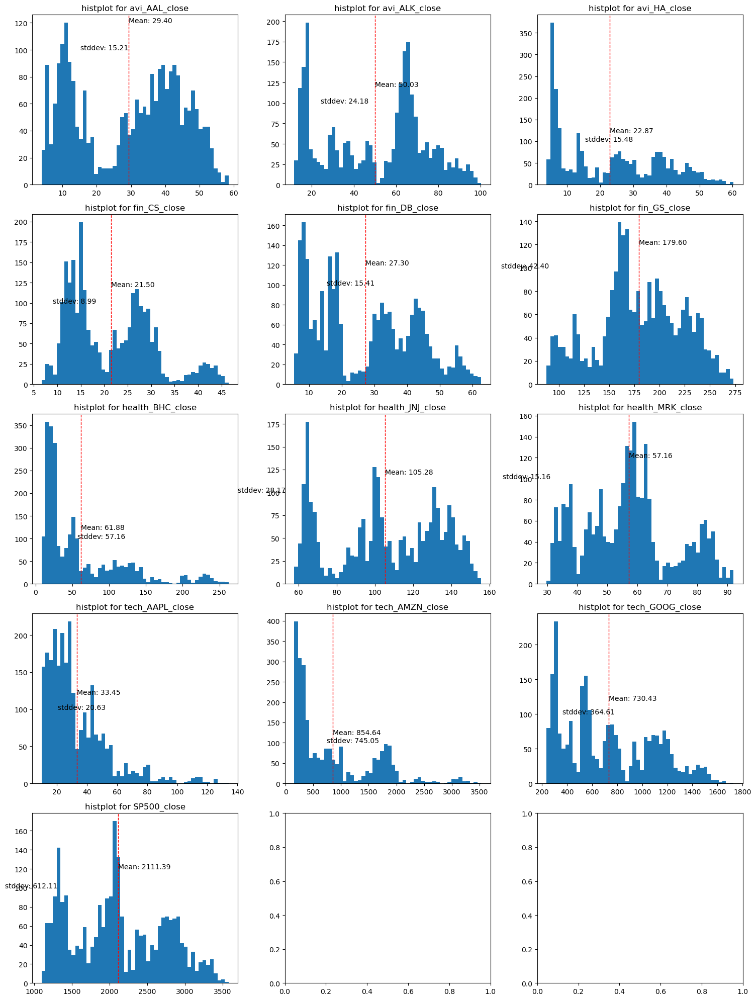

In [45]:
# histogram plots : 

# Defining the number of rows and columns for the subplot grid
rows = 5
cols = 3
total_plots = rows * cols

# Creating a figure and a set of subplots
fig, axs = plt.subplots(rows, cols, figsize=(15, 20)) 

# Flatten the axs array to iterate over each subplot
axs = axs.flatten()
items = final_data.columns
# Creating plots for each subplot
for i, j in enumerate(items):
    axs[i].hist(final_data[j], bins=50)  
    mean_value = np.mean(final_data[j])
    stddev = np.std(final_data[j])
    axs[i].axvline(mean_value, color='red', linestyle='dashed', linewidth=1)
    axs[i].text(mean_value, 120, f'Mean: {mean_value:.2f}', color='black')          # putting mean value in the plot
    axs[i].text(stddev, 100, f'stddev: {stddev:.2f}', color='black')                # putting std dev value in the plot
    axs[i].set_title(f'histplot for {j}')                                           # Set title for each subplot

plt.tight_layout()
plt.show()


#### Stock values with normalisaion (including skewness and kourtosis)

In [46]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [47]:
final_data_scaled = scaler.fit_transform(final_data)
final_data_scaled = pd.DataFrame(final_data_scaled , columns = final_data.columns)

In [48]:
from scipy.stats import skew
from scipy.stats import kurtosis

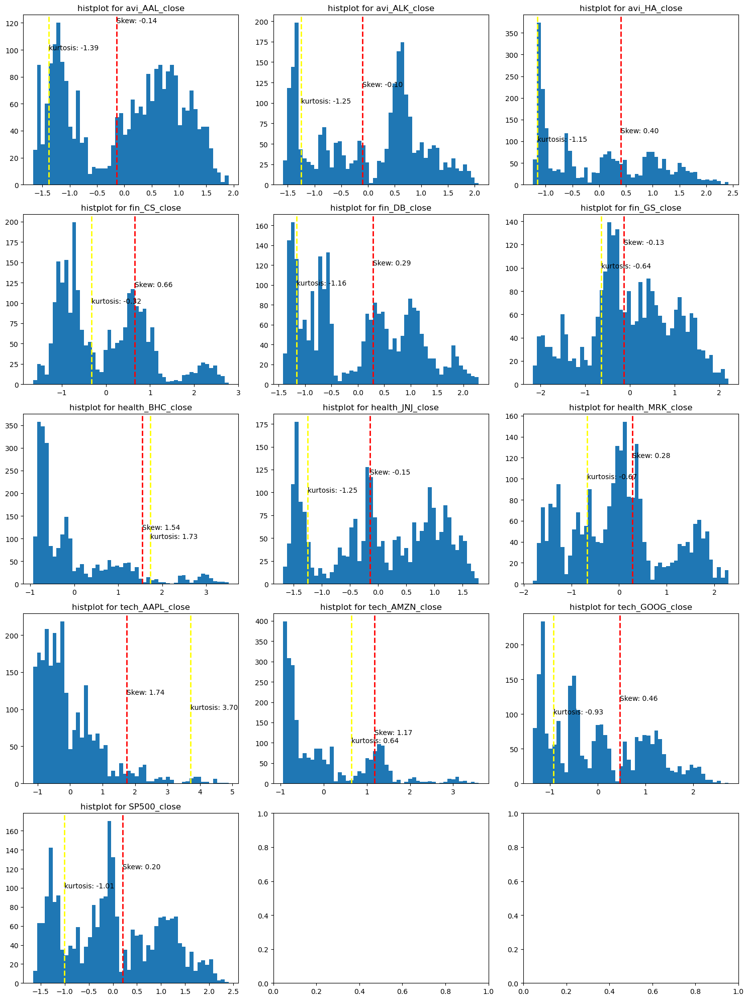

In [49]:
# histogram plots : 

# Defining the number of rows and columns for the subplot grid
rows = 5
cols = 3
total_plots = rows * cols

# Creating a figure and a set of subplots
fig, axs = plt.subplots(rows, cols, figsize=(15, 20)) 

# Flatten the axs array to iterate over each subplot
axs = axs.flatten()
items = final_data_scaled.columns
# Creating plots for each subplot
for i, j in enumerate(items):
    axs[i].hist(final_data_scaled[j], bins=50)  
    skewness_value  = skew(final_data_scaled[j])
    kurtosis_value  = kurtosis(final_data_scaled[j])
    axs[i].axvline(skewness_value , color='red', linestyle='dashed', linewidth=2)
    axs[i].axvline(kurtosis_value , color='yellow', linestyle='dashed', linewidth=2)
    axs[i].text(skewness_value , 120, f'Skew: {skewness_value :.2f}', color='black')       # putting skewness value in the plot
    axs[i].text(kurtosis_value, 100, f'kurtosis: {kurtosis_value:.2f}', color='black')     # putting kurtosis value in the plot
    axs[i].set_title(f'histplot for {j}')                                                  # Set title for each subplot

plt.tight_layout()
plt.show()

In [50]:
# implications of different skewness and kurtosis values : 
# Skewness = S , Kurtosis = K
# scenario 1 : Positive(S) & Positive(K) :Skewed to the right (right-skewed) distribution.Heavy tails and a sharp peak. - propensity for positive returns and higher risk of extreme events.
# scenario 2 : Positive(S) & Negative(K) :Skewed to the right (right-skewed) distribution.Heavy tails and a flat peak. - propensity for positive returns and reduced risk of extreme events
# scenario 3 : Negative(S) & Positive(K) :Skewed to the left (left-skewed) distribution.Heavy tails and a sharp peak. - propensity for negative returns and higher risk of extreme events.
# scenario 4 : Negative(S) & Negative(K) :Skewed to the left (left-skewed) distribution.Thin tails and a flat peak. -  propensity for negative returns and reduced risk of extreme events.

In [51]:
# observations for aviation sector :
# avi_AAL & avi_ALK : scenario 4 : propensity for negative returns and reduced risk of extreme events.
# avi_HA : scenario 2 : propensity for positive returns and reduced risk of extreme events.

In [52]:
# observations for finanicial sector :
# fin_CS & fin_DB : scenario 2 : propensity for positive returns and reduced risk of extreme events.
# fin_GS : scenario 4 : propensity for negative returns and reduced risk of extreme events.

In [53]:
# observations for health sector :
# health_BHC  : scenario 1 : propensity for positive returns and higher risk of extreme events.
# health_JNJ : scenario 4 : propensity for negative returns and reduced risk of extreme events.
# health_MRK : scenario 2 : propensity for positive returns and reduced risk of extreme events.

In [54]:
# observations for tech sector :
# tech_AAPL & tech_AMZN : scenario 1 : propensity for positive returns and higher risk of extreme events.
# tech_GOOG : scenario 2 : propensity for positive returns and reduced risk of extreme events.

In [55]:
# observations for S&P :
# scenario 2 : propensity for positive returns and reduced risk of extreme events.

In [56]:
# Notes :
# It must be noted, that these measures are just for understanding the spread to understand overall volatility. 
# As stocks are time series data, any relevant metrics must take into temporal aspect. The above measures are not reflective of the same.

#### NORMALISISNG WRT INITIAL PRICE

In [57]:
final_data_norm = final_data.reset_index(drop= True)

In [58]:
normalised_final_data = pd.DataFrame(index =final_data_norm.index , columns = final_data_norm.columns)

In [59]:
for col in normalised_final_data.columns:
    normalised_final_data[col] = final_data_norm[col] /final_data_norm.iloc[0][col]

In [60]:
normalised_final_data.head()

,avi_AAL_close,avi_ALK_close,avi_HA_close,fin_CS_close,fin_DB_close,fin_GS_close,health_BHC_close,health_JNJ_close,health_MRK_close,tech_AAPL_close,tech_AMZN_close,tech_GOOG_close,SP500_close
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.981701,0.975497,0.964765,0.992599,0.984035,0.992349,1.004660,0.998704,0.997814,0.986266,1.010930,0.993779,0.991965
2,0.993541,0.981322,0.981544,1.021970,1.025762,1.012661,1.021359,1.017004,1.011475,1.022724,1.046581,1.023991,1.012659
3,0.993541,0.979112,1.001678,1.028677,1.038280,1.021259,1.036505,1.023644,1.011202,1.023609,1.010995,1.016609,1.011978
4,0.994618,0.933922,1.031879,1.034228,1.027395,1.023087,1.033010,1.023806,1.003005,1.023715,1.016655,1.008352,1.010312


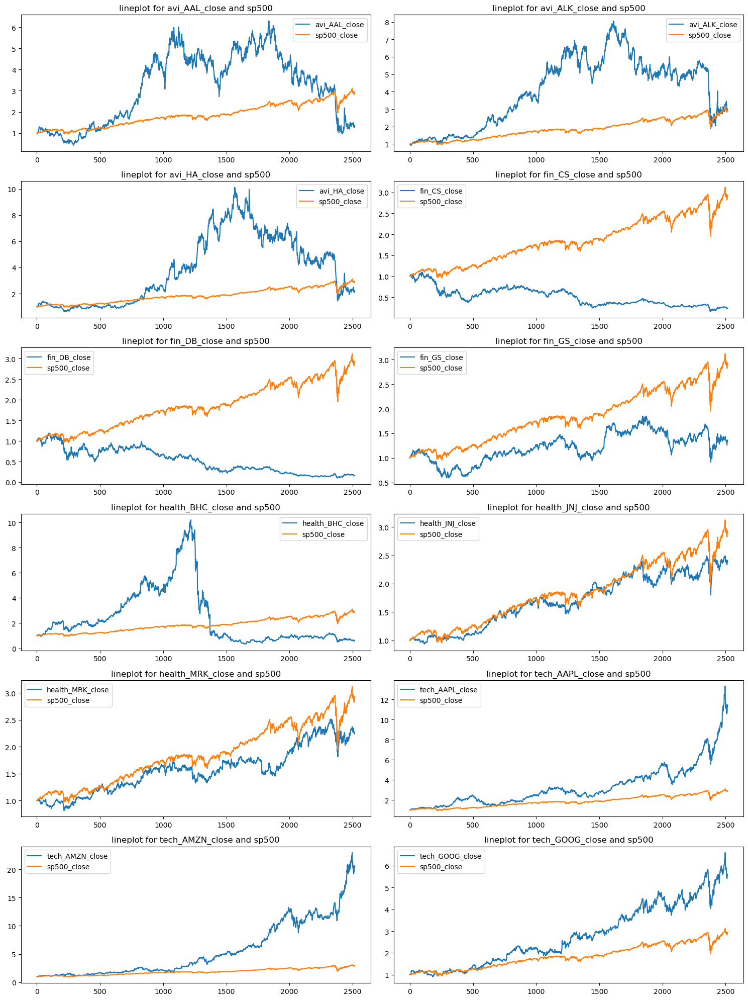

In [61]:
# line plots :
rows = 6
cols = 2
total_plots = rows * cols

# Creating a figure and a set of subplots
fig, axs = plt.subplots(rows, cols, figsize=(15, 20)) 

# Flatten the axs array to iterate over each subplot
axs = axs.flatten()
items = ['avi_AAL_close', 'avi_ALK_close', 'avi_HA_close', 'fin_CS_close','fin_DB_close', 'fin_GS_close', 
         'health_BHC_close', 'health_JNJ_close','health_MRK_close', 'tech_AAPL_close', 'tech_AMZN_close','tech_GOOG_close']

# Creating plots for each subplot
for i, item in enumerate(items):
    df = pd.concat([normalised_final_data[item], normalised_final_data['SP500_close']], axis=1)
    df.columns = [item, 'sp500']
    axs[i].plot(df , label=[item, 'sp500_close'])  
    axs[i].set_title(f'lineplot for {item} and sp500')  # Set title for each subplot
    axs[i].legend()  # Add legend

plt.tight_layout()
plt.show()

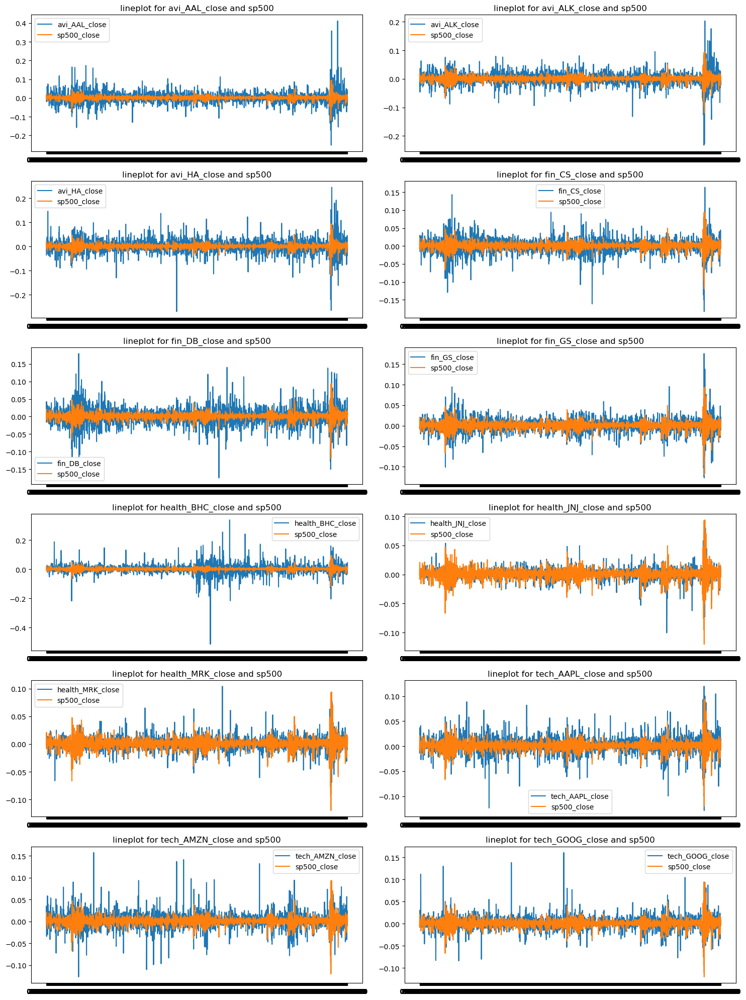

In [62]:
# line plots : 

# Defining the number of rows and columns for the subplot grid
rows = 6
cols = 2
total_plots = rows * cols

# Creating a figure and a set of subplots
fig, axs = plt.subplots(rows, cols, figsize=(15, 20)) 

# Flatten the axs array to iterate over each subplot
axs = axs.flatten()
items = ['avi_AAL_close', 'avi_ALK_close', 'avi_HA_close', 'fin_CS_close','fin_DB_close', 'fin_GS_close', 
         'health_BHC_close', 'health_JNJ_close','health_MRK_close', 'tech_AAPL_close', 'tech_AMZN_close','tech_GOOG_close',]

# Creating plots for each subplot
for i, item in enumerate(items):
    df = pd.concat([return_stocks[item], return_stocks['SP500_close']], axis=1)
    df.columns = [item, 'sp500']
    axs[i].plot(df , label=[item, 'sp500_close'])  
    axs[i].set_title(f'lineplot for {item} and sp500')  # Set title for each subplot
    axs[i].legend()  # Add legend

plt.tight_layout()
plt.show()

In [1]:
# observation : 
# These plots represent volatility with market.
# for ex JNJ stock almost has same volatility a market.
# most of the stock are more valotile than market.
# these plots are in sync with what we calculate later as betas for different stocks to understand relationship with the market index.

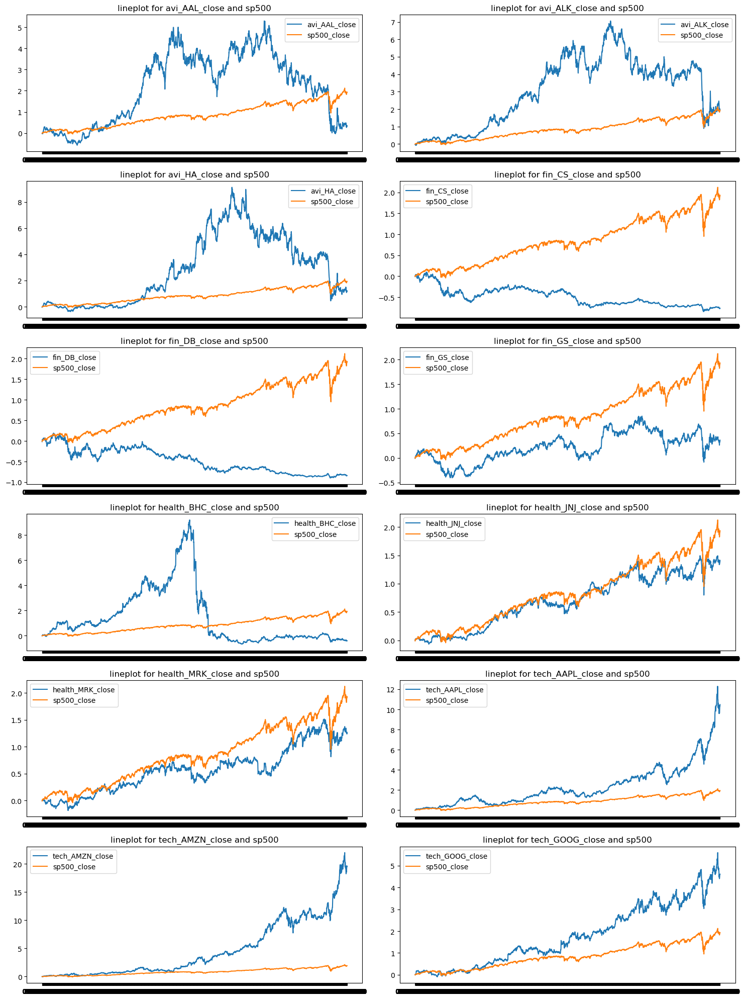

In [64]:
# line plots : 

# Defining the number of rows and columns for the subplot grid
rows = 6
cols = 2
total_plots = rows * cols

# Creating a figure and a set of subplots
fig, axs = plt.subplots(rows, cols, figsize=(15, 20)) 

# Flatten the axs array to iterate over each subplot
axs = axs.flatten()
items = ['avi_AAL_close', 'avi_ALK_close', 'avi_HA_close', 'fin_CS_close','fin_DB_close', 'fin_GS_close', 
         'health_BHC_close', 'health_JNJ_close','health_MRK_close', 'tech_AAPL_close', 'tech_AMZN_close','tech_GOOG_close',]

# Creating plots for each subplot
for i, item in enumerate(items):
    df = pd.concat([cumulative_returns[item], cumulative_returns['SP500_close']], axis=1)
    df.columns = [item, 'sp500']
    axs[i].plot(df , label=[item, 'sp500_close'])  
    axs[i].set_title(f'lineplot for {item} and sp500')  # Set title for each subplot
    axs[i].legend()  # Add legend

plt.tight_layout()
plt.show()

In [2]:
# observation : 
# these plots almost mimic the plots for normalised stock datas. 
# clearly DB and GS stocks performs worse than market.
# JNJ and MRK follow market closely Can be onsidered as safer stocks.

In [3]:
# AAL and ALK had an uptrend earlier , but in recent past show downward pattern.
# for good returns, we can see the performance of tech stocks which exhibits promosing returns.

#### correlation analysis for stocks daily returns : 

In [65]:
# correlation among daily returns for stocks belonging to aviation sector 
avi_corr = return_stocks.iloc[:,:3].corr()
# correlation among daily returns for stocks belonging to finance sector 
fin_corr = return_stocks.iloc[:,3:6].corr()
# correlation among daily returns for stocks belonging to health sector 
health_corr = return_stocks.iloc[:,6:9].corr()
# correlation among daily returns for stocks belonging to tech sector 
tech_corr = return_stocks.iloc[:,9:12].corr()
# correlation among daily returns for all stocks
all_corr = return_stocks.corr()

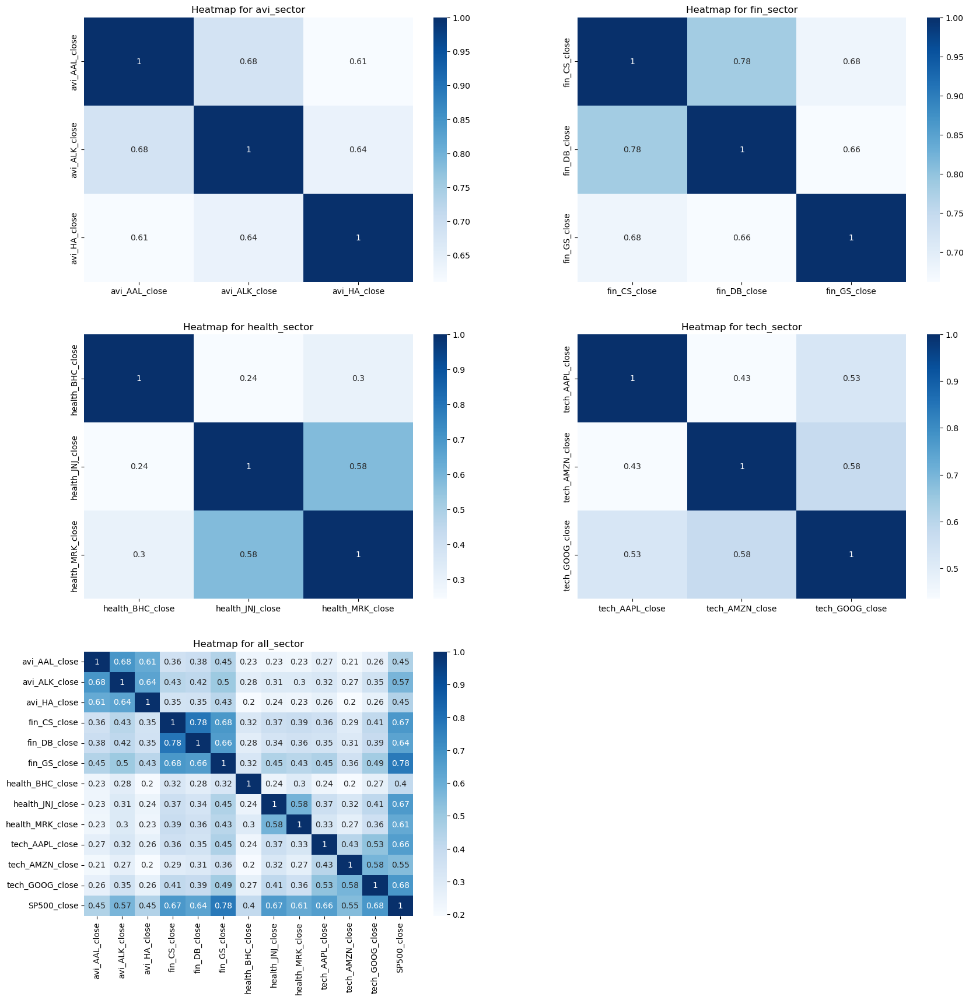

In [66]:
# Define the number of rows and columns for the subplot grid
rows = 3
cols = 2
total_plots = rows * cols

# Create a figure and a set of subplots
fig, axs = plt.subplots(rows, cols, figsize=(20, 20)) 

# Flatten the axs array to iterate over each subplot
axs = axs.flatten()
items = [avi_corr, fin_corr, health_corr, tech_corr, all_corr]
sectors = ['avi_sector', 'fin_sector', 'health_sector', 'tech_sector', 'all_sector']

# Creating plots for each subplot
for i, j in enumerate(items):
    sns.heatmap(j, cmap='Blues', annot=True, ax=axs[i])
    axs[i].set_title(f'Heatmap for {sectors[i]}')  # Set title for each subplot with the corresponding data
    
# delete additional plot
fig.delaxes(axs[5])

# Show all subplots
plt.show()

In [67]:
# A good strong correlation reflects that change of one stock can be reflected similarly in the other stock as well.


# Obseravations intra_sector wise: 
# In Aviation sector, all the stocks seems to have good correlation among them. So one stocks good returns will imply good return for other stocks as well.
# In finance sector, same relation can be observed.
# In health, health_MRK and health_JNJ has good correlation among them.
# In tech , tech_AMZN and tech_GOOG has stronger correlation.

In [68]:
# Obseravations inter_sector wise: 
# Aviation and Finance sectors have good strong correlation among all. 
# So, if one of the sectors perform well, then it can be expected that the other will also perform well.
# finance sector is , in general, well correlated with all other sectors.
# Almost all stocks has good consistency with S&P market index, fin_GS being the highest (almost 0.8). 

## 3. STOCK SELECTION USING CAPM : 

In [69]:
# defining capm function to evaluate expected rate of return for different stocks

# Ri : Expected return 
# Rf : Risk-free rate = Daily_Risk_Free_Rate (defined earlier based on 10 year US treasury bond)
# Rm : Market rate 

# (Ri - Rf) = alpha + beta * (Rm - Rf)


#calculating market rate Rm:

sp500 = final_data['SP500_close']
sp500.index = pd.to_datetime(sp500.index , format = '%d-%m-%Y')

# Aggregate data into yearly intervals and calculate annual returns
yearly_data = sp500.resample('Y').last()  # Resample to yearly intervals and use last observation
yearly_returns = yearly_data.pct_change()  # Calculate yearly returns as percentage change

# Compute average annual return over the 10-year period
average_annual_return = yearly_returns.mean()

Rm = average_annual_return

Rf = 0.0075                                                           # as per information provided

# Importing the library
import statsmodels.api as sm


# defining function to calculate alpha and beta

def capm(k):
    k = return_stocks[k]
    SP500 = return_stocks['SP500_close']
    
    # Adding a constant for the regression equation
    X = sm.add_constant(SP500)
    
    # make regression model 
    model = sm.OLS(k, X)
    
    # fitting 
    results = model.fit()
    
    return results.params[0] , results.params[1]

# defining function for expected rate of return

def ERR(m):
    Ri = Rf + capm(m)[0] + capm(m)[1] * (Rm - Rf)
    return Ri*100


In [70]:
average_annual_return

0.10935609864794267

In [71]:
# creating dictionary for the beta callues for each stock

items = ['avi_AAL_close', 'avi_ALK_close', 'avi_HA_close', 'fin_CS_close',
       'fin_DB_close', 'fin_GS_close', 'health_BHC_close', 'health_JNJ_close',
       'health_MRK_close', 'tech_AAPL_close', 'tech_AMZN_close',
       'tech_GOOG_close']
metrics_cols = ['avi_AAL', 'avi_ALK', 'avi_HA', 'fin_CS', 'fin_DB', 'fin_GS',
       'health_BHC', 'health_JNJ', 'health_MRK', 'tech_AAPL', 'tech_AMZN',
       'tech_GOOG']
beta = {}
expected_return_CAPM = {}

for i, item in enumerate(items):
    beta[metrics_cols[i]] = capm(item)[1]
    expected_return_CAPM[metrics_cols[i]] = ERR(item)

In [72]:
# Rows to be added
new_row_1= pd.DataFrame(beta , index =['beta'])
new_row_2= pd.DataFrame(expected_return_CAPM , index =['annual_expected_return_CAPM_percent'])

# adding the rows
metrics = pd.concat([metrics, new_row_1, new_row_2], ignore_index=False)

In [73]:
metrics.head(11)

,avi_AAL,avi_ALK,avi_HA,fin_CS,fin_DB,fin_GS,health_BHC,health_JNJ,health_MRK,tech_AAPL,tech_AMZN,tech_GOOG,SP500
stock_price_volatility,15.211889,24.18702,15.483034,8.988043,15.409974,42.405475,57.170002,28.174233,15.164505,20.630118,745.201139,364.68572,612.227235
historic_Max,58.470001,100.239998,60.299999,46.513672,62.624046,273.380005,262.519989,155.509995,92.040001,134.179993,3531.449951,1728.280029,3580.840088
historic_Min,4.0,11.62,3.78,6.67,5.48,87.699997,8.51,57.66,29.809999,9.951428,153.029999,236.553345,1099.22998
average_daily_return,0.000637,0.000709,0.000765,-0.000325,-0.000381,0.000291,0.000464,0.000409,0.00041,0.001128,0.001398,0.000818,0.000488
daily_return_volatility,0.032726,0.023562,0.030147,0.022206,0.026374,0.018331,0.0357,0.010847,0.013049,0.017719,0.019889,0.016288,0.010934
cumulative_daily_return_in_percent,32.292788,194.275967,116.275168,-76.389269,-84.029028,36.066354,-39.650485,141.101223,126.639348,1047.77005,1948.487305,461.283184,193.394056
annualised_Sharpe_Ratio,0.298997,0.464206,0.392136,-0.246937,-0.241861,0.233864,0.197303,0.568276,0.474198,0.991937,1.099157,0.776856,0.678713
beta,1.353609,1.231512,1.233534,1.370002,1.537546,1.301286,1.315971,0.662233,0.733475,1.063349,0.998802,1.013338,NaN
annual_expected_return_CAPM_percent,14.534973,13.304553,13.330622,14.604959,16.297682,13.969943,14.136171,7.503809,8.22613,11.641735,11.014436,11.103774,NaN


In [74]:
# Observations for beta values:
# it seems all the finance and aviation sector stocks are having beta more than 1 , so all of them more volatile than the market.
# health sector stocks , except for health_BHC , are less volatile compared to market.
# tech stocks more or less imitates the market.

# these beta values also can be visualised in the line plots cretaed earlier (to understand volatility compared to market)

In [75]:
# Observations for annual_expected_return_CAPM_percent :
# all aviation and finance sector stocks are providing returns of around 14-15% based on past data.
# health_JNJ  and health_MRK are providing less returns , but considering less beta will be more suitable per clint requirements.
# tech stocks returns are around 11%.

#### stock selection based on investor details

In [76]:
### based on information provided about Ms. Alexandra Kolishnyick, we can propose following investing strategy : 

# 1. Conservative Investment Approach: Since Ms. Kolishnyick is conservative and prefers stable investments, 
#     the focus will be on selecting stocks with stable growth prospects, and lower volatility.
#     This will help preserve capital while generating steady returns over time.

# 2. Diversification: Diversification is essential to reduce risk. A well-diversified portfolio will consist of stocks 
#    from different sectors and industries. This will help mitigate the impact of any adverse events 
#    affecting a particular sector or industry.

# 3. Focus on Quality Stocks: The investment strategy will prioritize quality stocks of established companies 
#    with a proven track record of profitability, strong management teams, and competitive advantages
#    (such as brand recognition, intellectual property, or market dominance).

# 4. Emphasis on ESG (Environmental, Social, and Governance) Criteria: Given Ms. Kolishnyick's intention to establish 
#    an NGO later to support the sub-Saharan African region, investments in companies with strong ESG practices can align with
#    her values and long-term goals. ESG criteria can include factors such as environmental sustainability
#    social responsibility, and ethical governance.
   

In [77]:
metrics.head(9)

,avi_AAL,avi_ALK,avi_HA,fin_CS,fin_DB,fin_GS,health_BHC,health_JNJ,health_MRK,tech_AAPL,tech_AMZN,tech_GOOG,SP500
stock_price_volatility,15.211889,24.18702,15.483034,8.988043,15.409974,42.405475,57.170002,28.174233,15.164505,20.630118,745.201139,364.68572,612.227235
historic_Max,58.470001,100.239998,60.299999,46.513672,62.624046,273.380005,262.519989,155.509995,92.040001,134.179993,3531.449951,1728.280029,3580.840088
historic_Min,4.0,11.62,3.78,6.67,5.48,87.699997,8.51,57.66,29.809999,9.951428,153.029999,236.553345,1099.22998
average_daily_return,0.000637,0.000709,0.000765,-0.000325,-0.000381,0.000291,0.000464,0.000409,0.00041,0.001128,0.001398,0.000818,0.000488
daily_return_volatility,0.032726,0.023562,0.030147,0.022206,0.026374,0.018331,0.0357,0.010847,0.013049,0.017719,0.019889,0.016288,0.010934
cumulative_daily_return_in_percent,32.292788,194.275967,116.275168,-76.389269,-84.029028,36.066354,-39.650485,141.101223,126.639348,1047.77005,1948.487305,461.283184,193.394056
annualised_Sharpe_Ratio,0.298997,0.464206,0.392136,-0.246937,-0.241861,0.233864,0.197303,0.568276,0.474198,0.991937,1.099157,0.776856,0.678713
beta,1.353609,1.231512,1.233534,1.370002,1.537546,1.301286,1.315971,0.662233,0.733475,1.063349,0.998802,1.013338,NaN
annual_expected_return_CAPM_percent,14.534973,13.304553,13.330622,14.604959,16.297682,13.969943,14.136171,7.503809,8.22613,11.641735,11.014436,11.103774,NaN


In [78]:
# we will choose stocks based on the following metrics

# 1. beta
# 2. cumulative_daily_return_in_percent

In [79]:
# as the fin_CS , fin_DB and health_BHC stock values have declined, we will not conider these three.
# as the potential investor has conservative approach, we need to be cautious while selecting stocks having beta more than 1.

# Avaiation :
# avi_AAL : beta is higher than 1 and cumulative return is 32 % . Stock price volatility is lesser.
# avi_ALK : beta is higher than 1 and cumulative return is 194 % . Stock price volatility is lesser.
# avi_HA :  beta is higher than 1 and cumulative return is 116 % . Stock price volatility is lesser.

# we can consider avi_HA from this sector , considering less beta and highest cumulative_daily_return.


# finance : 

# we can consider fin_GS from this sector , considering least beta and comparable cumulative_daily_return.

# health :

# health_JNJ and health_MRK : both can be considered as both have lesser betas among all stocks and providing stable returns 
#                            -- which is allinged with client's conservative persona.

# tech :

# all the tech stocks are exhibiting similar attributes. Beta is around 1 . Expected return around 11%. So we can pick all the stocks.


#### Portfolio risk and Sharpe ratio

In [80]:
portfolio_stocks = ['avi_ALK_close','avi_HA_close','fin_GS_close','health_JNJ_close' ,'health_MRK_close' , 'tech_AAPL_close',
                    'tech_AMZN_close', 'tech_GOOG_close']

In [81]:
# calculation of portfolio risk

![Portfolio_Risk](Portfolio_risk_image.jpg)

By looking into the portfolio standard deviation formula, we need three elements:
- Portfolio weight array
- Portfolio covariance matrix
- Transpose of portfolio weight array

In [82]:
# Covariance matrix for the portfolio

# defining function to calculate portfolio risk

def port_risk(S):
    covariance_portfolio = return_stocks[S]
    covariance_portfolio = (covariance_portfolio.cov())*252

    # Applying the matrix operations mentioned in the image above 
    # we will consider same weight for all the chosen stocks(7 stocks)
    initial_weight = np.array([1/len(S)]*len(S))

    portfolio_variance = np.dot(initial_weight.T,np.dot(covariance_portfolio, initial_weight))

    # Standard deviation (risk of portfolio)
    portfolio_risk = np.sqrt(portfolio_variance)
    return portfolio_risk

# defining function to calculate annualised sharpe ratio for the portfolio

def annual_sharpe_ratio(S):
    
    initial_weight = np.array([1/len(S)]*len(S))
    
    portfolio = return_stocks[S]
    portfolio['Portfolio_Daily_Return'] = portfolio.dot(initial_weight)

    # the daily risk free rate is = Daily_Risk_Free_Rate (calculated earlier)
    Daily_Risk_Free_Rate = 2.0471483068718044e-05
    
    Sharpe_Ratio = (portfolio['Portfolio_Daily_Return'].mean() - Daily_Risk_Free_Rate) / portfolio['Portfolio_Daily_Return'].std()
    Annualised_Sharpe_Ratio = (252**0.5)*Sharpe_Ratio
    
    return Annualised_Sharpe_Ratio

In [83]:
port_risk(portfolio_stocks)

0.2020930421017587

In [84]:
annual_sharpe_ratio(portfolio_stocks)

0.8983116814132895

In [85]:
# the risk is quite low, but sharpe ratio is less than 1 , which may not be attractive.

In [86]:
# Lets explore different combinations of stocks to get better idea 

import itertools

# List of stocks
portfolio_stocks = ['avi_ALK_close','avi_HA_close','fin_GS_close','health_JNJ_close' ,'health_MRK_close' , 'tech_AAPL_close',
                    'tech_AMZN_close', 'tech_GOOG_close']

# Number of stocks to choose 

def optimum_stocks(m):

    # initiating empty dataframe

    comb = []
    risk = []
    sharpe = []

    # Generate combinations of 3 stocks
    stock_combinations = list(itertools.combinations(portfolio_stocks, m))

    port_data = pd.DataFrame(index=range(len(stock_combinations)) ,columns = ['combo' , 'risk' ,'sharpe'])

    for combination in stock_combinations:
        comb.append(combination)
        risk.append(port_risk(list(combination)))
        sharpe.append(annual_sharpe_ratio(list(combination)))

    port_data['combo'] = comb
    port_data['risk'] = risk
    port_data['sharpe'] = sharpe

    # Set the maximum column width
    pd.set_option('display.max_colwidth', 100)
    return port_data

In [87]:
# defining function to visualise risk vs sharpe ratio scatter plot

def opti_scatter(m):
    x_values = optimum_stocks(m)['risk']
    y_values = optimum_stocks(m)['sharpe']

    # Plot scatter plot
    plt.scatter(x_values , y_values)

    # Add index labels to points
    for i, (x, y) in enumerate(zip(x_values, y_values)):
        plt.text(x, y, str(i), fontsize=12, ha='center', va='bottom')

    # Add labels and title
    plt.xlabel('Risk')
    plt.ylabel('Sharpe ratio')
    plt.title(f'plot with {m} stocks')

    # Display the plot
    plt.show()

In [88]:
# defining function to calculate portfolio cumulative daily return over the duration

def port_return(port_stock , S):

    #initial weight
    initial_weight = np.array([1/S]*S)
    
    port_df = return_stocks[port_stock]
    port_df['Portfolio_Daily_Return'] = port_df.dot(initial_weight)
    
    # Cumulative return from the portfolio
    Cumulative_returns_daily = (1+port_df).cumprod() - 1
    
    return Cumulative_returns_daily.iloc[-1][-1] * 100 
    
    
    

In [89]:
# average annual return
def annual_return(stock):
    stock = final_data[stock]
    stock.index = pd.to_datetime(stock.index , format = '%d-%m-%Y')

    # Aggregate data into yearly intervals and calculate annual returns
    yearly_data = stock.resample('Y').last()  # Resample to yearly intervals and use last observation
    yearly_returns = yearly_data.pct_change()  # Calculate yearly returns as percentage change

    # Compute average annual return over the 10-year period
    average_annual_return = yearly_returns.mean()
    
    return average_annual_return

### Combination of 3 stocks

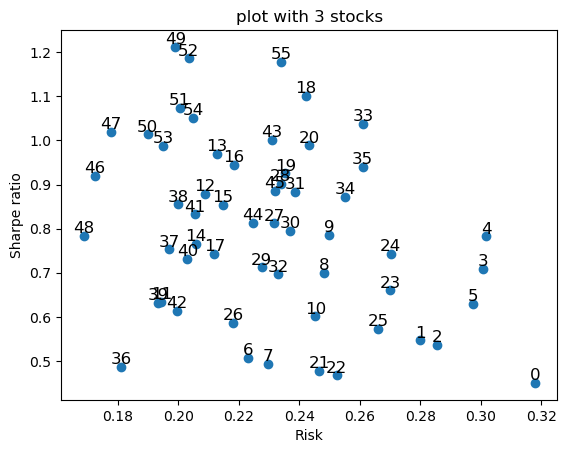

In [90]:
opti_scatter(3)

In [91]:
# as evident, we need to access index 49 to have the best combination of stocks

optimum_stocks(3).loc[49]

combo     (health_JNJ_close, tech_AAPL_close, tech_AMZN_close)
risk                                                  0.199071
sharpe                                                1.212127
Name: 49, dtype: object

In [92]:
# so we have the optimum portfolio which contains three stocks 
# health_JNJ_close, tech_AAPL_close, tech_AMZN_close

In [93]:
# cumulative daily portfolio return 
port_stock = ['health_JNJ_close', 'tech_AAPL_close', 'tech_AMZN_close']
port_return(port_stock , 3)

860.2145932361676

In [94]:
# calculating average annual return of each stock and the portfolio
return_rate = []
port_stock = ['health_JNJ_close', 'tech_AAPL_close', 'tech_AMZN_close']
for stock in port_stock:
    return_rate.append(annual_return(stock))
portfolio_annual_return = np.array(return_rate).mean()

In [95]:
portfolio_annual_return

0.2566788789231346

### Combination of 4 stocks

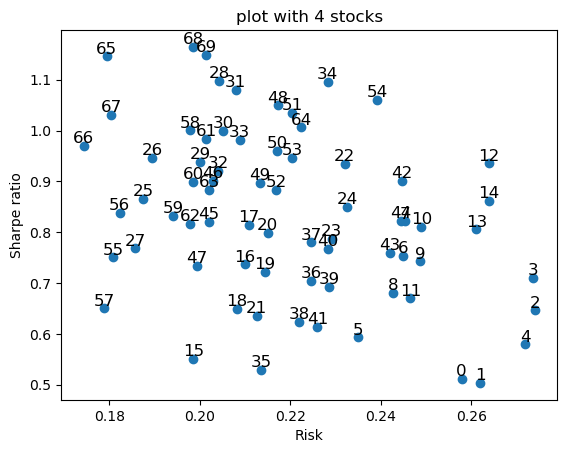

In [96]:
opti_scatter(4)

In [97]:
# as evident, we need to access index 68 to have the best combination of stocks

optimum_stocks(4).loc[68]

combo     (health_JNJ_close, tech_AAPL_close, tech_AMZN_close, tech_GOOG_close)
risk                                                                   0.198523
sharpe                                                                  1.16455
Name: 68, dtype: object

In [98]:
# so we have the optimum portfolio which contains four stocks 
# health_JNJ_close, tech_AAPL_close, tech_AMZN_close, tech_GOOG_close

In [99]:
# cumulative daily portfolio return 
port_stock = ['health_JNJ_close', 'tech_AAPL_close', 'tech_AMZN_close','tech_GOOG_close']
port_return(port_stock , 4)

769.0117818859688

In [100]:
# calculating average annual return of each stock and the portfolio
return_rate = []
port_stock = ['health_JNJ_close', 'tech_AAPL_close', 'tech_AMZN_close','tech_GOOG_close']
for stock in port_stock:
    return_rate.append(annual_return(stock))
portfolio_annual_return = np.array(return_rate).mean()

In [101]:
portfolio_annual_return

0.2401484386093775

### Combination of 5 stocks

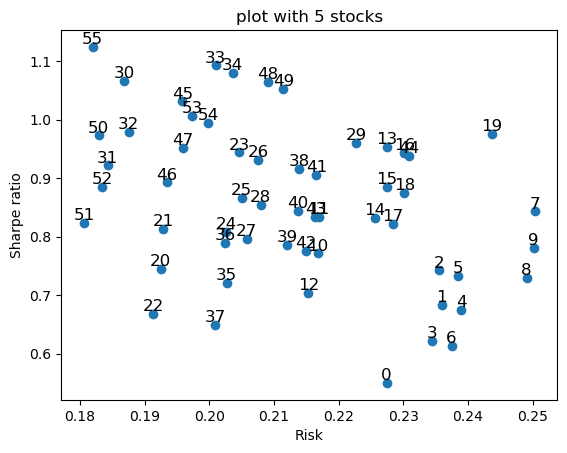

In [102]:
opti_scatter(5)

In [103]:
# as evident, we need to access index 55 to have the best combination of stocks

optimum_stocks(5).loc[55]

combo     (health_JNJ_close, health_MRK_close, tech_AAPL_close, tech_AMZN_close, tech_GOOG_close)
risk                                                                                     0.181968
sharpe                                                                                   1.124363
Name: 55, dtype: object

In [104]:
# so we have the optimum portfolio which contains four stocks 
# health_JNJ_close, health_MRK_close, tech_AAPL_close, tech_AMZN_close, tech_GOOG_close

In [105]:
# cumulative daily portfolio return 
port_stock = ['health_JNJ_close', 'health_MRK_close', 'tech_AAPL_close', 'tech_AMZN_close','tech_GOOG_close']
port_return(port_stock , 5)

587.7284819872185

In [106]:
# calculating average annual return of each stock and the portfolio
return_rate = []
port_stock = ['health_JNJ_close', 'health_MRK_close', 'tech_AAPL_close', 'tech_AMZN_close','tech_GOOG_close']
for stock in port_stock:
    return_rate.append(annual_return(stock))
portfolio_annual_return = np.array(return_rate).mean()

In [107]:
portfolio_annual_return

0.21111678636361467

In [108]:
# lets go ahead with 3 stocks which have highest portfolio return
port_stock = ['health_JNJ_close', 'tech_AAPL_close', 'tech_AMZN_close']

## 4. STOCK PRICE VALIDATION

### LOADING PORTFOLIO STOCKS AND MARKET INDEX

In [109]:
# load tech sectorwise data
AAPL = pd.read_csv('AAPL.csv')
AMZN = pd.read_csv('AMZN.csv')
JNJ = pd.read_csv('JNJ.csv')
MRK = pd.read_csv('MRK.csv')
GOOG = pd.read_csv('GOOG.csv')
SP500 = pd.read_csv('S&P500.csv')


### DEFINING DIFFERENT USEFUL FUNCTIONS TO MODULARISE CODE

In [110]:
# selecting relevant columns for VAR model prediction
# we have introduced a derived feature to increase predictability of the stocks.
# SMA_30 = simple moving average with a rolling windo of 30 ays.

def selected_stock_data(X):
    X['SMA_30'] = X['Close'].rolling(window=30).mean()
    X = X.dropna(axis = 0)
    X = X[['Close' ,'Volume','SMA_30']]
    X.reset_index(inplace = True , drop = True)
    return X

In [111]:
# checking whether series has trend, seasonality or any patterns
def trend_check(X):
    from pylab import rcParams
    import statsmodels.api as sm
    from statsmodels.tsa.seasonal import seasonal_decompose
    from dateutil.parser import parse
    
    # Additive seasonal decomposition for all stocks

    for col in X.columns:
        rcParams['figure.figsize'] = 12, 8
        add_result = seasonal_decompose(X[col], model='additive', period =1) # additive seasonal index
        fig = add_result.plot()
        plt.show()
        
    # Multiplicative seasonal decomposition for J&J

    for col in X.columns:
        mul_result = seasonal_decompose(X[col], model='multiplicative', period=1) # multiplicative seasonal index
        fig = mul_result.plot()
        plt.show()

In [112]:
# Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test to check for stationarity

def stationarity_test(X):
    from statsmodels.tsa.stattools import kpss

    for col in X.columns:
        kpss_test = kpss(X[col])

        print(col)
        print('KPSS Statistic: %f' % kpss_test[0])
        print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
        print('p-value: %f' % kpss_test[1])

        if kpss_test[1] <= 0.05:
            print("\nSeries is Non-Stationary")
        else:
            print("\nSeries is Stationary")

        print('\n--------------------------------------\n')

In [113]:
# series before boxcox transformation
def plot_before_boxcox(X):
    for col in X.columns:
        plt.figure(figsize=(12,4))
        plt.plot(X[col], label='Before Box Cox tranformation')
        plt.legend(loc='best')
        plt.title(f'Before Box Cox transform_{col}')
        plt.show()

In [114]:
# Plotting all boxcox transformed columns
def plot_after_boxcox(X):
    for col in X.columns:
        plt.figure(figsize=(12,4))
        plt.plot(X[col], label='After Box Cox tranformation')
        plt.title(f'After Box Cox transform_{col}')
        plt.legend(loc='best')
        plt.show()

In [115]:
# Plotting all data_differenced columns
def plot_after_differencing(X):
    for col in X.columns:
        plt.figure(figsize=(12,4))
        plt.plot(X[col], label='After differencing')
        plt.title(f'After differencing_{col}')
        plt.legend(loc='best')
        plt.show()

In [116]:
# Function for inverting the Differencing and boxcox Transformation
def invert_transformation(train_data, forecasted):
    
    train_data.columns = ['Close', 'Volume', 'SMA_30']
    
    for col in train_data.columns:

        # Undo the 1st Differencing
        forecasted[col] = train_data.iloc[-1][col] + forecasted[col].cumsum()
        # Undo the boxcox transform
        forecasted[col] = np.exp(forecasted[col])
       

    return forecasted

In [117]:
# Printing the train, test and forecasted values
def plot_train_test_forecasted(X,Y):
    for col in X.columns:
        plt.figure(figsize=(15,4))
        plt.plot(X[col][:train_len], label='Train')
        plt.plot(X[col][train_len:], label='Test')
        plt.plot(Y[col][:], label='VAR forecast')
        plt.legend(loc='best')
        plt.title(col)
        plt.show()

In [118]:
# Comparing the test and forecasted values
def plot_test_forecasted(X,Y):
    for col in X.columns:
        plt.figure(figsize=(15,4))
        plt.plot(X[col][train_len:], label='Test')
        plt.plot(Y[col][:], label='VAR forecast')
        plt.legend(loc='best')
        plt.title(col)
        plt.show()

In [119]:
# Model Evaluation
def model_evaluation(X,Y):
    from sklearn.metrics import mean_squared_error

    eval_results = pd.DataFrame(columns=['Column', 'RMSE', 'MAPE'])
    tempResults = pd.DataFrame(columns=['Column', 'RMSE', 'MAPE'])

    for col in X.columns:
        rmse = np.sqrt(mean_squared_error(X[col][train_len:], Y[col][:])).round(2)
        mape = np.round(np.mean(np.abs(X[col][train_len:]-Y[col][:])/X[col][train_len:])*100,2)

        tempResults = pd.DataFrame({'Column':[col], 'RMSE': [rmse],'MAPE': [mape] })
        eval_results = pd.concat([eval_results, tempResults])

    return eval_results

### PORTFOLIO STOCK  #1 
### FORECASTING 'AAPL' (APPLE) COMPANY STOCK VALUE

In [120]:
# extracing the data with relevant columns
AAPL = selected_stock_data(AAPL)

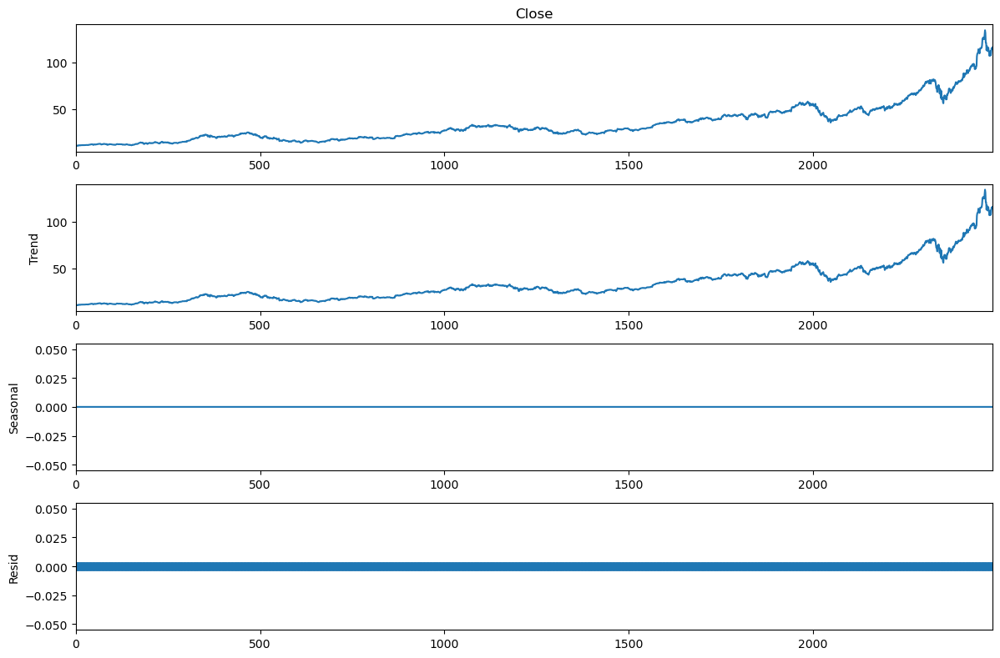

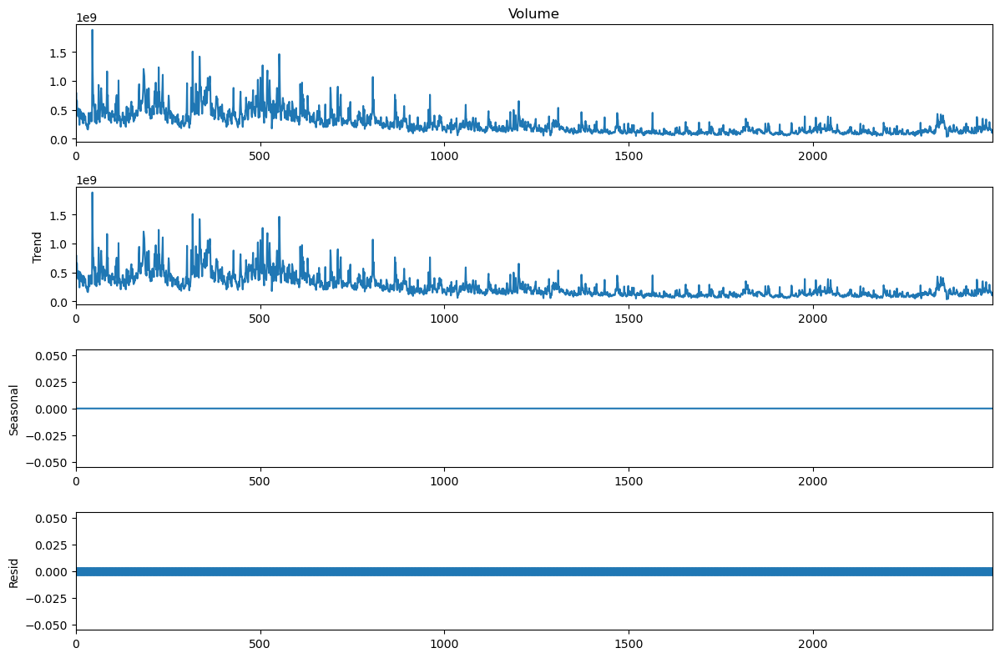

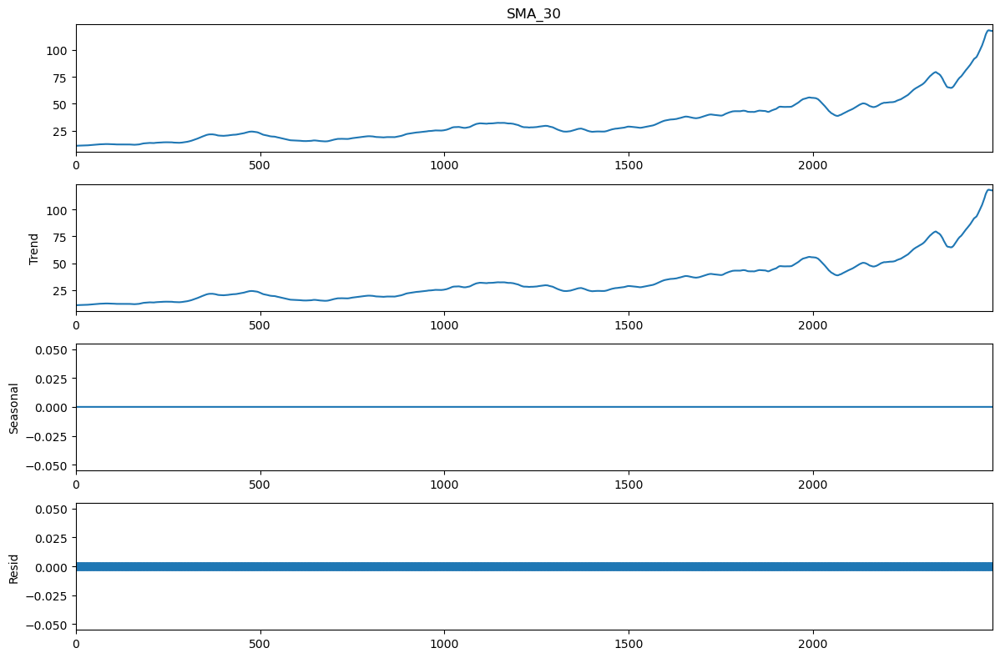

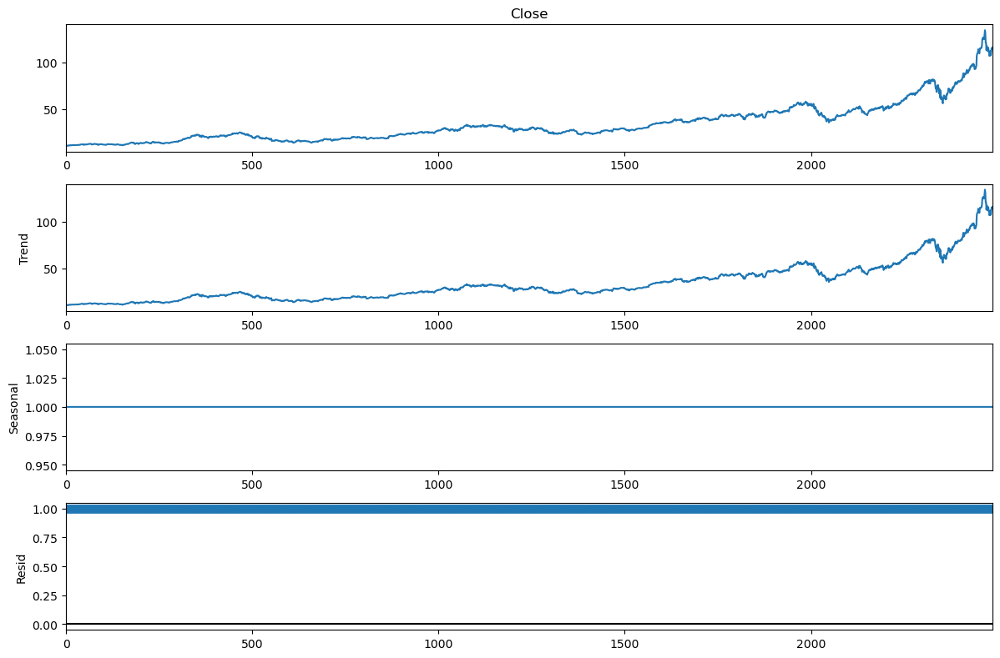

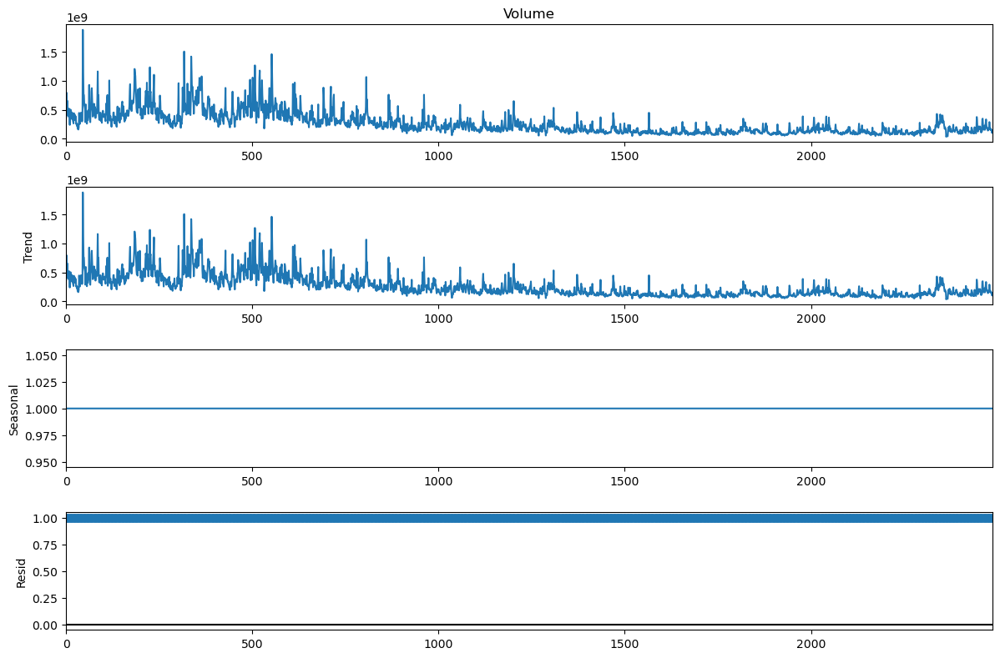

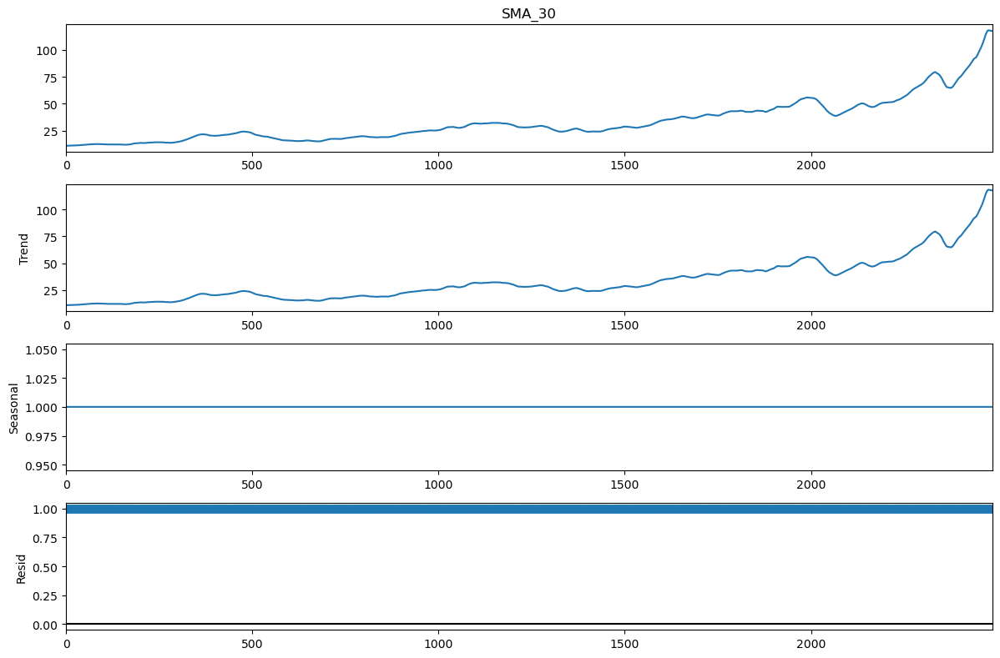

In [121]:
# checking whether series has trend, seasonality or any patterns
trend_check(AAPL)

In [122]:
# its evident, we have trend component in the data as expected, but no seasonailty.

In [123]:
# Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test to check for stationarity
stationarity_test(AAPL)

Close
KPSS Statistic: 6.051385
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Non-Stationary

--------------------------------------

Volume
KPSS Statistic: 6.368583
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Non-Stationary

--------------------------------------

SMA_30
KPSS Statistic: 6.246469
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Non-Stationary

--------------------------------------



C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(


In [124]:
# as expected, all the variables in stock data are Non-Stationary. We will be addressing these by transforming the data. 

## 1. Boxcox Transformation

## 2. diffrencing

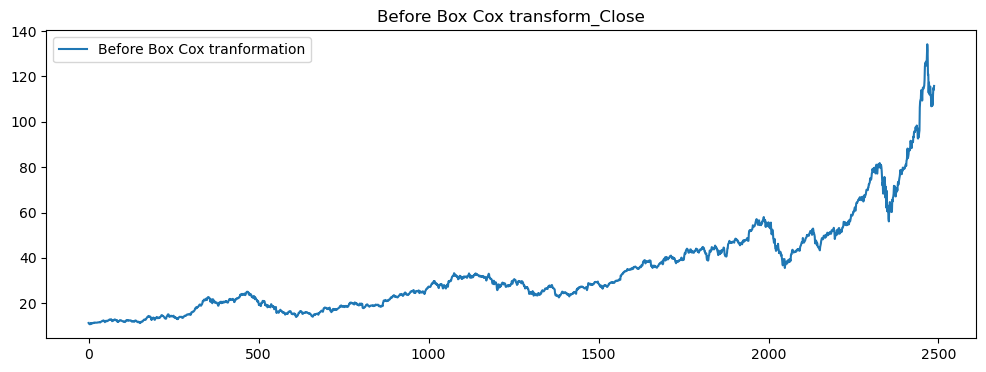

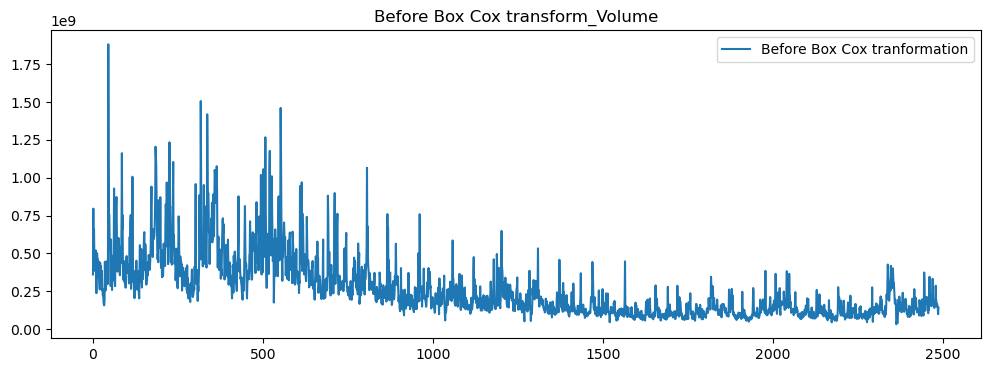

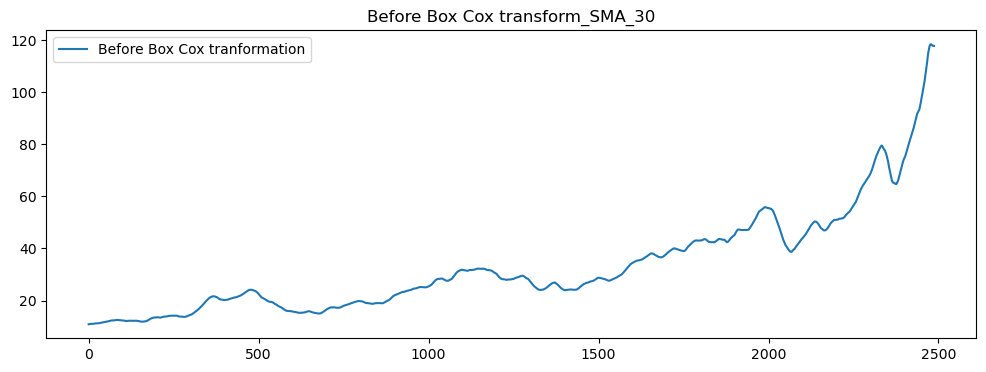

In [125]:
# series before boxcox transformation
plot_before_boxcox(AAPL)

In [126]:
#Using Boxcox method

from scipy.stats import boxcox

AAPL_boxcox = pd.DataFrame(columns=[AAPL.columns])  # Empty dataframe

for col in AAPL.columns:
    temp_data = pd.Series(boxcox(AAPL[col], lmbda=0), index = AAPL.index, name = col)
    AAPL_boxcox[col] = temp_data

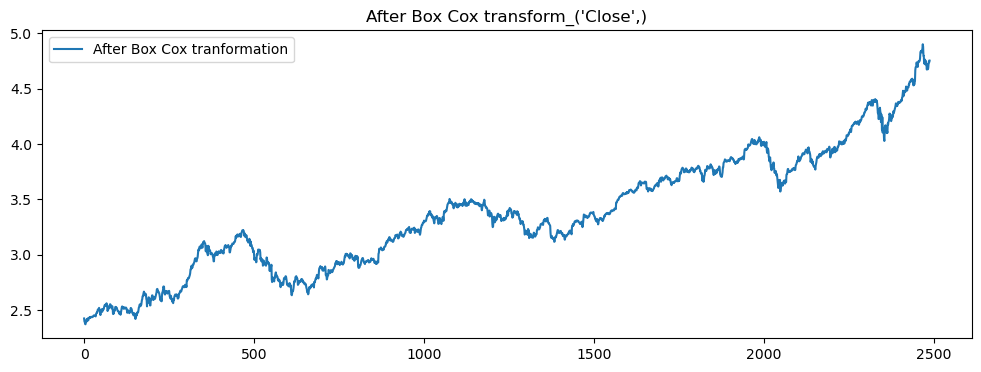

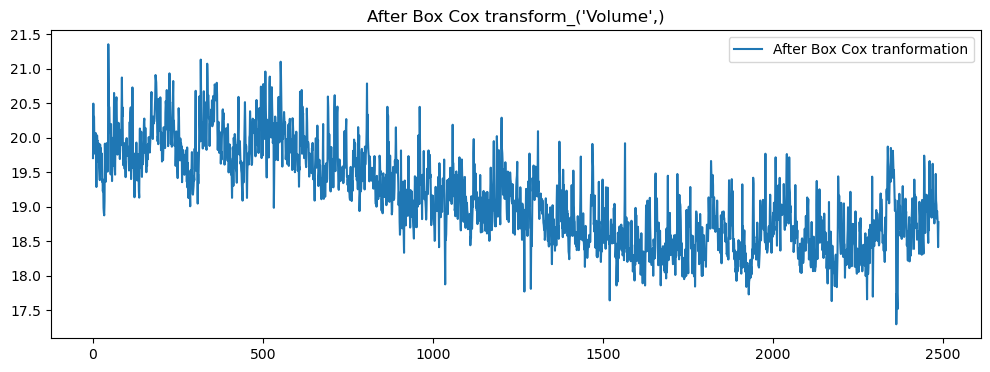

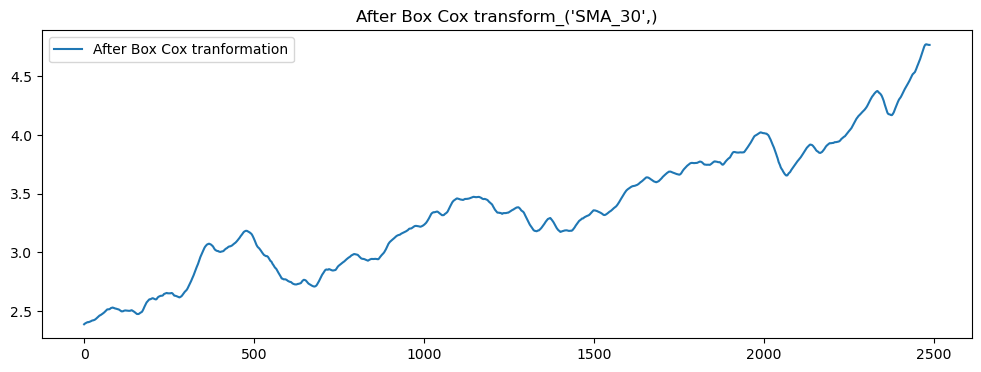

In [127]:
# Plotting all boxcox transformed columns
plot_after_boxcox(AAPL_boxcox)

In [128]:
# WE CAN SEE, THE SCALES HAVE CHANGED FOR THE DATA. lETS PERFORM DIFFERENCING TO REMOVE TREND NEXT.

In [129]:
# Differencing to remove trend
 
AAPL_boxcox_diff = AAPL_boxcox.diff().dropna() # Differencing all variables to get rid of Stationarity

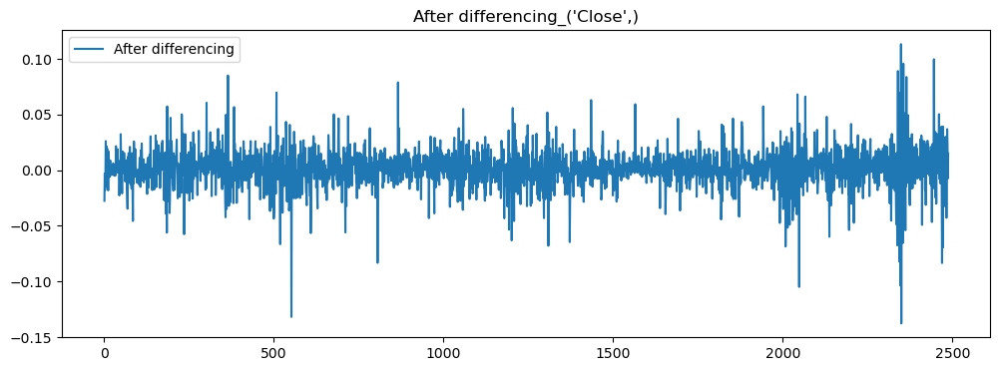

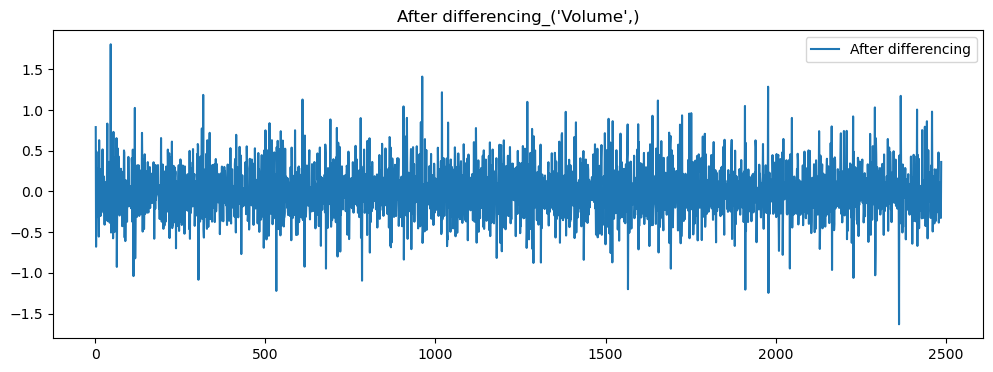

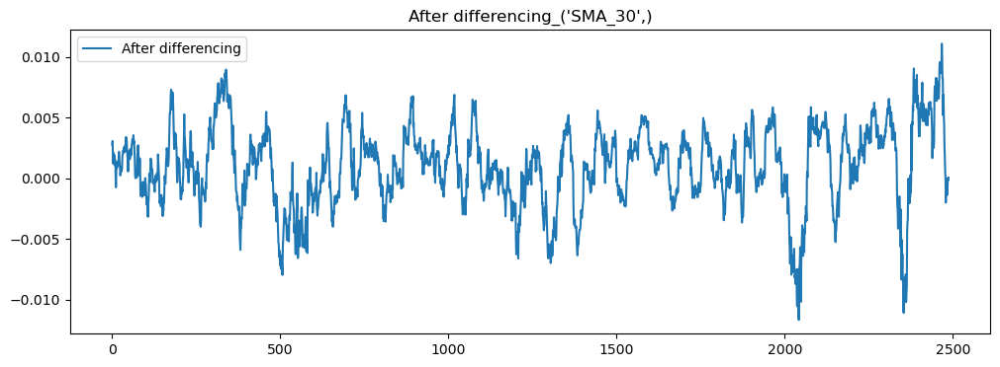

In [130]:
# Plotting all data_differenced columns
plot_after_differencing(AAPL_boxcox_diff)

In [131]:
#lets check for stationarity again

In [132]:
stationarity_test(AAPL_boxcox_diff)

('Close',)
KPSS Statistic: 0.132901
Critical Values @ 0.05: 0.46
p-value: 0.100000

Series is Stationary

--------------------------------------

('Volume',)
KPSS Statistic: 0.030956
Critical Values @ 0.05: 0.46
p-value: 0.100000

Series is Stationary

--------------------------------------

('SMA_30',)
KPSS Statistic: 0.201906
Critical Values @ 0.05: 0.46
p-value: 0.100000

Series is Stationary

--------------------------------------



C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(
C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(
C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(


In [133]:
# as expected, all the variables in stock data have become Stationary.

#### BUILDING VAR MODEL

In [134]:
# Test-Train Split of differentiated data

# Keeping 70% values as train
train_len = int(AAPL.shape[0]*0.7)
test_len = int(AAPL.shape[0]) - int(AAPL.shape[0]*0.7)

# Train data - differenced
train_data_boxcox = AAPL_boxcox[:train_len]
train_data_boxcox_diff = AAPL_boxcox_diff[:train_len-1]

# Test data - differenced
test_data_boxcox = AAPL_boxcox[train_len:]
test_data_boxcox_diff = AAPL_boxcox_diff[train_len-1:]

In [135]:
from statsmodels.tsa.api import VAR

model = VAR(train_data_boxcox_diff)

C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [136]:
# To select the lag order
x = model.select_order(maxlags=50)
x.summary()

,AIC,BIC,FPE,HQIC
0,-22.24,-22.23,2.203e-10,-22.23
1,-25.70,-25.66,6.928e-12,-25.68
2,-25.74,-25.68,6.596e-12,-25.72
3,-25.77,-25.67,6.429e-12,-25.73
4,-25.78,-25.66,6.356e-12,-25.74
5,-25.79,-25.63,6.328e-12,-25.73
6,-25.79,-25.61,6.273e-12,-25.73
7,-25.81,-25.59,6.203e-12,-25.73
8,-25.82,-25.58,6.092e-12,-25.73
9,-25.83,-25.56,6.081e-12,-25.73


In [137]:
# Providing maxlags as 38 (minimum AIC vaue)
results = model.fit(maxlags =38, ic = 'aic')

In [138]:
# Printing the results - Evaluation parameters, lag coefficients, etc.
results.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 24, Mar, 2024
Time:                     04:42:54
--------------------------------------------------------------------
No. of Equations:         3.00000    BIC:                   -29.8467
Nobs:                     1702.00    HQIC:                  -30.5411
Log likelihood:           19437.7    FPE:                3.62388e-14
AIC:                     -30.9493    Det(Omega_mle):     2.97843e-14
--------------------------------------------------------------------
Results for equation Close
                coefficient       std. error           t-stat            prob
-----------------------------------------------------------------------------
const              0.000686         0.000409            1.675           0.094
L1.Close          -0.370936         0.345439           -1.074           0.283
L1.Volume         -0.000040         0.001360           -0.029           

In [139]:
# Forecasting using the VAR model
# Selecting the lag value from the above results
lag_order = 38

In [140]:
# Obtaining the forecast values
predicted = results.forecast(y = train_data_boxcox_diff.values[-lag_order:] , steps = test_len)
forecasted = pd.DataFrame(predicted, index = AAPL.index[train_len:], columns = AAPL.columns)

In [141]:
forecasted.head()

,Close,Volume,SMA_30
1741,-0.004559,0.173285,-0.001587
1742,-0.000351,-0.009698,-0.001724
1743,0.004159,-0.000856,-0.001600
1744,-0.002508,0.185155,-0.001282
1745,-0.003287,0.052373,-0.001354


In [142]:
# we need to reverse the data transformation to compare results
# Inverted values
forecast_values = invert_transformation(train_data_boxcox, forecasted)

In [143]:
forecast_values.head()

,Close,Volume,SMA_30
1741,38.959479,8.041687e+07,39.273224
1742,38.945796,7.964077e+07,39.205560
1743,39.108119,7.957266e+07,39.142872
1744,39.010159,9.575809e+07,39.092740
1745,38.882160,1.009069e+08,39.039833


#### Comparing results

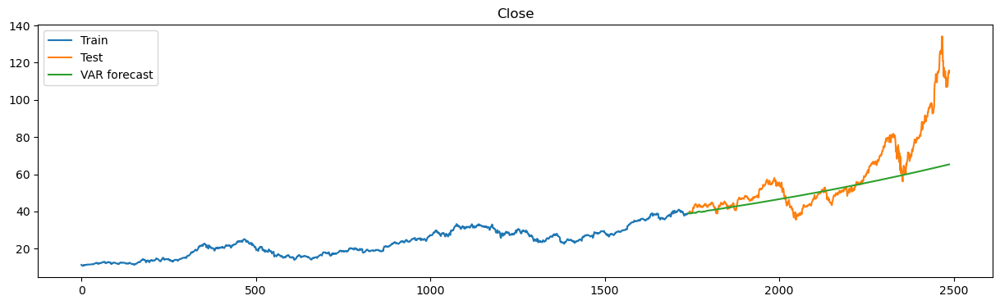

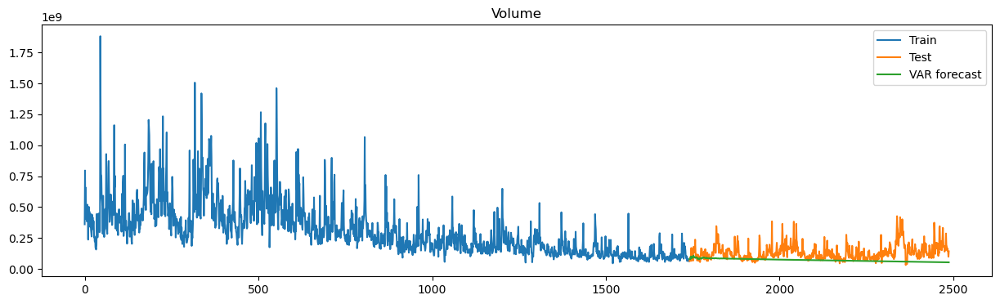

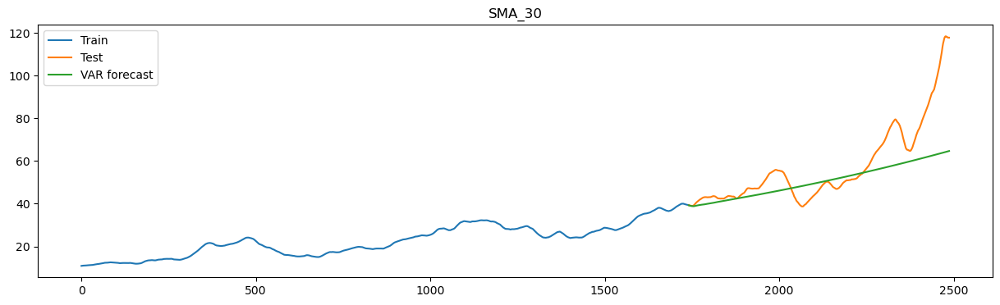

In [144]:
# Printing the train, test and forecasted values
plot_train_test_forecasted(AAPL,forecast_values)

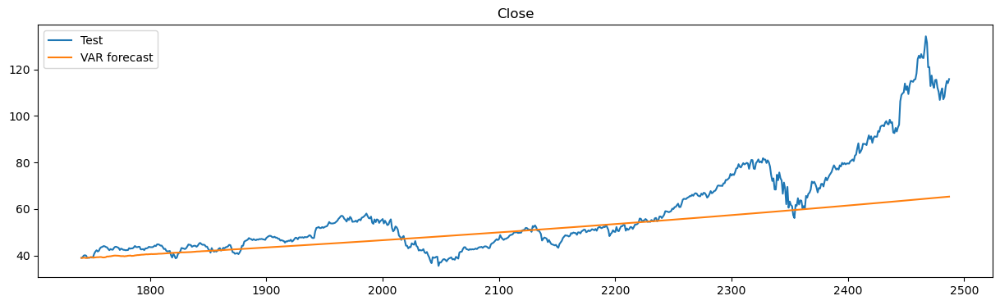

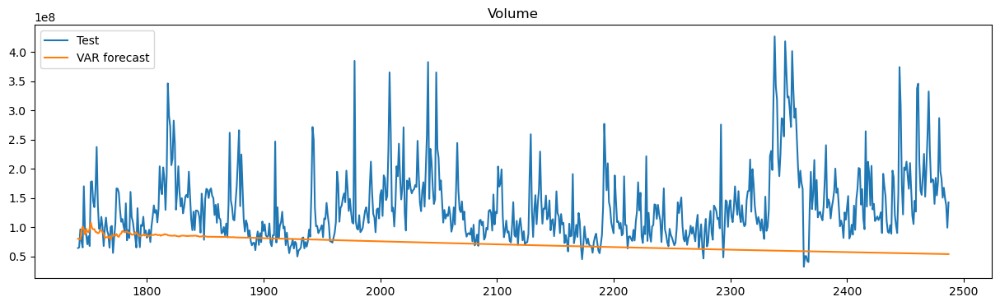

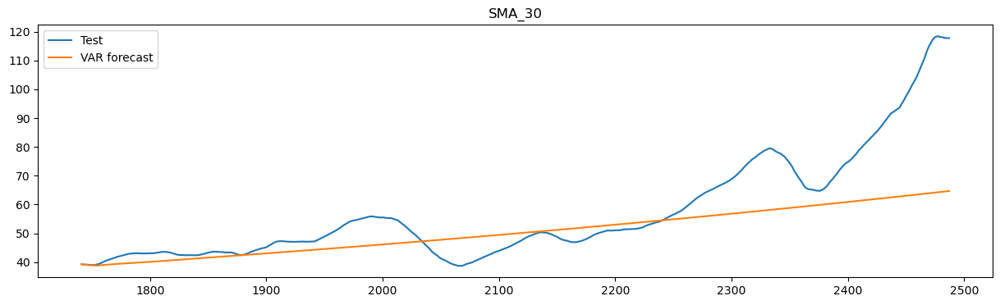

In [145]:
plot_test_forecasted(AAPL,forecast_values)

In [146]:
# we are able to see our model was able to capture the trend of the data, which will be used to forecast for future price.

In [147]:
model_evaluation(AAPL,forecast_values)

,Column,RMSE,MAPE
0,Close,16.13,13.60
0,Volume,90215262.16,40.65
0,SMA_30,14.18,12.42


#### PREDICTION OF FUTURE PRICE (BASED ON CLIENT TIME HORIZON)

In [148]:
# as understood, our client wants to be invested during her college time.
# which can be approximated to arounf 5 years in US.
# 5 years of investment  = (trading days in a year) * 5 

In [149]:
# predicing for next 5 years:
predicted_fut = results.forecast(y = test_data_boxcox_diff.values[-lag_order:] , steps = 252*5)
forecasted_fut = pd.DataFrame(predicted_fut, index = range(252*5), columns = AAPL.columns)

In [150]:
# reversing data transformation
forecast_values_fut = invert_transformation(test_data_boxcox, forecasted_fut)

In [151]:
forecast_values_fut.tail()

,Close,Volume,SMA_30
1255,275.248526,6.788614e+07,273.053039
1256,275.439560,6.783891e+07,273.242559
1257,275.630726,6.779171e+07,273.432210
1258,275.822024,6.774454e+07,273.621993
1259,276.013456,6.769741e+07,273.811908


In [152]:
# average annual return
AAPL_average_annual_return = round((((forecast_values_fut.iloc[-1][0] - AAPL.iloc[-1][0])/AAPL.iloc[-1][0])*100)/5 ,2)
AAPL_average_annual_return

27.67

### PORTFOLIO STOCK  #2
### FORECASTING 'AMZN' (AMAZON) COMPANY STOCK VALUE

In [153]:
# extracing the data with relevant columns
AMZN = selected_stock_data(AMZN)

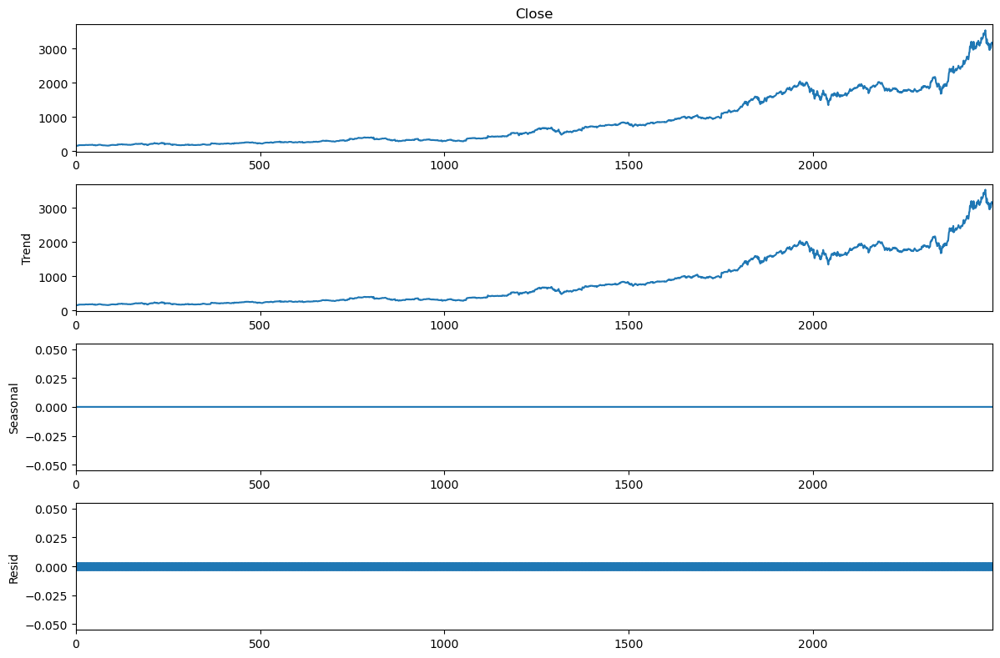

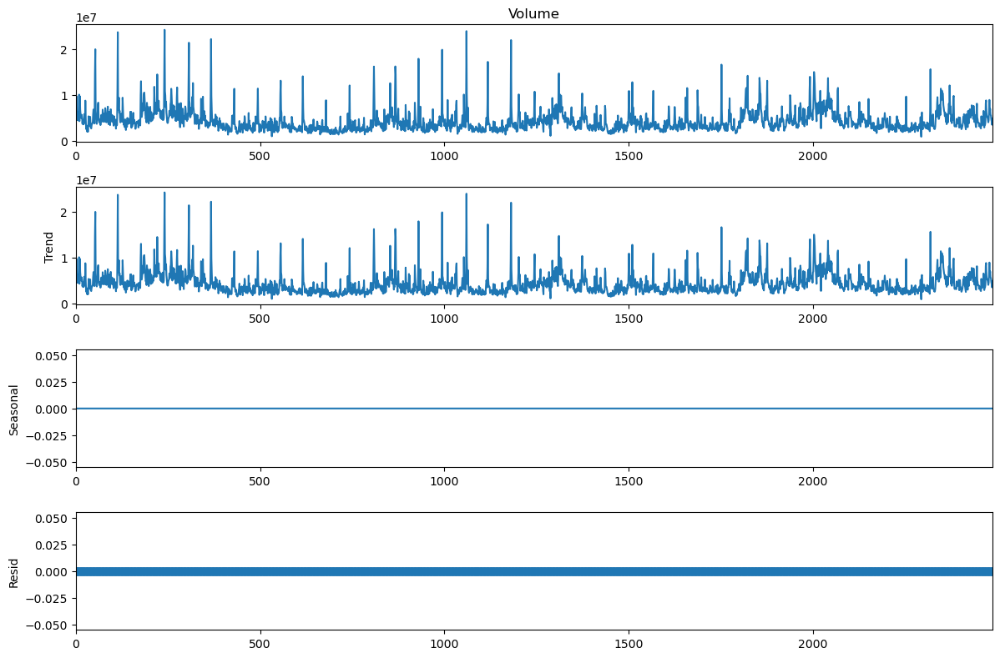

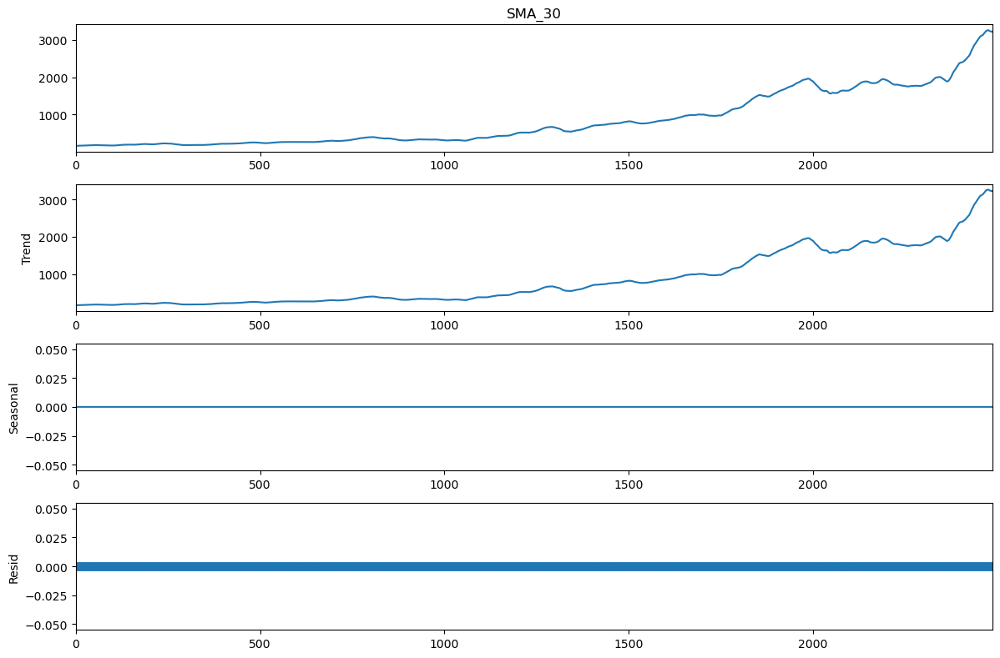

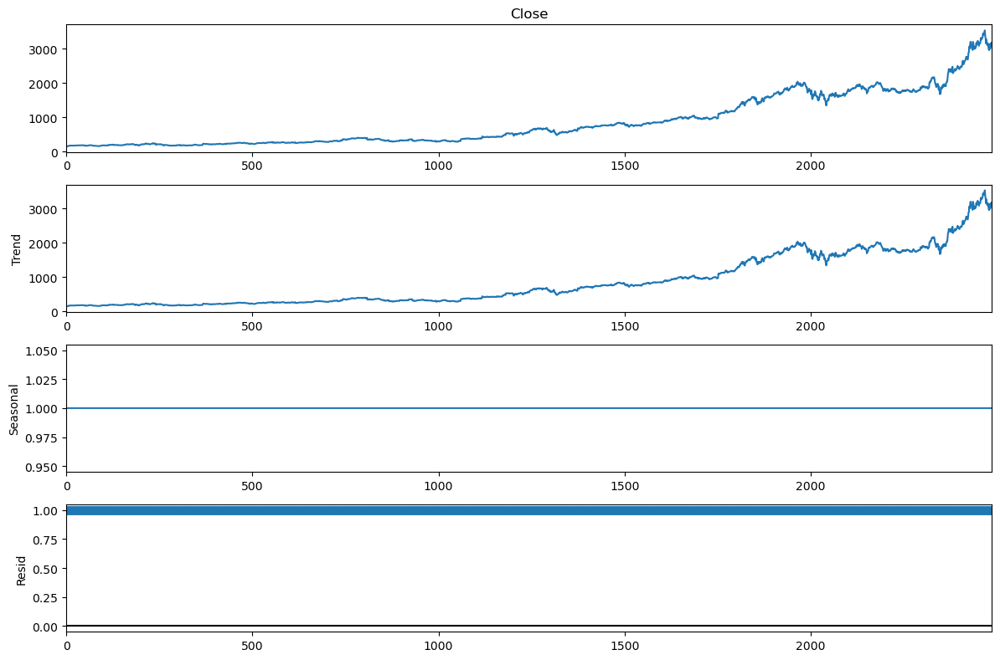

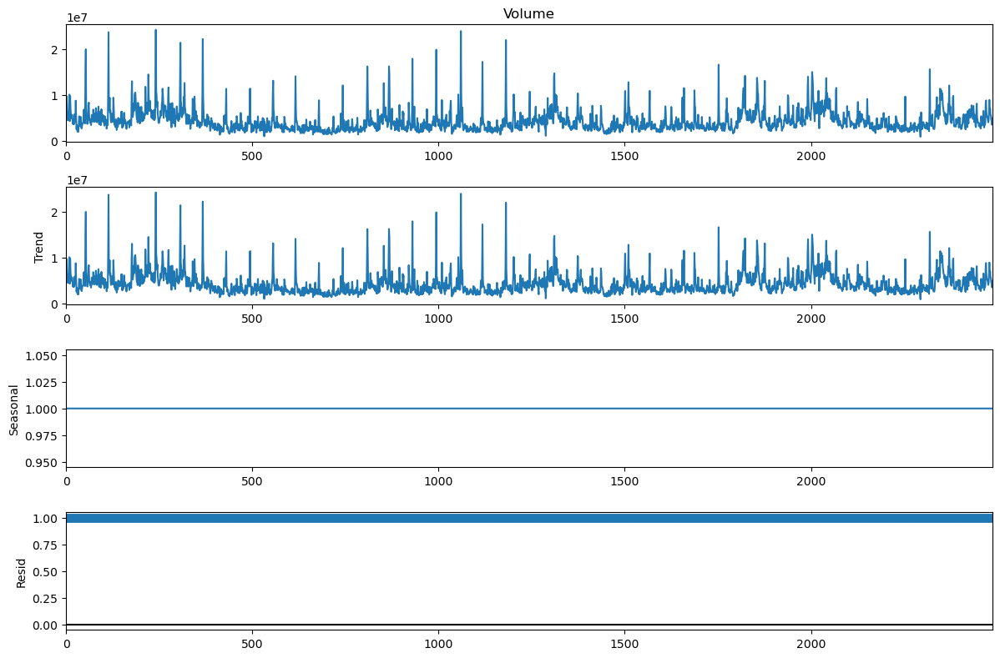

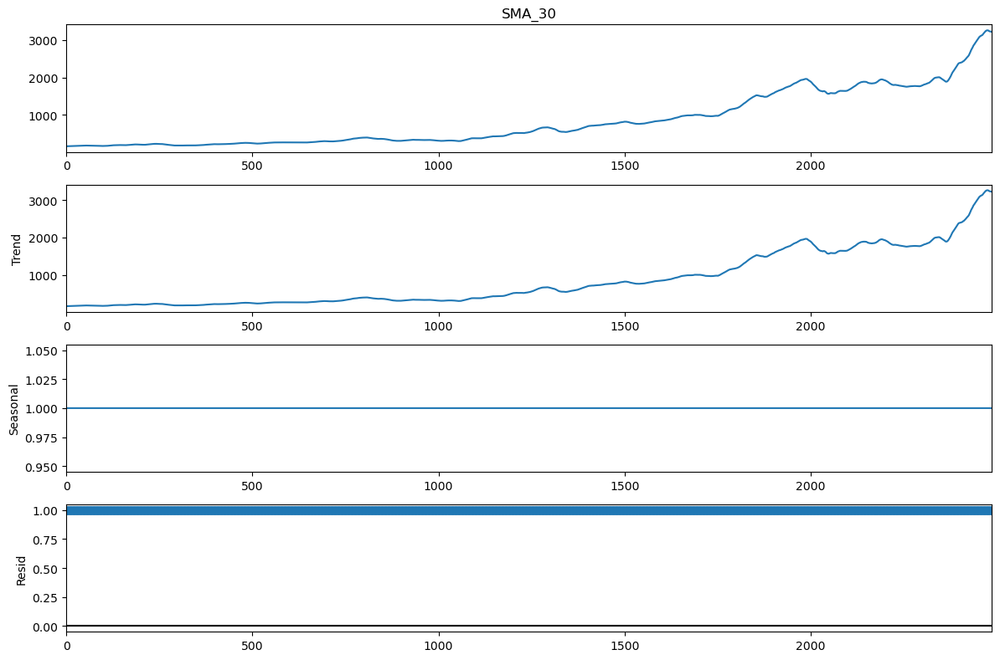

In [154]:
# checking whether series has trend, seasonality or any patterns
trend_check(AMZN)

In [155]:
# its evident, we have trend component in the data as expected, but no seasonailty.

In [156]:
# Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test to check for stationarity
stationarity_test(AMZN)

Close
KPSS Statistic: 6.898721
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Non-Stationary

--------------------------------------

Volume
KPSS Statistic: 0.461392
Critical Values @ 0.05: 0.46
p-value: 0.050693

Series is Stationary

--------------------------------------

SMA_30
KPSS Statistic: 6.967317
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Non-Stationary

--------------------------------------



C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(


In [157]:
# as expected, all the variables in stock data are Non-Stationary. We will be addressing these by transforming the data. 

## 1. Boxcox Transformation

## 2. diffrencing

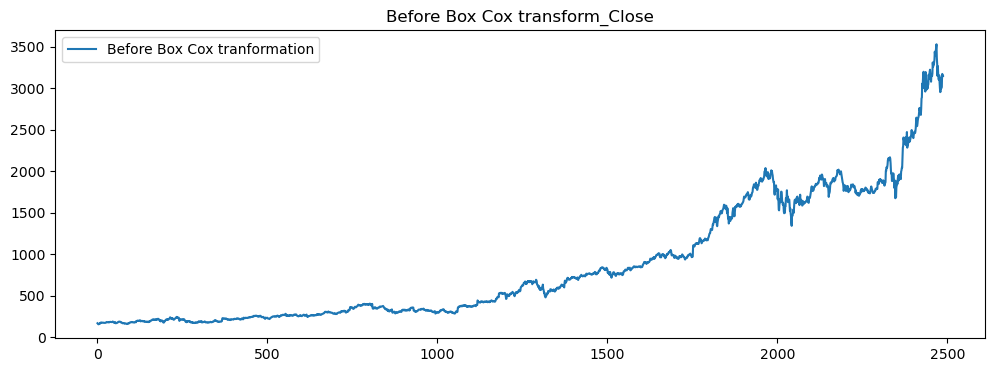

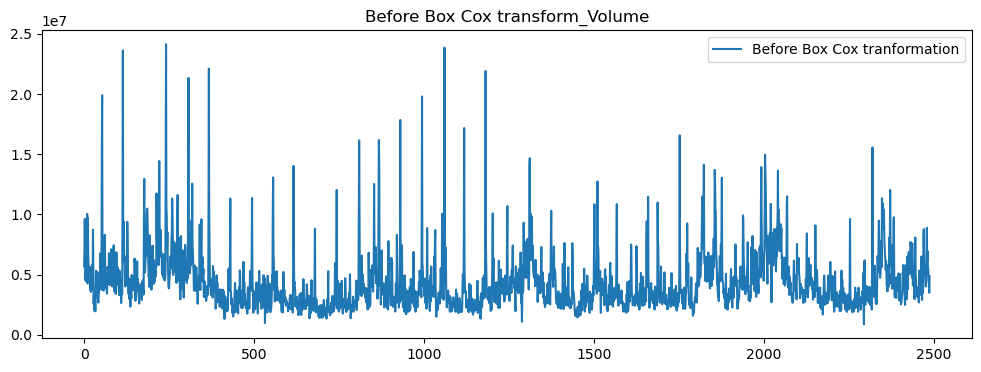

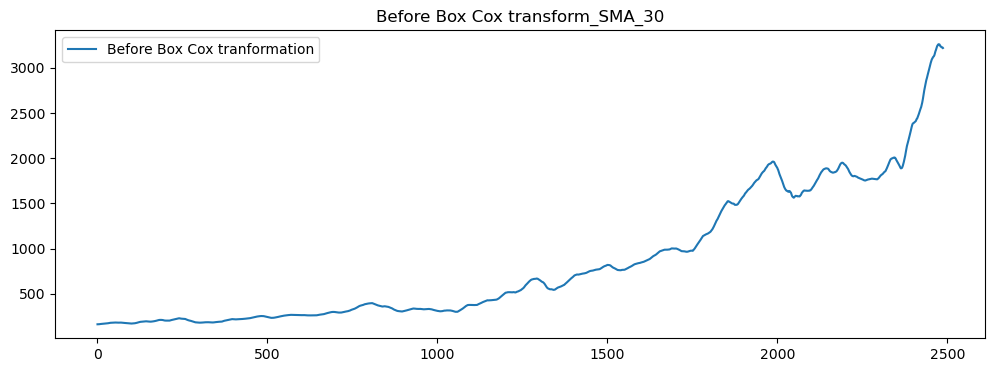

In [158]:
# series before boxcox transformation
plot_before_boxcox(AMZN)

In [159]:
#Using Boxcox method

from scipy.stats import boxcox

AMZN_boxcox = pd.DataFrame(columns=[AMZN.columns])  # Empty dataframe

for col in AMZN.columns:
    temp_data = pd.Series(boxcox(AMZN[col], lmbda=0), index = AMZN.index, name = col)
    AMZN_boxcox[col] = temp_data

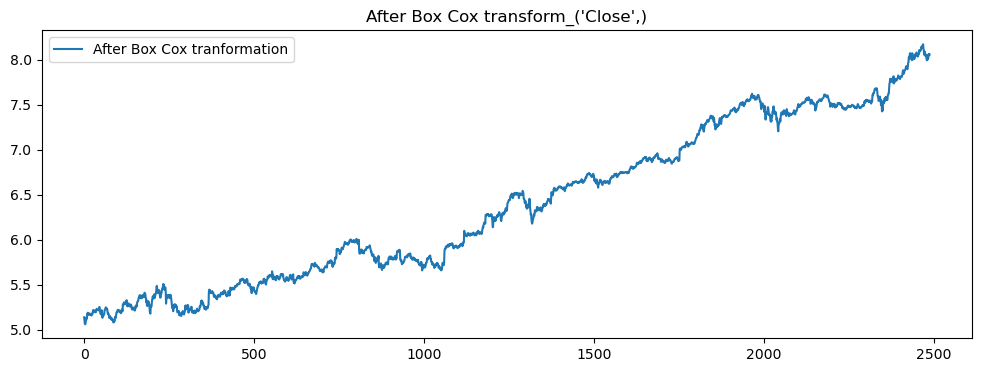

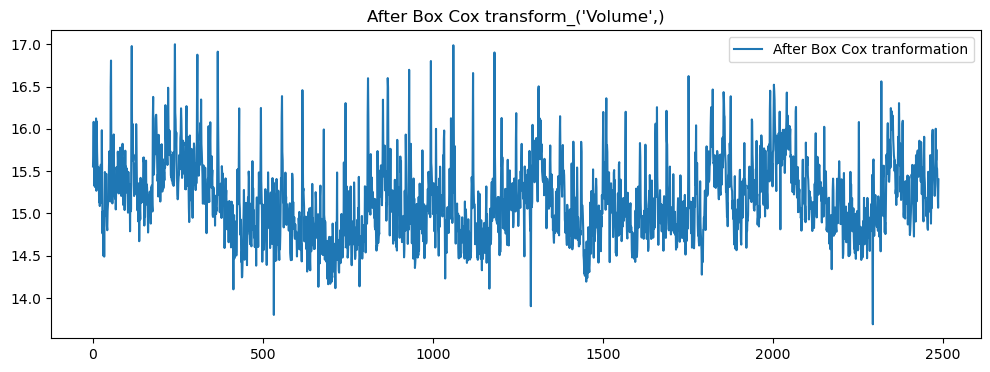

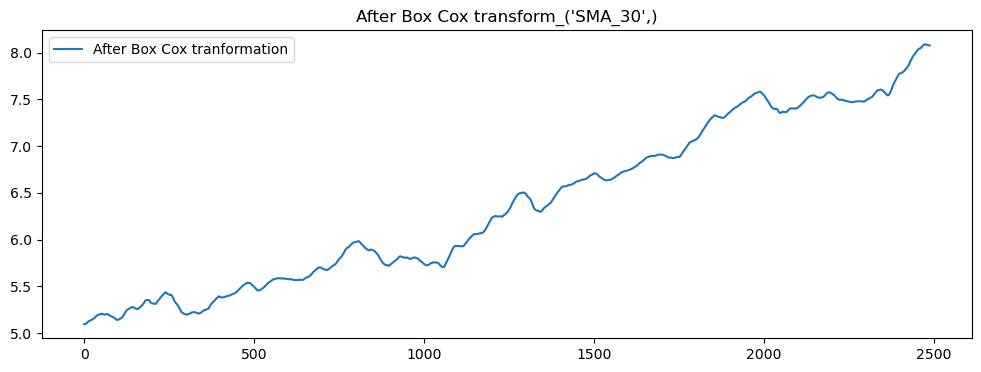

In [160]:
# Plotting all boxcox transformed columns
plot_after_boxcox(AMZN_boxcox)

In [161]:
# WE CAN SEE, THE SCALES HAVE CHANGED FOR THE DATA. lETS PERFORM DIFFERENCING TO REMOVE TREND NEXT.

In [162]:
# Differencing to remove trend
AMZN_boxcox_diff = AMZN_boxcox.diff().dropna() # Differencing all variables to get rid of Stationarity

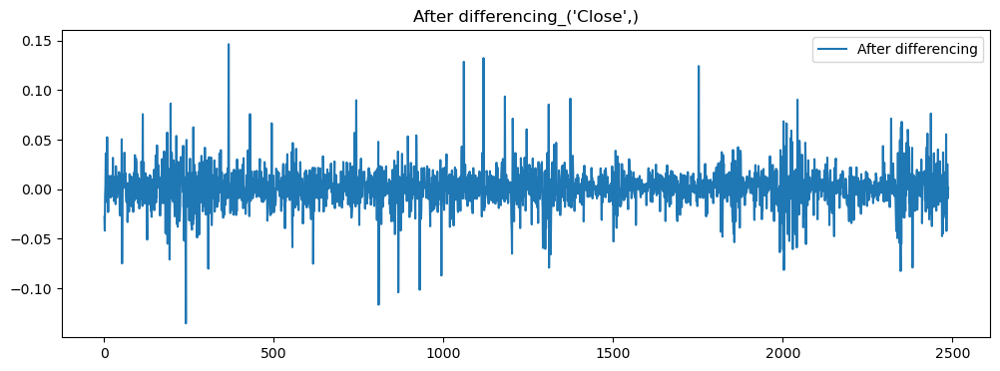

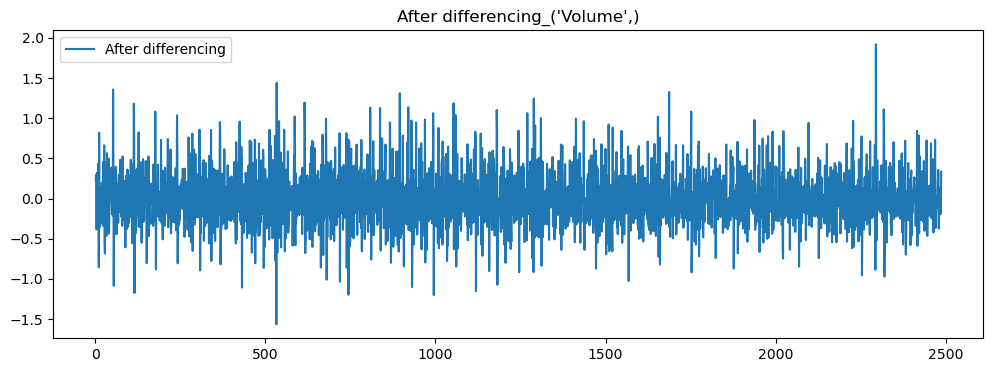

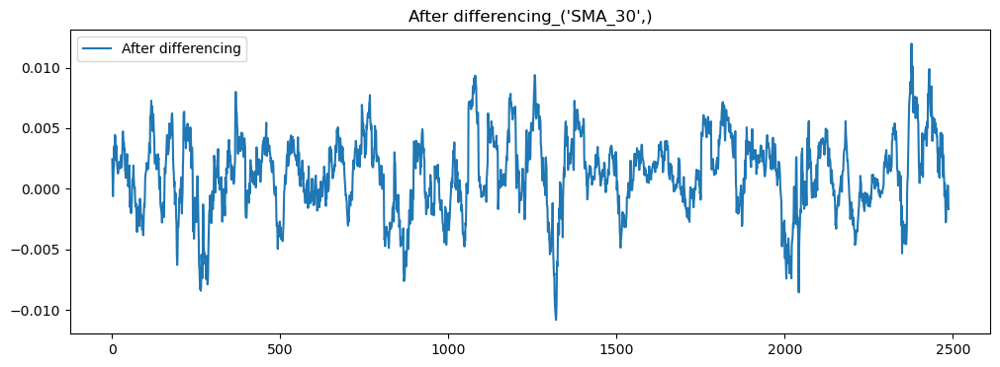

In [163]:
# Plotting all data_differenced columns
plot_after_differencing(AMZN_boxcox_diff)

In [164]:
#lets check for stationarity again

In [165]:
stationarity_test(AMZN_boxcox_diff)

('Close',)
KPSS Statistic: 0.077735
Critical Values @ 0.05: 0.46
p-value: 0.100000

Series is Stationary

--------------------------------------

('Volume',)
KPSS Statistic: 0.026029
Critical Values @ 0.05: 0.46
p-value: 0.100000

Series is Stationary

--------------------------------------

('SMA_30',)
KPSS Statistic: 0.156978
Critical Values @ 0.05: 0.46
p-value: 0.100000

Series is Stationary

--------------------------------------



C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(
C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(
C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(


In [166]:
# as expected, all the variables in stock data have become Stationary.

#### BUILDING VAR MODEL

In [167]:
# Test-Train Split of differentiated data

# Keeping 70% values as train
train_len = int(AMZN.shape[0]*0.7)
test_len = int(AMZN.shape[0]) - int(AMZN.shape[0]*0.7)

# Train data - differenced
train_data_boxcox = AMZN_boxcox[:train_len]
train_data_boxcox_diff = AMZN_boxcox_diff[:train_len-1]

# Test data - differenced
test_data_boxcox = AMZN_boxcox[train_len:]
test_data_boxcox_diff = AMZN_boxcox_diff[train_len-1:]

In [168]:
from statsmodels.tsa.api import VAR

model = VAR(train_data_boxcox_diff)

C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [169]:
# To select the lag order
x = model.select_order(maxlags=50)
x.summary()

,AIC,BIC,FPE,HQIC
0,-21.45,-21.44,4.857e-10,-21.44
1,-24.64,-24.60,2.000e-11,-24.62
2,-24.70,-24.64,1.868e-11,-24.68
3,-24.73,-24.63,1.820e-11,-24.69
4,-24.76,-24.63,1.774e-11,-24.71
5,-24.75,-24.60,1.775e-11,-24.70
6,-24.75,-24.57,1.781e-11,-24.68
7,-24.76,-24.55,1.767e-11,-24.68
8,-24.77,-24.53,1.749e-11,-24.68
9,-24.77,-24.50,1.746e-11,-24.67


In [170]:
# Providing maxlags as 30 (minimum AIC vaue)
results = model.fit(maxlags =30, ic = 'aic')

In [171]:
# Printing the results - Evaluation parameters, lag coefficients, etc.
results.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 24, Mar, 2024
Time:                     04:43:06
--------------------------------------------------------------------
No. of Equations:         3.00000    BIC:                   -28.7112
Nobs:                     1710.00    HQIC:                  -29.2587
Log likelihood:           18285.1    FPE:                1.42404e-13
AIC:                     -29.5804    Det(Omega_mle):     1.21890e-13
--------------------------------------------------------------------
Results for equation Close
                coefficient       std. error           t-stat            prob
-----------------------------------------------------------------------------
const              0.001222         0.000525            2.326           0.020
L1.Close          -0.108719         0.182146           -0.597           0.551
L1.Volume         -0.002139         0.001478           -1.447           

In [172]:
# Forecasting using the VAR model
# Selecting the lag value from the above results
lag_order = 30

In [173]:
# Obtaining the forecast values
predicted = results.forecast(y = train_data_boxcox_diff.values[-lag_order:] , steps = test_len)
forecasted = pd.DataFrame(predicted, index = AMZN.index[train_len:], columns = AMZN.columns)

In [174]:
forecasted.head()

,Close,Volume,SMA_30
1741,0.003577,0.137826,0.001064
1742,-0.000451,-0.050789,0.000621
1743,0.001090,-0.063272,0.000735
1744,-0.001077,0.027095,0.001138
1745,0.003495,0.107648,0.001166


In [175]:
# we need to reverse the data transformation to compare results
# Inverted values
forecast_values = invert_transformation(train_data_boxcox, forecasted)

In [176]:
forecast_values.head()

,Close,Volume,SMA_30
1741,998.565702,2.682467e+06,972.814854
1742,998.115458,2.549629e+06,973.418799
1743,999.203503,2.393308e+06,974.134302
1744,998.128333,2.459040e+06,975.243668
1745,1001.622992,2.738524e+06,976.381348


#### Comparing results

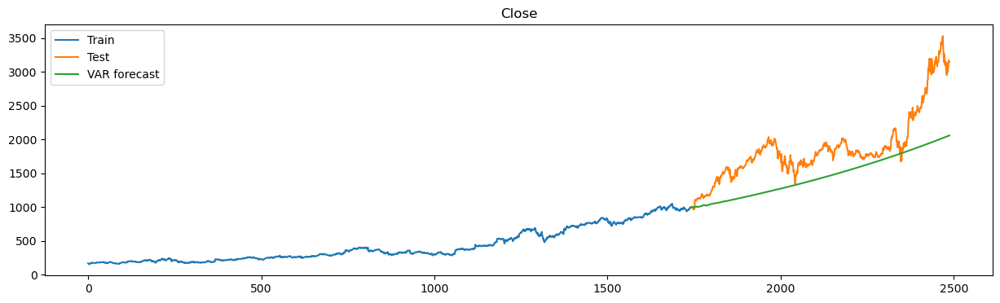

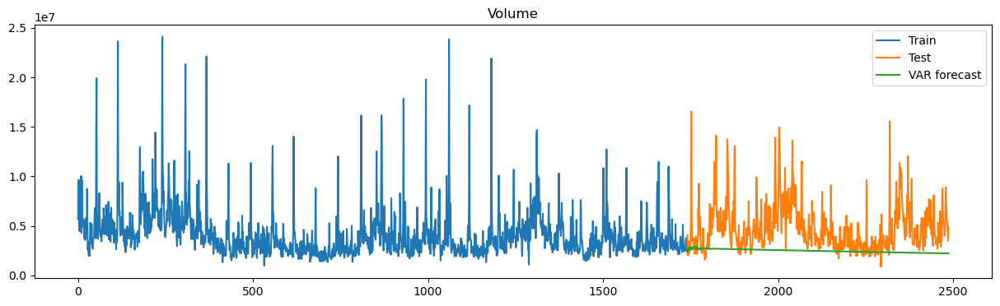

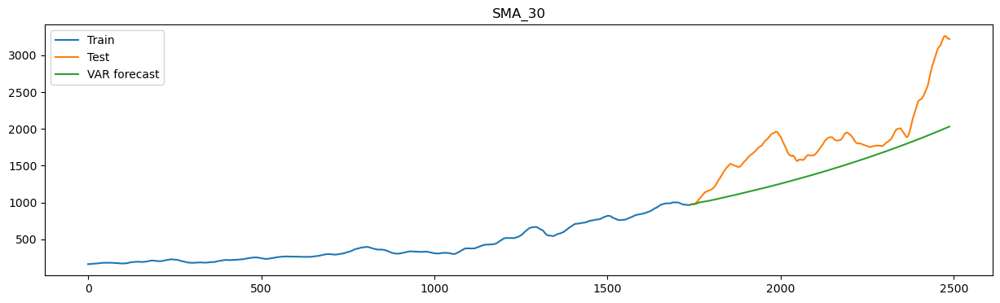

In [177]:
# Printing the train, test and forecasted values
plot_train_test_forecasted(AMZN,forecast_values)

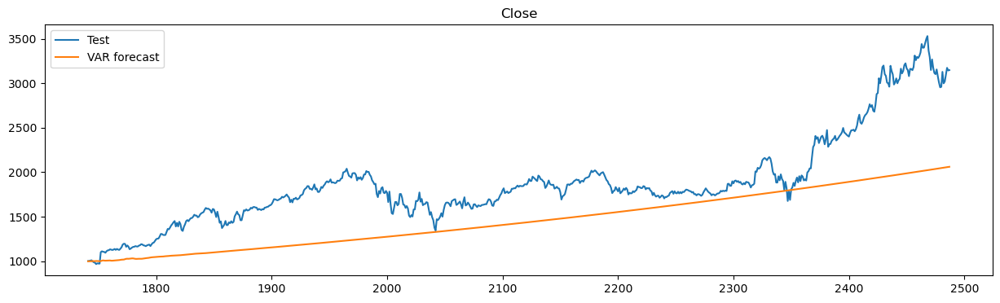

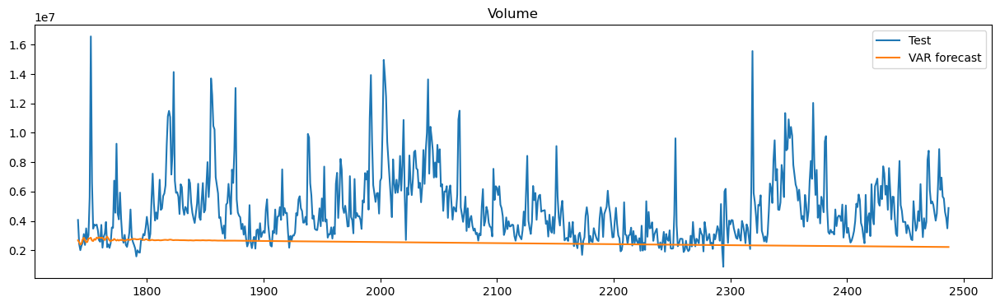

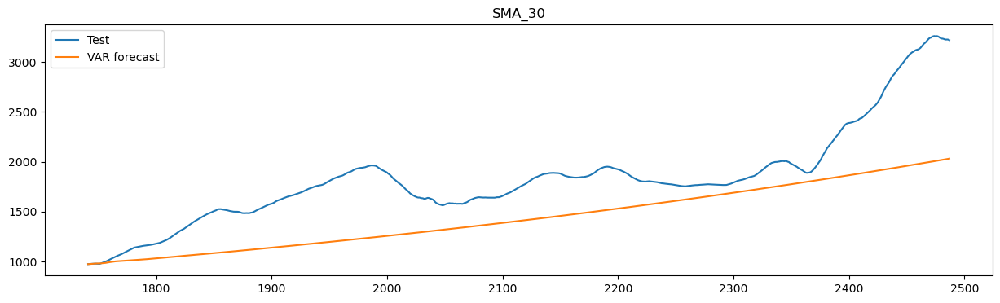

In [178]:
plot_test_forecasted(AMZN,forecast_values)

In [179]:
# we are able to see our model was able to capture the trend of the data, which will be used to forecast for future price.

In [180]:
model_evaluation(AMZN,forecast_values)

,Column,RMSE,MAPE
0,Close,508.35,20.71
0,Volume,3214995.44,40.46
0,SMA_30,477.30,20.12


#### PREDICTION OF FUTURE PRICE (BASED ON CLIENT TIME HORIZON)

In [181]:
# as understood, our client wants to be invested during her college time.
# which can be approximated to arounf 5 years in US.
# 5 years of investment  = (trading days in a year) * 5 

In [182]:
# predicing for next 5 years:
predicted_fut = results.forecast(y = test_data_boxcox_diff.values[-lag_order:] , steps = 252*5)
forecasted_fut = pd.DataFrame(predicted_fut, index = range(252*5), columns = AMZN.columns)

In [183]:
# reversing data transformation
forecast_values_fut = invert_transformation(test_data_boxcox, forecasted_fut)

In [184]:
forecast_values_fut.tail()

,Close,Volume,SMA_30
1255,10892.596181,3.443752e+06,10747.352802
1256,10903.355892,3.442758e+06,10757.962020
1257,10914.126232,3.441764e+06,10768.581712
1258,10924.907210,3.440770e+06,10779.211886
1259,10935.698838,3.439777e+06,10789.852555


In [185]:
# average annual return
AMZN_average_annual_return = round((((forecast_values_fut.iloc[-1][0] - AMZN.iloc[-1][0])/AMZN.iloc[-1][0])*100)/5 ,2)
AMZN_average_annual_return

49.46

### PORTFOLIO STOCK  #3
### FORECASTING 'JNJ' (JOHNSON AND JOHNSON) COMPANY STOCK VALUE

In [186]:
# extracing the data with relevant columns
JNJ = selected_stock_data(JNJ)

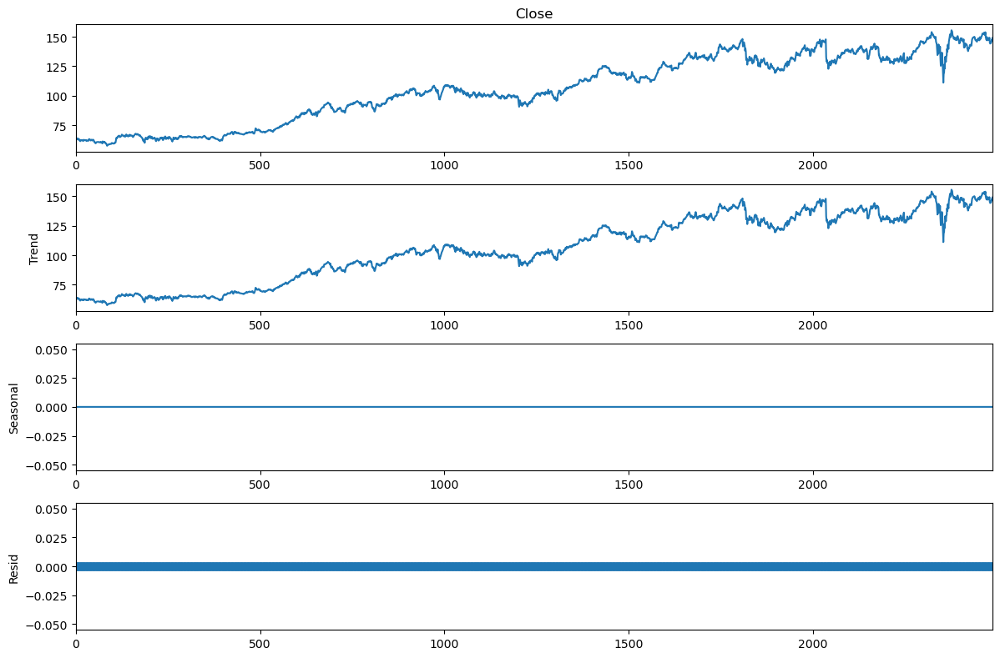

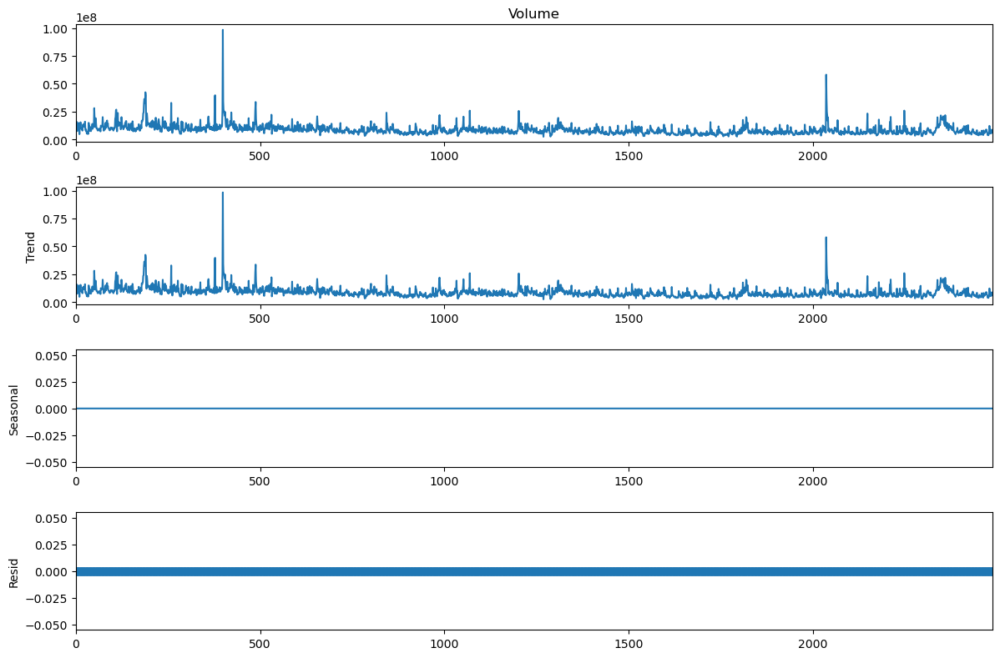

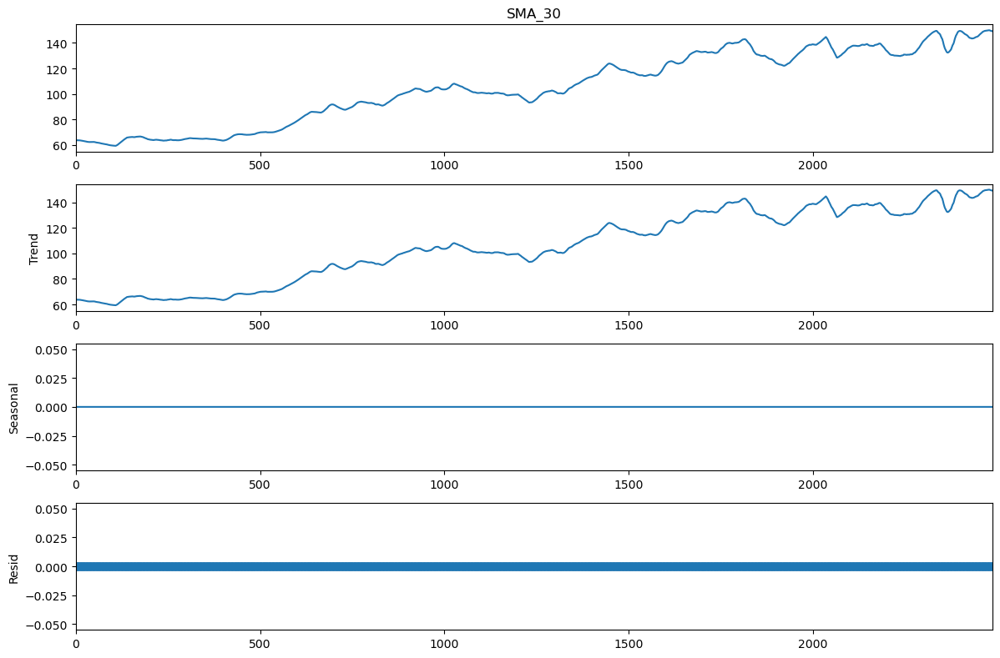

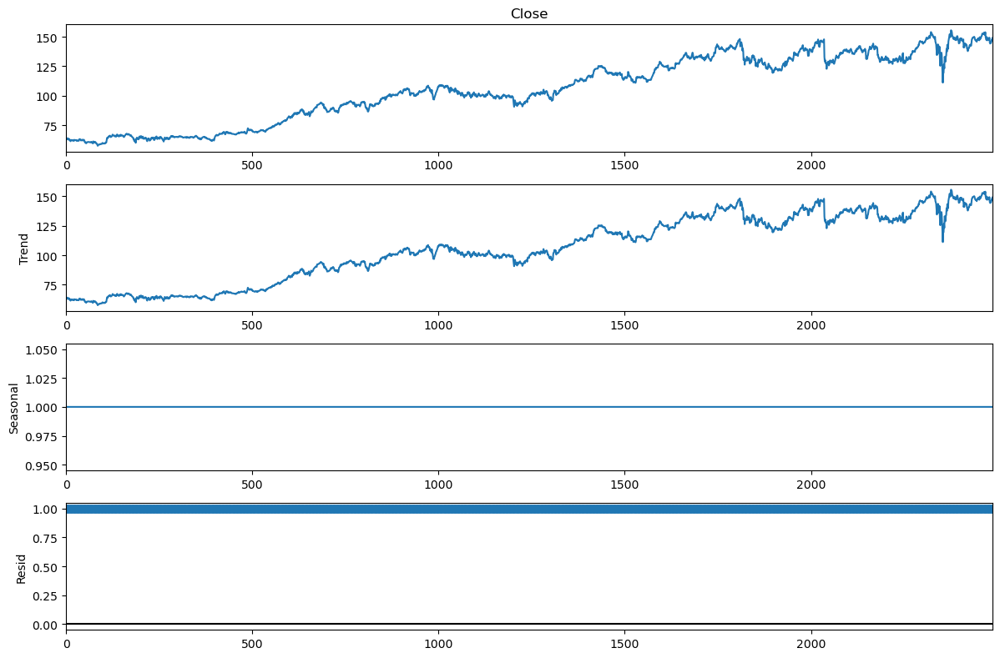

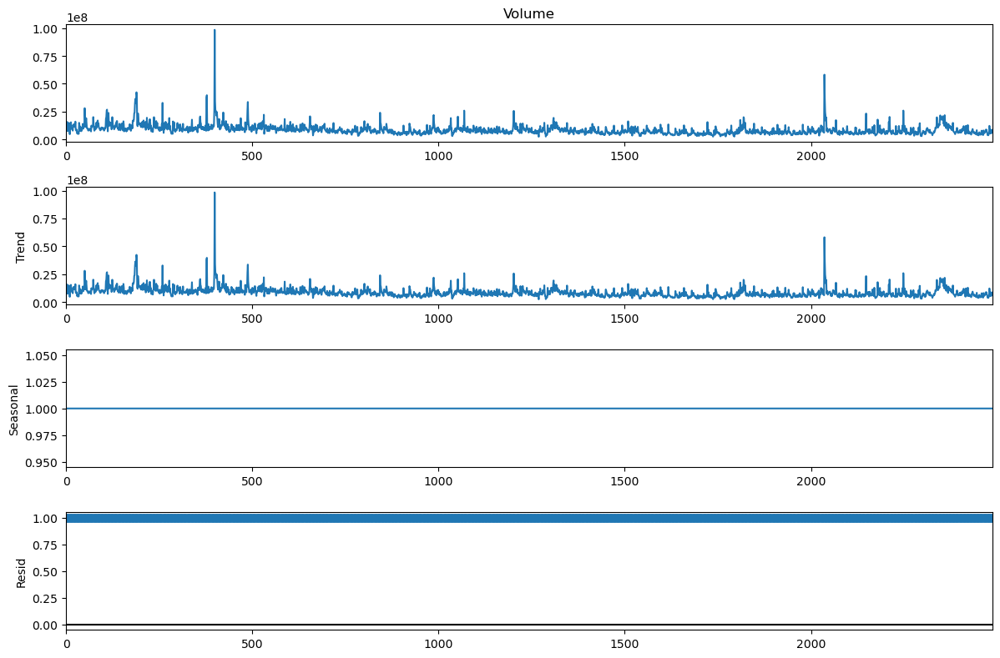

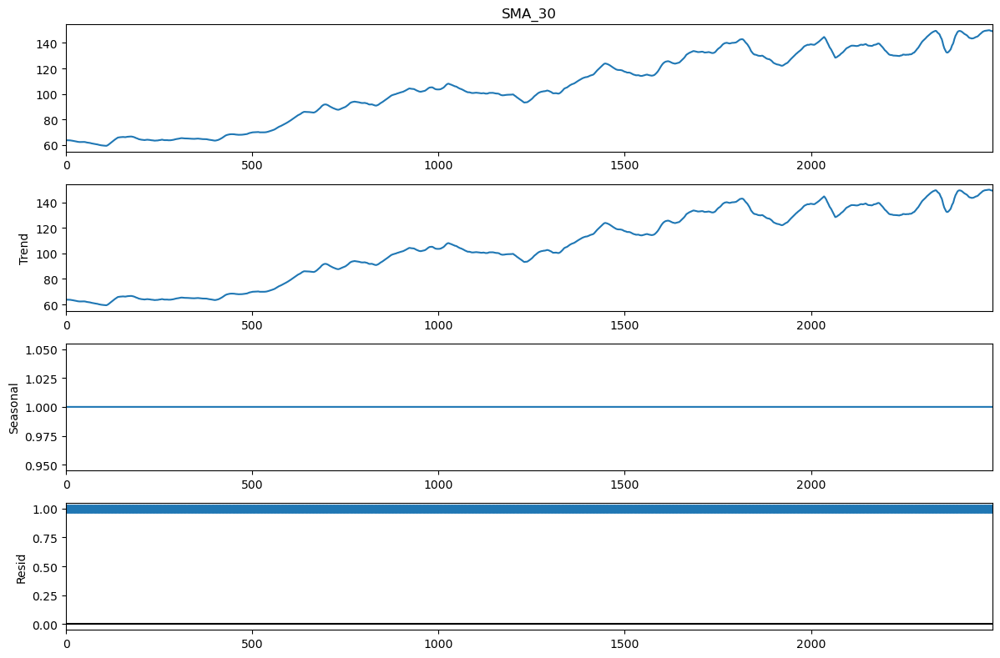

In [187]:
# checking whether series has trend, seasonality or any patterns
trend_check(JNJ)

In [188]:
# its evident, we have trend component in the data as expected, but no seasonailty.

In [189]:
# Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test to check for stationarity
stationarity_test(JNJ)

Close
KPSS Statistic: 7.770141
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Non-Stationary

--------------------------------------

Volume
KPSS Statistic: 3.435532
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Non-Stationary

--------------------------------------

SMA_30
KPSS Statistic: 7.803373
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Non-Stationary

--------------------------------------



C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(


In [190]:
# as expected, all the variables in stock data are Non-Stationary. We will be addressing these by transforming the data. 

## 1. Boxcox Transformation

## 2. diffrencing

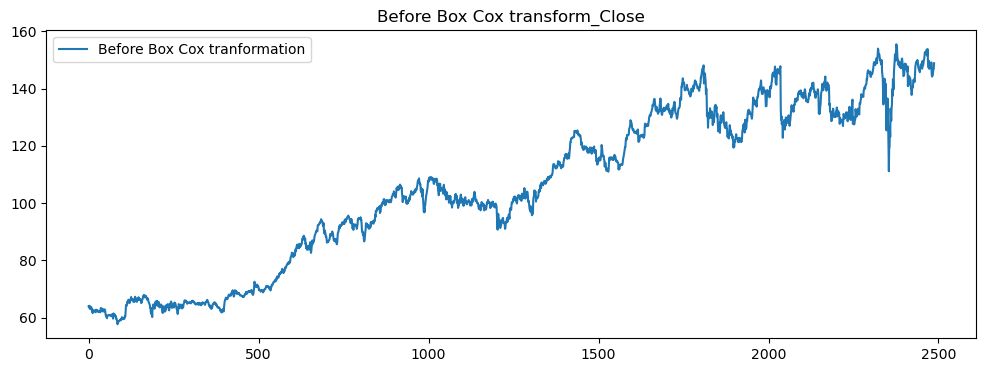

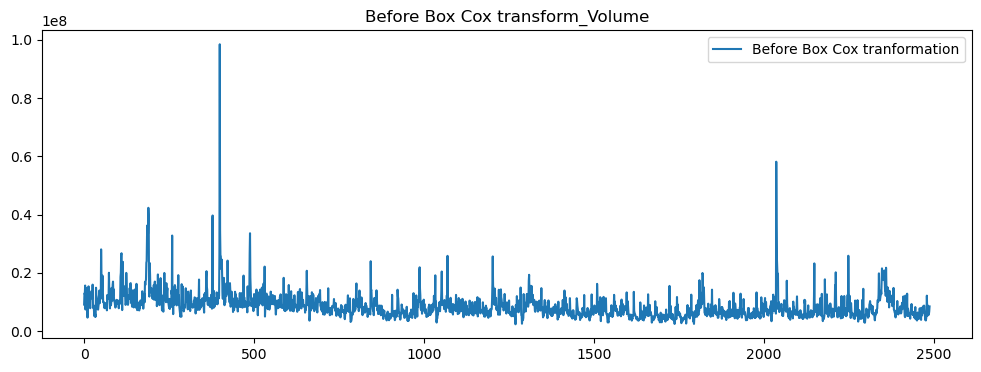

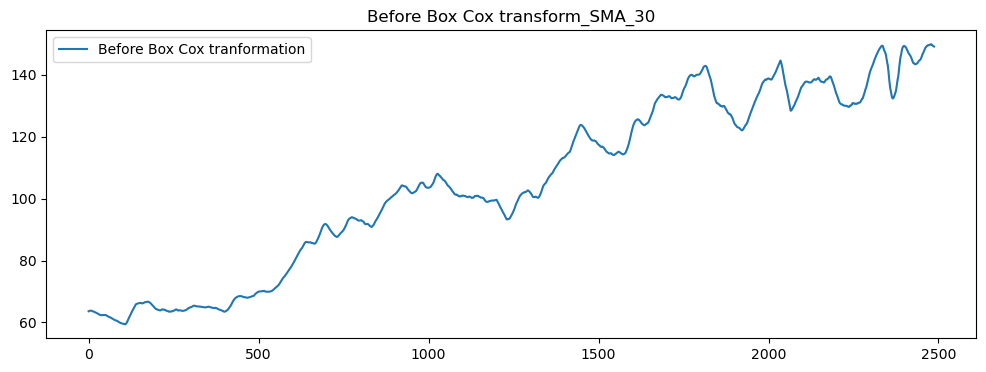

In [191]:
# series before boxcox transformation
plot_before_boxcox(JNJ)

In [192]:
#Using Boxcox method

from scipy.stats import boxcox

JNJ_boxcox = pd.DataFrame(columns=[JNJ.columns])  # Empty dataframe

for col in JNJ.columns:
    temp_data = pd.Series(boxcox(JNJ[col], lmbda=0), index = JNJ.index, name = col)
    JNJ_boxcox[col] = temp_data

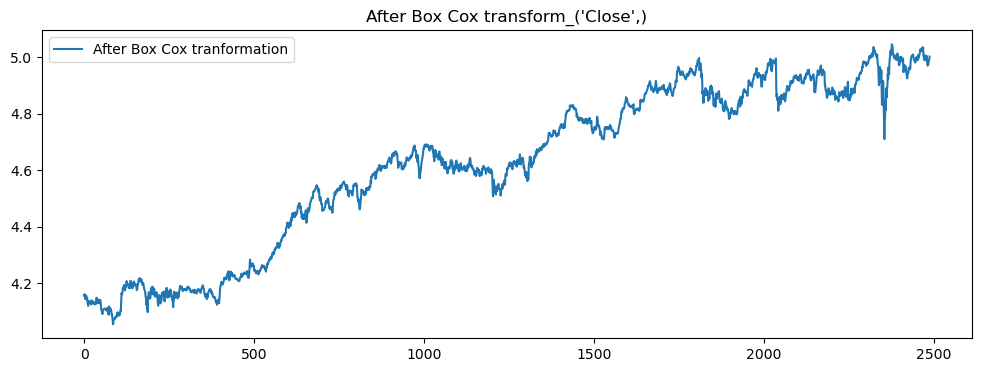

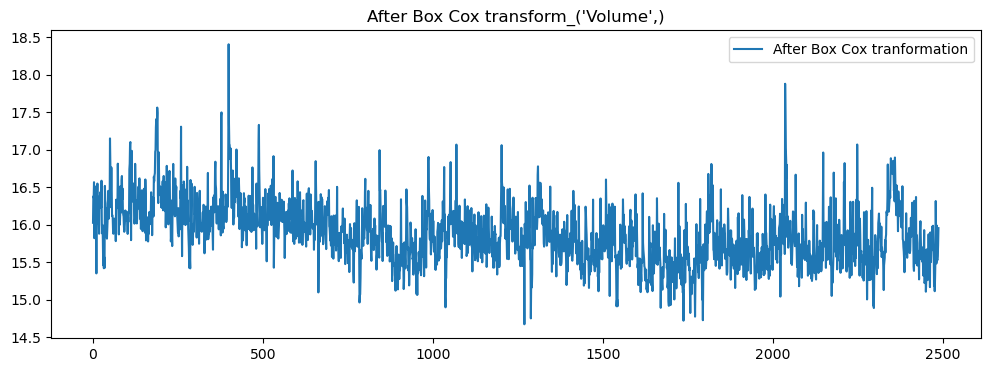

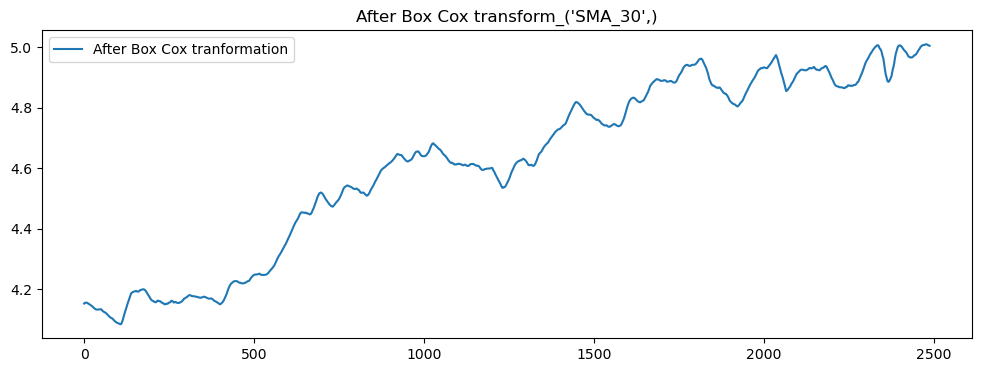

In [193]:
# Plotting all boxcox transformed columns
plot_after_boxcox(JNJ_boxcox)

In [194]:
# WE CAN SEE, THE SCALES HAVE CHANGED FOR THE DATA. lETS PERFORM DIFFERENCING TO REMOVE TREND NEXT.

In [195]:
# Differencing to remove trend
JNJ_boxcox_diff = JNJ_boxcox.diff().dropna() # Differencing all variables to get rid of Stationarity

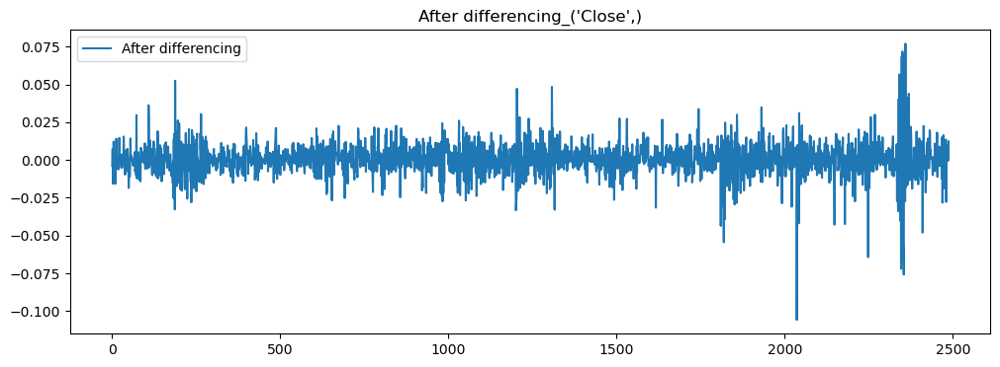

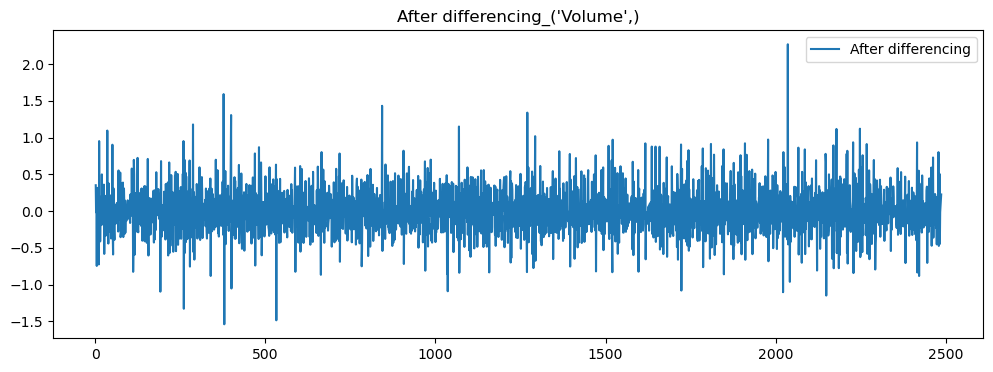

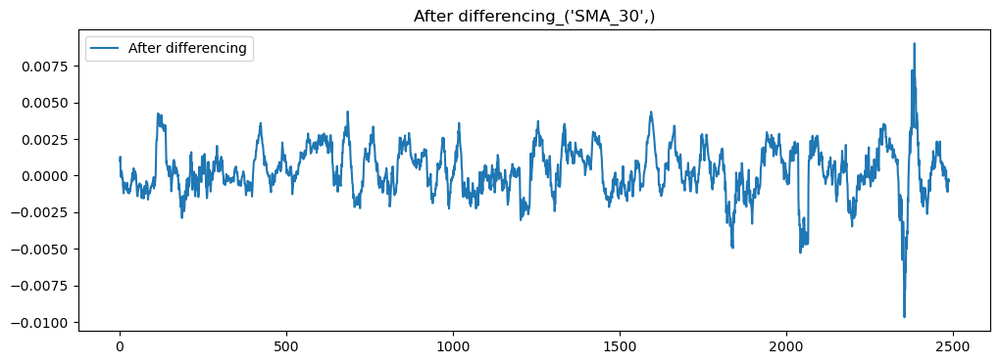

In [196]:
# Plotting all data_differenced columns
plot_after_differencing(JNJ_boxcox_diff)

In [197]:
#lets check for stationarity again

In [198]:
stationarity_test(JNJ_boxcox_diff)

('Close',)
KPSS Statistic: 0.038352
Critical Values @ 0.05: 0.46
p-value: 0.100000

Series is Stationary

--------------------------------------

('Volume',)
KPSS Statistic: 0.035701
Critical Values @ 0.05: 0.46
p-value: 0.100000

Series is Stationary

--------------------------------------

('SMA_30',)
KPSS Statistic: 0.073332
Critical Values @ 0.05: 0.46
p-value: 0.100000

Series is Stationary

--------------------------------------



C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(
C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(
C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(


In [199]:
# as expected, all the variables in stock data have become Stationary.

#### BUILDING VAR MODEL

In [200]:
# Test-Train Split of differentiated data

# Keeping 70% values as train
train_len = int(JNJ.shape[0]*0.7)
test_len = int(JNJ.shape[0]) - int(JNJ.shape[0]*0.7)

# Train data - differenced
train_data_boxcox = JNJ_boxcox[:train_len]
train_data_boxcox_diff = JNJ_boxcox_diff[:train_len-1]

# Test data - differenced
test_data_boxcox = JNJ_boxcox[train_len:]
test_data_boxcox_diff = JNJ_boxcox_diff[train_len-1:]

In [201]:
from statsmodels.tsa.api import VAR

model = VAR(train_data_boxcox_diff)

C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [202]:
# To select the lag order
x = model.select_order(maxlags=50)
x.summary()

,AIC,BIC,FPE,HQIC
0,-24.96,-24.96,1.438e-11,-24.96
1,-28.26,-28.22,5.334e-13,-28.25
2,-28.30,-28.24,5.109e-13,-28.28
3,-28.31,-28.22,5.050e-13,-28.28
4,-28.32,-28.19,5.034e-13,-28.27
5,-28.34,-28.18,4.931e-13,-28.28
6,-28.34,-28.16,4.919e-13,-28.27
7,-28.34,-28.13,4.924e-13,-28.26
8,-28.34,-28.09,4.944e-13,-28.25
9,-28.35,-28.08,4.876e-13,-28.25


In [203]:
# Providing maxlags as 32 (minimum AIC vaue)
results = model.fit(maxlags =32, ic = 'aic')

In [204]:
# Printing the results - Evaluation parameters, lag coefficients, etc.
results.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 24, Mar, 2024
Time:                     04:43:17
--------------------------------------------------------------------
No. of Equations:         3.00000    BIC:                   -33.8776
Nobs:                     1708.00    HQIC:                  -34.4617
Log likelihood:           22743.8    FPE:                7.66606e-16
AIC:                     -34.8049    Det(Omega_mle):     6.49537e-16
--------------------------------------------------------------------
Results for equation Close
                coefficient       std. error           t-stat            prob
-----------------------------------------------------------------------------
const              0.000578         0.000234            2.467           0.014
L1.Close          -1.890982         0.656320           -2.881           0.004
L1.Volume         -0.000655         0.000814           -0.804           

In [205]:
# Forecasting using the VAR model
# Selecting the lag value from the above results
lag_order = 32

In [206]:
# Obtaining the forecast values
predicted = results.forecast(y = train_data_boxcox_diff.values[-lag_order:] , steps = test_len)
forecasted = pd.DataFrame(predicted, index = JNJ.index[train_len:], columns = JNJ.columns)

In [207]:
forecasted.head()

,Close,Volume,SMA_30
1741,-0.000637,-0.279082,0.001379
1742,0.001018,-0.049294,0.001084
1743,0.003877,-0.059599,0.001542
1744,-0.001491,-0.017014,0.001776
1745,0.001428,-0.054182,0.001624


In [208]:
# we need to reverse the data transformation to compare results
# Inverted values
forecast_values = invert_transformation(train_data_boxcox, forecasted)

In [209]:
forecast_values.head()

,Close,Volume,SMA_30
1741,136.562977,6.255620e+06,132.517604
1742,136.702016,5.954731e+06,132.661355
1743,137.233098,5.610204e+06,132.866067
1744,137.028698,5.515561e+06,133.102284
1745,137.224505,5.224669e+06,133.318590


#### Comparing results

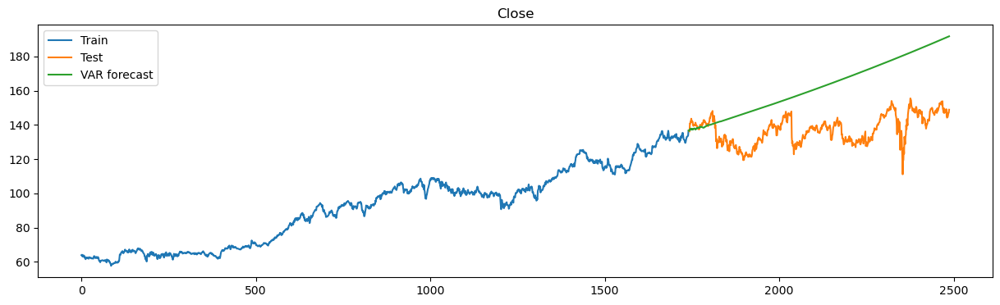

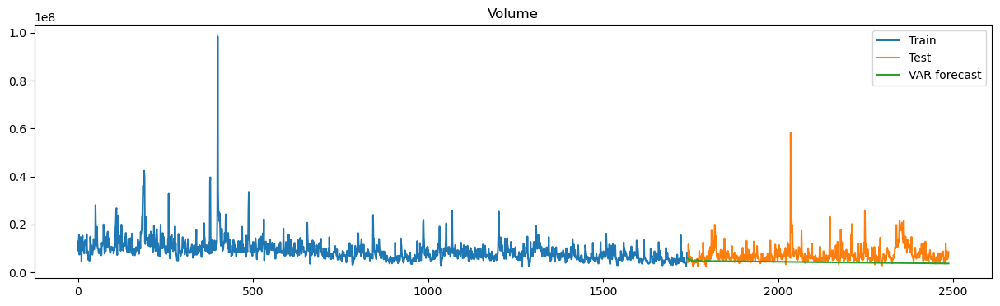

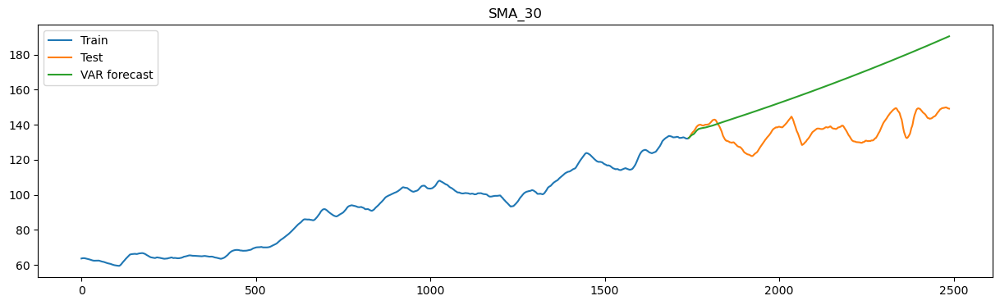

In [210]:
# Printing the train, test and forecasted values
plot_train_test_forecasted(JNJ,forecast_values)

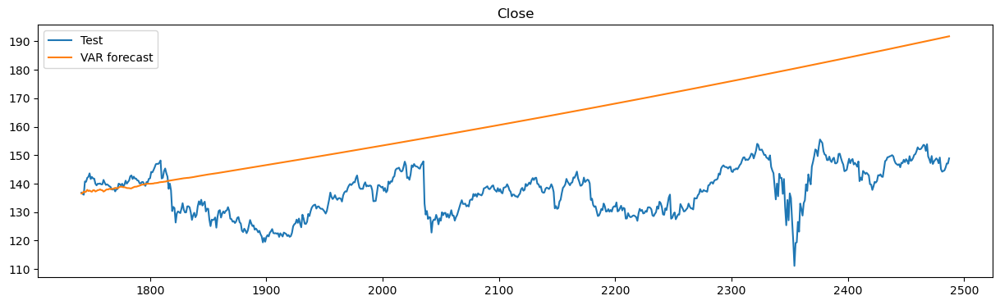

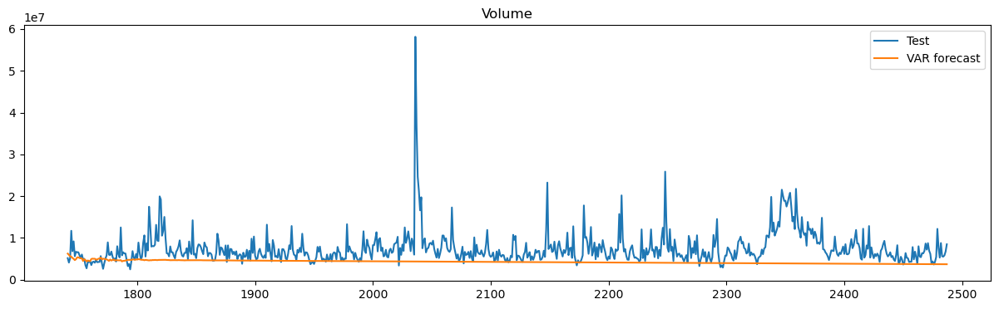

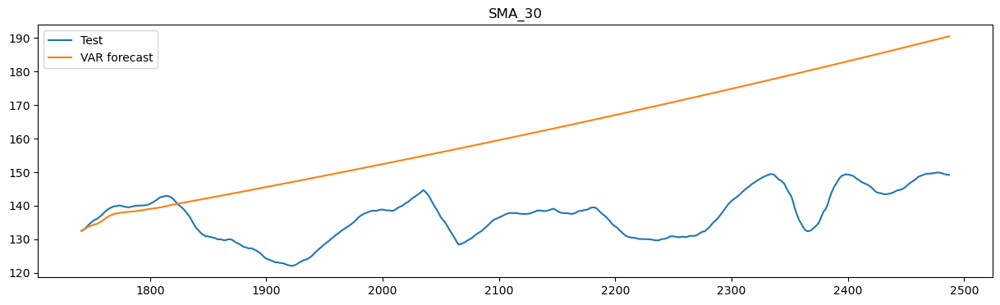

In [211]:
plot_test_forecasted(JNJ,forecast_values)

In [212]:
# we are able to see our model was able to capture the trend of the data, which will be used to forecast for future price.

In [213]:
model_evaluation(JNJ,forecast_values)

,Column,RMSE,MAPE
0,Close,28.84,18.76
0,Volume,5099617.23,36.35
0,SMA_30,27.94,18.03


#### PREDICTION OF FUTURE PRICE (BASED ON CLIENT TIME HORIZON)

In [214]:
# as understood, our client wants to be invested during her college time.
# which can be approximated to arounf 5 years in US.
# 5 years of investment  = (trading days in a year) * 5 

In [215]:
# predicing for next 5 years:
predicted_fut = results.forecast(y = test_data_boxcox_diff.values[-lag_order:] , steps = 252*5)
forecasted_fut = pd.DataFrame(predicted_fut, index = range(252*5), columns = JNJ.columns)

In [216]:
# reversing data transformation
forecast_values_fut = invert_transformation(test_data_boxcox, forecasted_fut)

In [217]:
forecast_values_fut.tail()

,Close,Volume,SMA_30
1255,265.008242,4.116982e+06,263.338376
1256,265.129671,4.115509e+06,263.459049
1257,265.251156,4.114036e+06,263.579777
1258,265.372696,4.112563e+06,263.700560
1259,265.494292,4.111092e+06,263.821399


In [218]:
# average annual return
JNJ_average_annual_return = round((((forecast_values_fut.iloc[-1][0] - JNJ.iloc[-1][0])/JNJ.iloc[-1][0])*100)/5 ,2)
JNJ_average_annual_return

15.67

### PORTFOLIO STOCK  #4
### FORECASTING 'MRK' (MERCK & CO) COMPANY STOCK VALUE

In [219]:
# extracing the data with relevant columns
MRK = selected_stock_data(MRK)

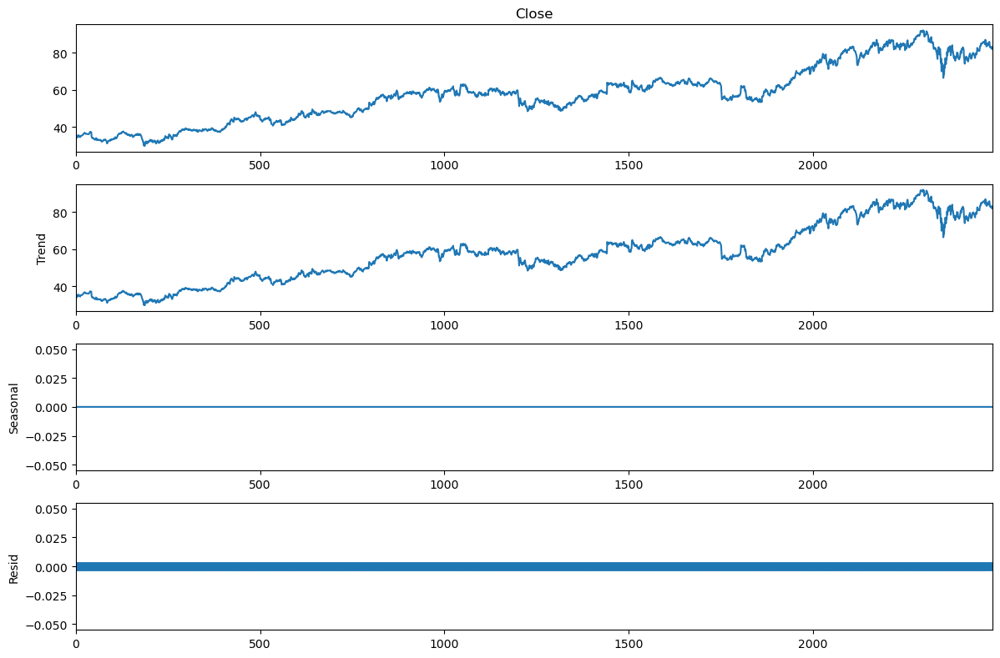

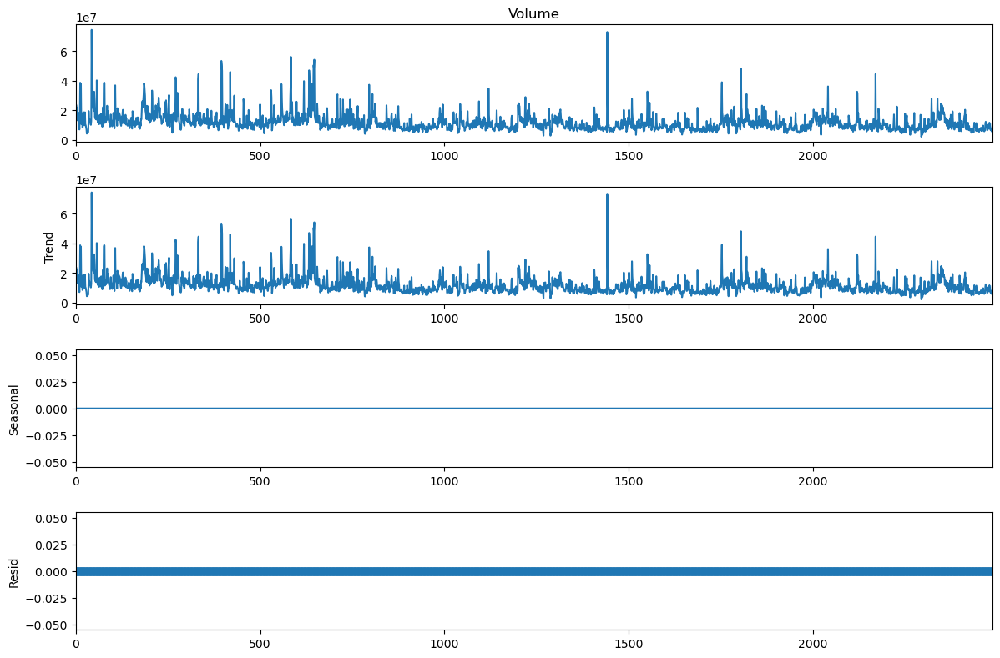

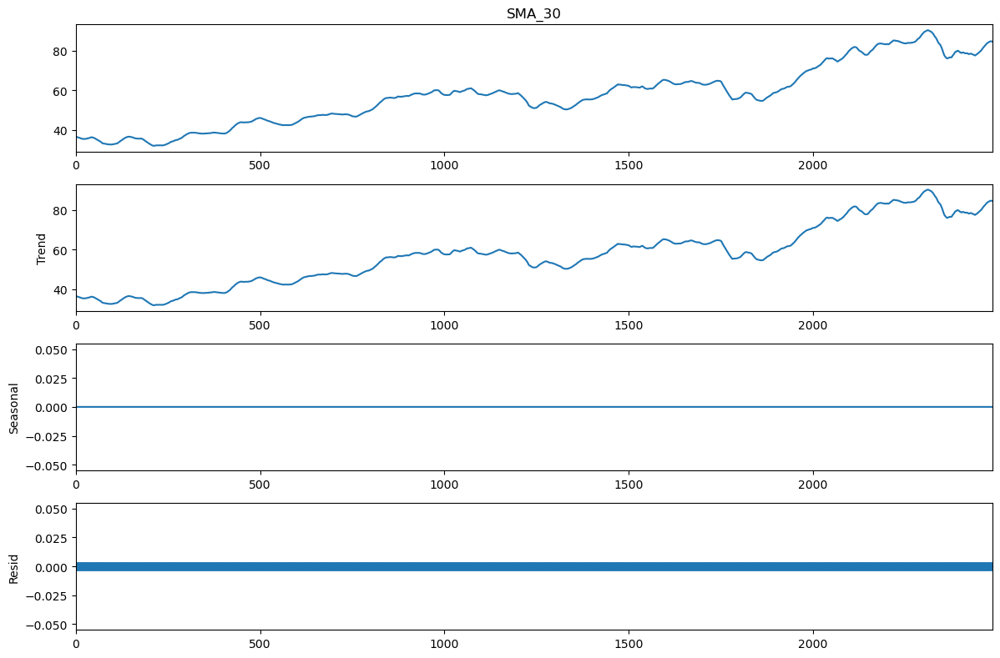

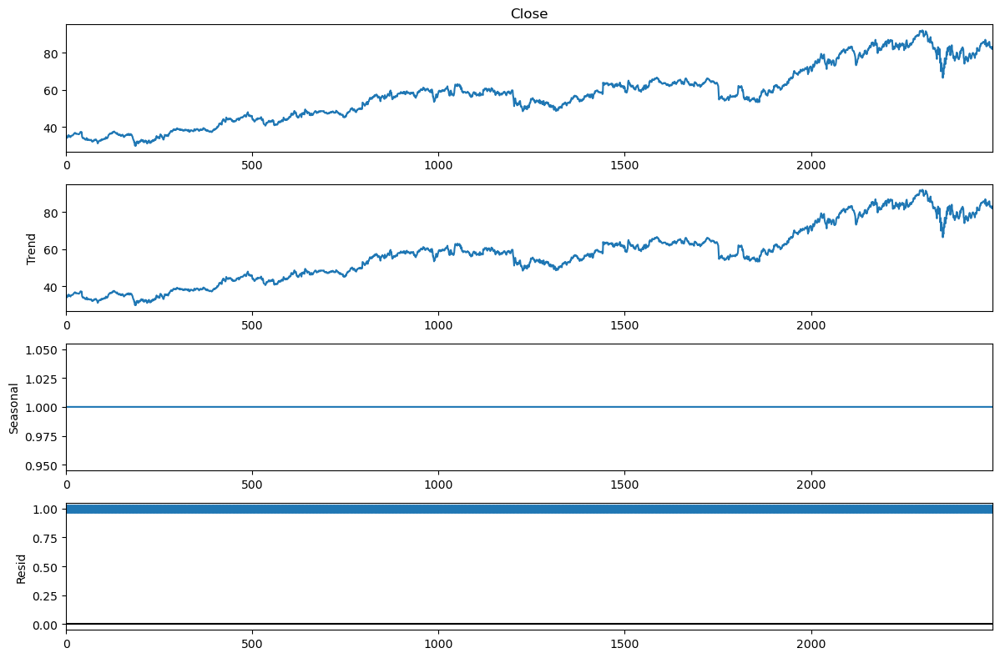

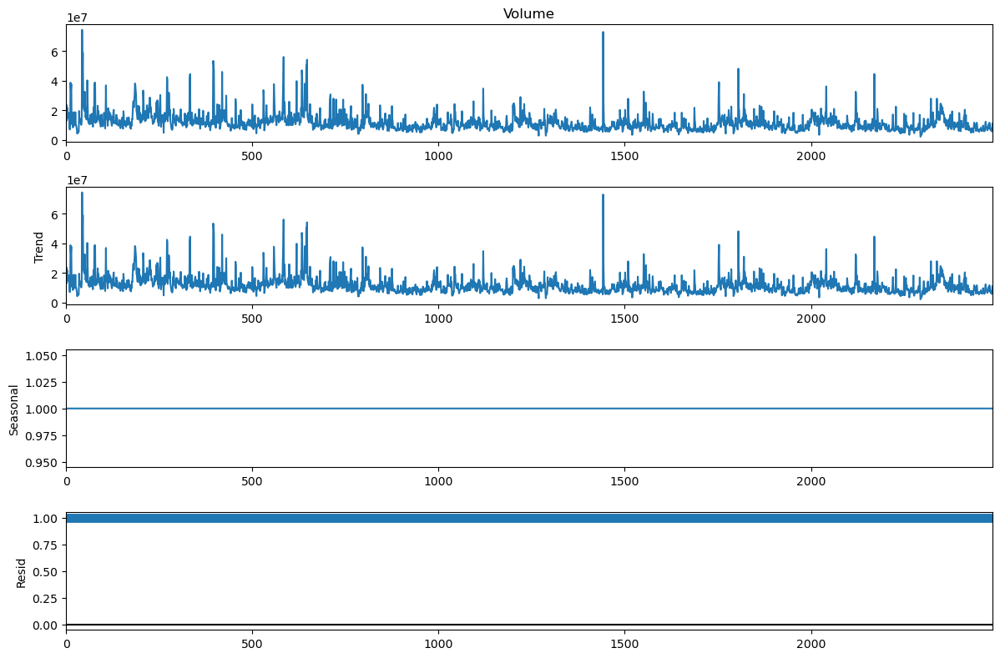

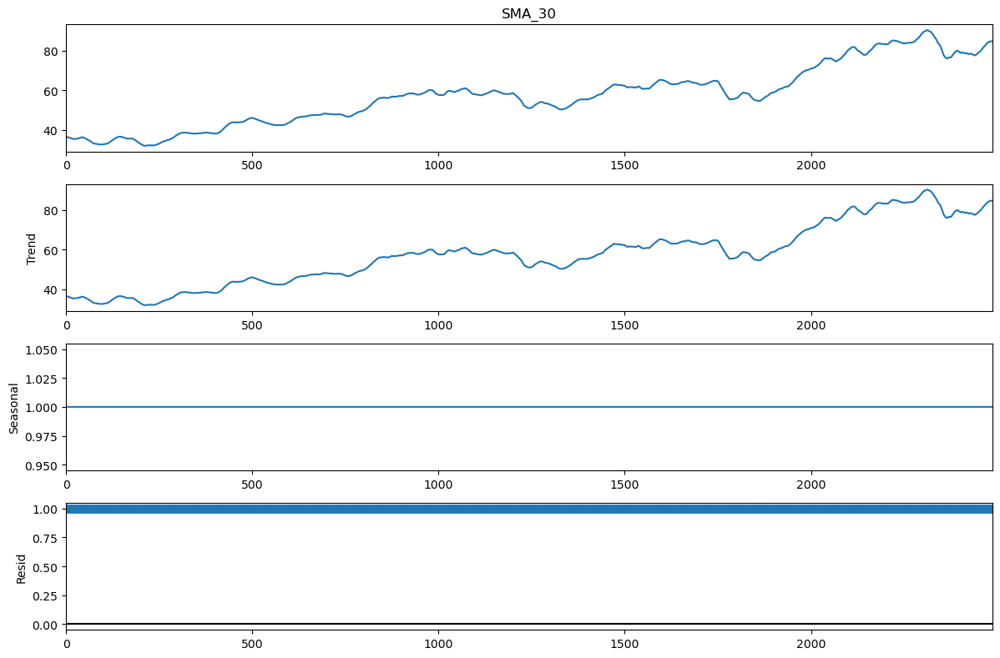

In [220]:
# checking whether series has trend, seasonality or any patterns
trend_check(MRK)

In [221]:
# its evident, we have trend component in the data as expected, but no seasonailty.

In [222]:
# Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test to check for stationarity
stationarity_test(MRK)

Close
KPSS Statistic: 6.980729
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Non-Stationary

--------------------------------------

Volume
KPSS Statistic: 3.433454
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Non-Stationary

--------------------------------------

SMA_30
KPSS Statistic: 6.998421
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Non-Stationary

--------------------------------------



C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(


In [223]:
# as expected, all the variables in stock data are Non-Stationary. We will be addressing these by transforming the data. 

## 1. Boxcox Transformation

## 2. diffrencing

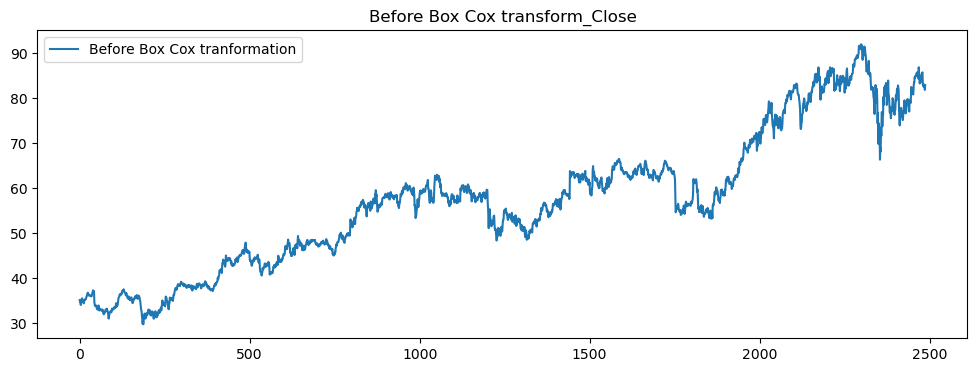

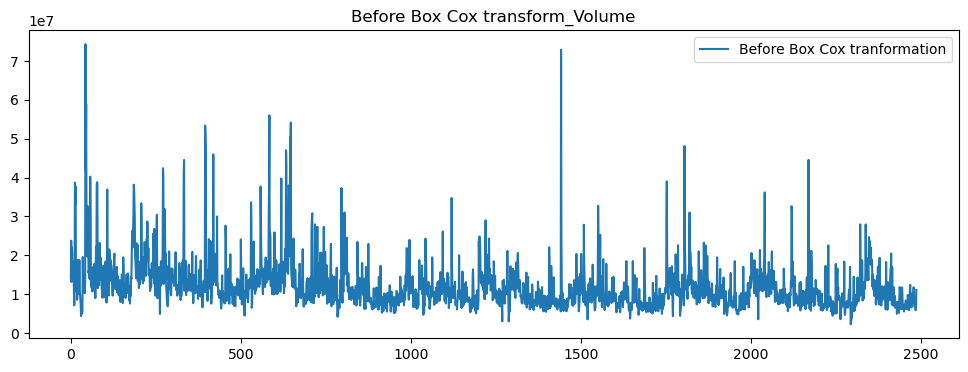

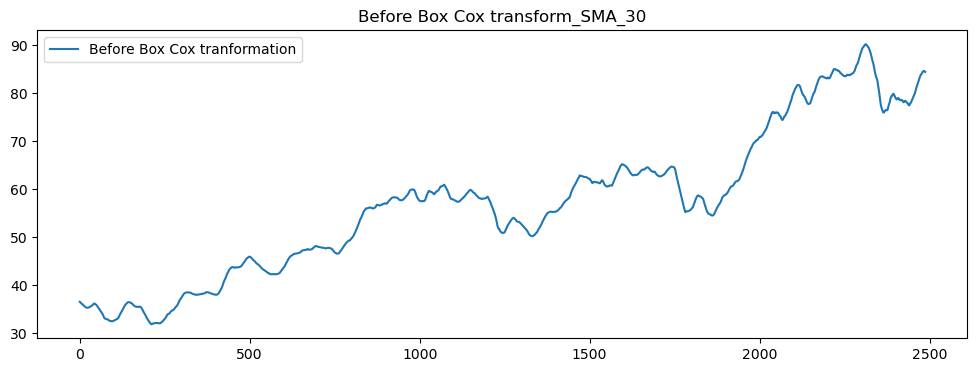

In [224]:
# series before boxcox transformation
plot_before_boxcox(MRK)

In [225]:
#Using Boxcox method

from scipy.stats import boxcox

MRK_boxcox = pd.DataFrame(columns=[MRK.columns])  # Empty dataframe

for col in MRK.columns:
    temp_data = pd.Series(boxcox(MRK[col], lmbda=0), index = MRK.index, name = col)
    MRK_boxcox[col] = temp_data

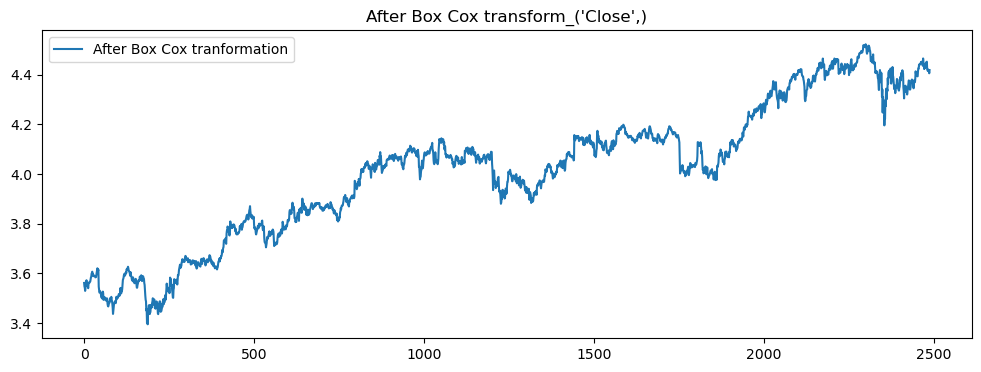

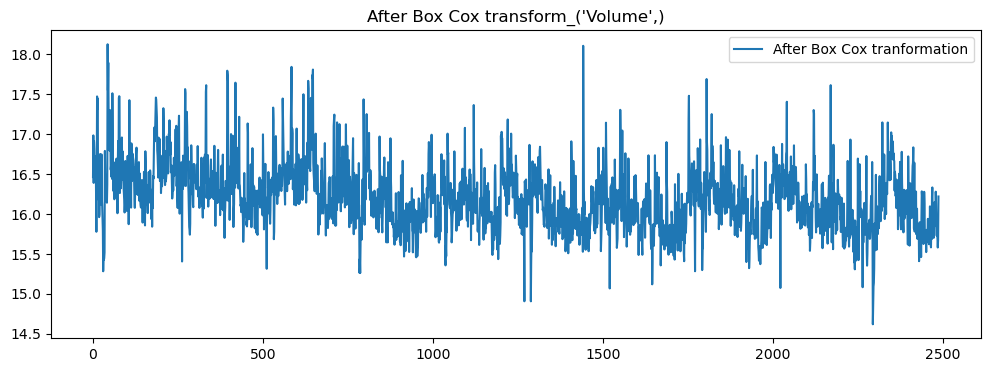

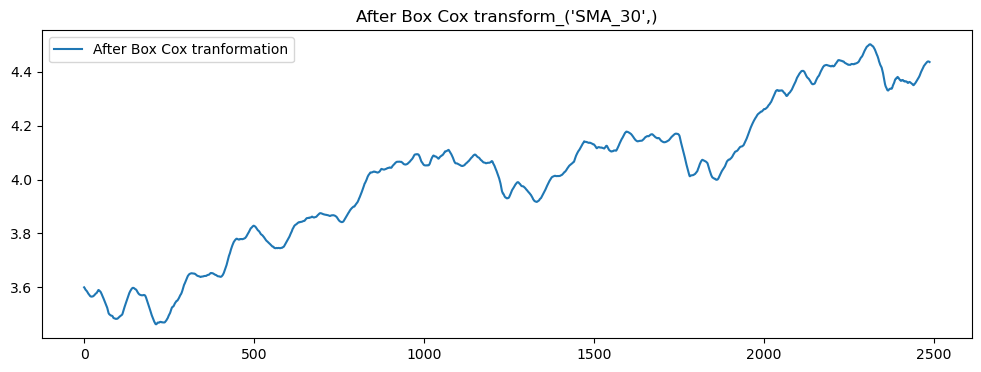

In [226]:
# Plotting all boxcox transformed columns
plot_after_boxcox(MRK_boxcox)

In [227]:
# WE CAN SEE, THE SCALES HAVE CHANGED FOR THE DATA. lETS PERFORM DIFFERENCING TO REMOVE TREND NEXT.

In [228]:
# Differencing to remove trend
MRK_boxcox_diff = MRK_boxcox.diff().dropna() # Differencing all variables to get rid of Stationarity

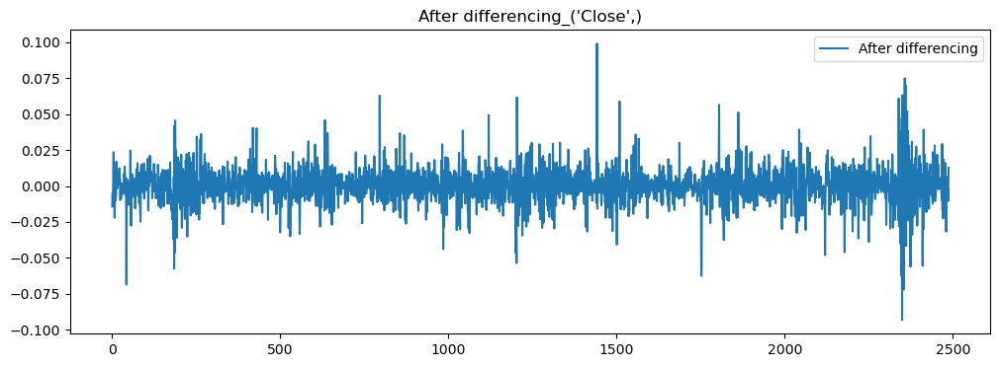

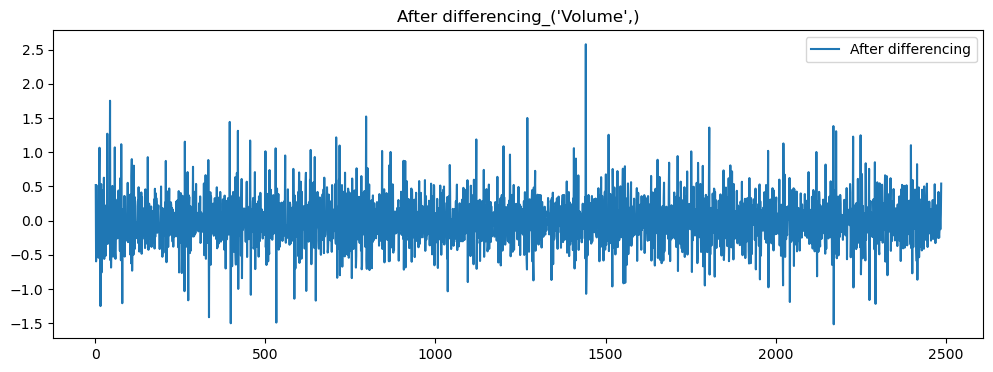

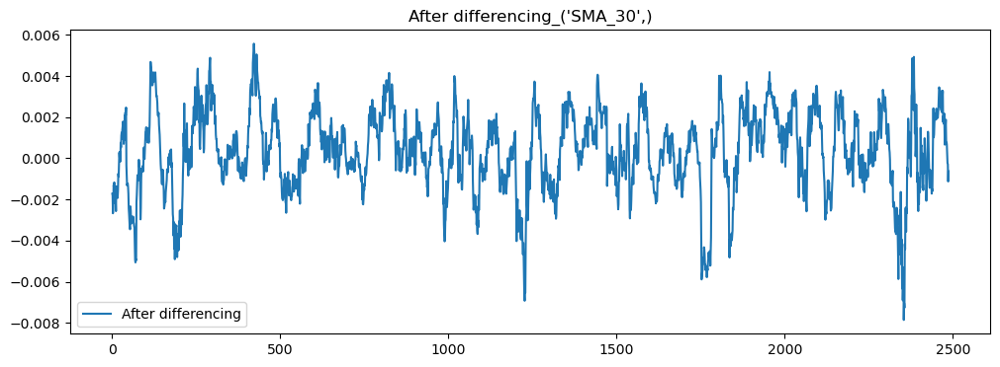

In [229]:
# Plotting all data_differenced columns
plot_after_differencing(MRK_boxcox_diff)

In [230]:
#lets check for stationarity again

In [231]:
stationarity_test(MRK_boxcox_diff)

('Close',)
KPSS Statistic: 0.028335
Critical Values @ 0.05: 0.46
p-value: 0.100000

Series is Stationary

--------------------------------------

('Volume',)
KPSS Statistic: 0.022697
Critical Values @ 0.05: 0.46
p-value: 0.100000

Series is Stationary

--------------------------------------

('SMA_30',)
KPSS Statistic: 0.049951
Critical Values @ 0.05: 0.46
p-value: 0.100000

Series is Stationary

--------------------------------------



C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(
C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(
C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(


In [232]:
# as expected, all the variables in stock data have become Stationary.

#### BUILDING VAR MODEL

In [233]:
# Test-Train Split of differentiated data

# Keeping 70% values as train
train_len = int(MRK.shape[0]*0.7)
test_len = int(MRK.shape[0]) - int(MRK.shape[0]*0.7)

# Train data - differenced
train_data_boxcox = MRK_boxcox[:train_len]
train_data_boxcox_diff = MRK_boxcox_diff[:train_len-1]

# Test data - differenced
test_data_boxcox = MRK_boxcox[train_len:]
test_data_boxcox_diff = MRK_boxcox_diff[train_len-1:]

In [234]:
from statsmodels.tsa.api import VAR

model = VAR(train_data_boxcox_diff)

C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [235]:
# To select the lag order
x = model.select_order(maxlags=50)
x.summary()

,AIC,BIC,FPE,HQIC
0,-23.62,-23.61,5.530e-11,-23.61
1,-26.72,-26.69,2.476e-12,-26.71
2,-26.77,-26.70,2.372e-12,-26.74
3,-26.80,-26.70,2.305e-12,-26.76
4,-26.82,-26.69,2.260e-12,-26.77
5,-26.82,-26.66,2.257e-12,-26.76
6,-26.83,-26.65,2.230e-12,-26.76
7,-26.83,-26.62,2.227e-12,-26.75
8,-26.83,-26.59,2.229e-12,-26.74
9,-26.83,-26.56,2.222e-12,-26.73


In [236]:
# Providing maxlags as 32 (minimum AIC vaue)
results = model.fit(maxlags =32, ic = 'aic')

In [237]:
# Printing the results - Evaluation parameters, lag coefficients, etc.
results.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 24, Mar, 2024
Time:                     04:43:28
--------------------------------------------------------------------
No. of Equations:         3.00000    BIC:                   -31.7234
Nobs:                     1708.00    HQIC:                  -32.3075
Log likelihood:           20904.1    FPE:                6.60892e-15
AIC:                     -32.6507    Det(Omega_mle):     5.59967e-15
--------------------------------------------------------------------
Results for equation Close
                coefficient       std. error           t-stat            prob
-----------------------------------------------------------------------------
const              0.000451         0.000299            1.507           0.132
L1.Close          -1.580108         0.484026           -3.265           0.001
L1.Volume         -0.002399         0.000969           -2.476           

In [238]:
# Forecasting using the VAR model
# Selecting the lag value from the above results
lag_order = 32

In [239]:
# Obtaining the forecast values
predicted = results.forecast(y = train_data_boxcox_diff.values[-lag_order:] , steps = test_len)
forecasted = pd.DataFrame(predicted, index = MRK.index[train_len:], columns = MRK.columns)

In [240]:
forecasted.head()

,Close,Volume,SMA_30
1741,-0.000172,-0.131071,0.000336
1742,-0.001123,-0.176272,-0.000086
1743,0.002088,0.068022,-0.000001
1744,0.000402,0.008257,0.000122
1745,0.004034,-0.057711,0.000058


In [241]:
# we need to reverse the data transformation to compare results
# Inverted values
forecast_values = invert_transformation(train_data_boxcox, forecasted)

In [242]:
forecast_values.head()

,Close,Volume,SMA_30
1741,63.769009,8.860671e+06,64.750774
1742,63.697424,7.428696e+06,64.745190
1743,63.830532,7.951597e+06,64.745095
1744,63.856192,8.017522e+06,64.752998
1745,64.114313,7.567924e+06,64.756738


#### Comparing results

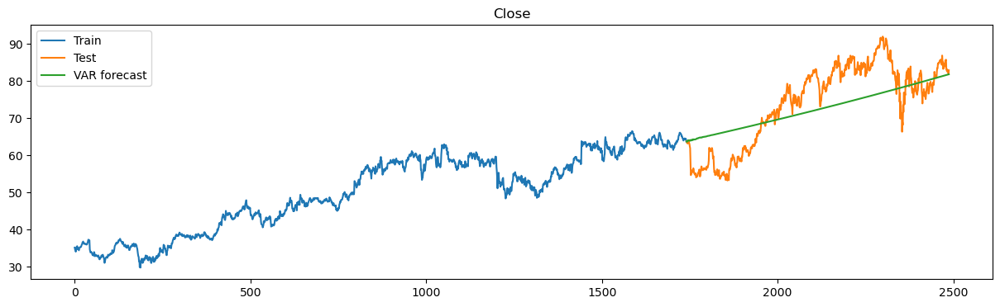

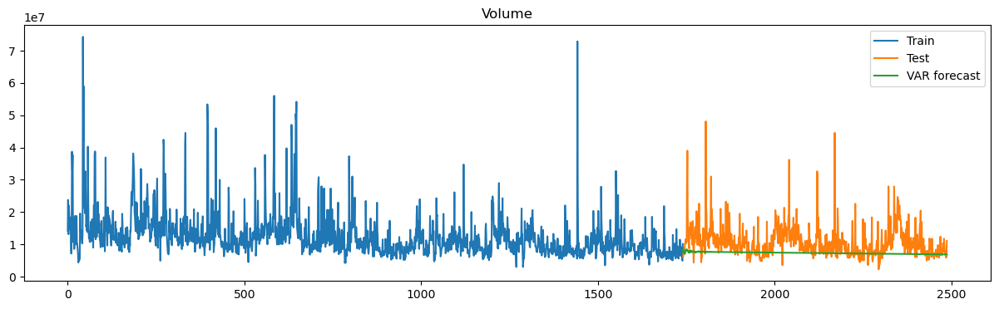

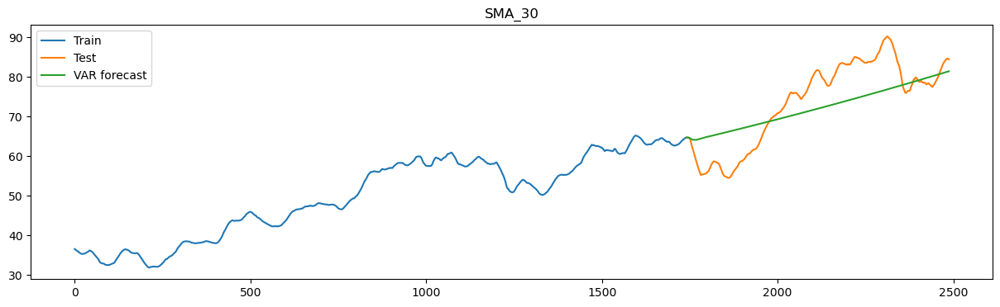

In [243]:
# Printing the train, test and forecasted values
plot_train_test_forecasted(MRK,forecast_values)

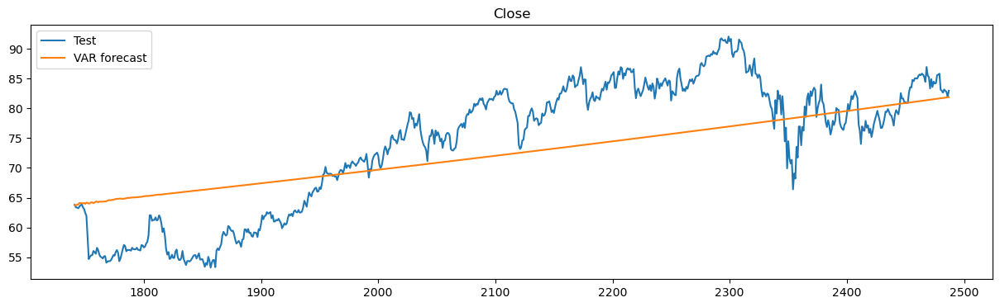

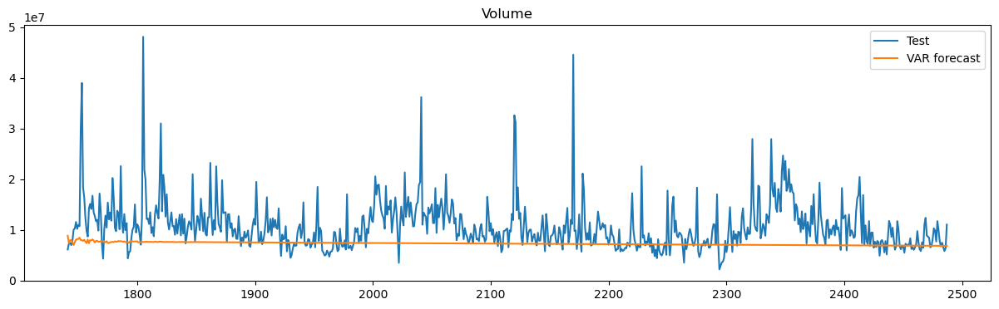

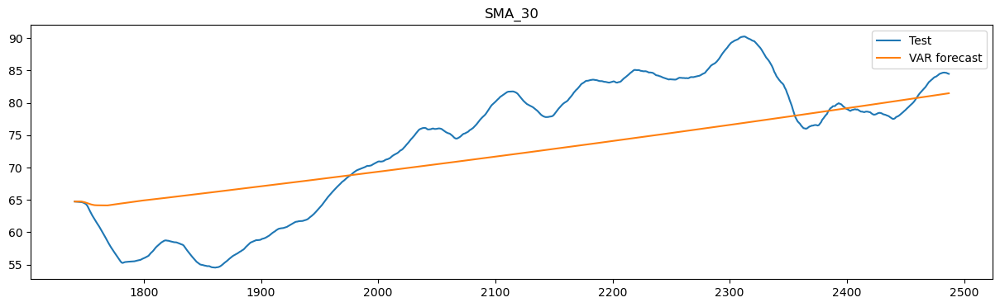

In [244]:
plot_test_forecasted(MRK,forecast_values)

In [245]:
# we are able to see our model was able to capture the trend of the data, which will be used to forecast for future price.

In [246]:
model_evaluation(MRK,forecast_values)

,Column,RMSE,MAPE
0,Close,7.41,8.92
0,Volume,5830965.89,30.24
0,SMA_30,7.09,8.50


#### PREDICTION OF FUTURE PRICE (BASED ON CLIENT TIME HORIZON)

In [247]:
# as understood, our client wants to be invested during her college time.
# which can be approximated to arounf 5 years in US.
# 5 years of investment  = (trading days in a year) * 5 

In [248]:
# predicing for next 5 years:
predicted_fut = results.forecast(y = test_data_boxcox_diff.values[-lag_order:] , steps = 252*5)
forecasted_fut = pd.DataFrame(predicted_fut, index = range(252*5), columns = MRK.columns)

In [249]:
# reversing data transformation
forecast_values_fut = invert_transformation(test_data_boxcox, forecasted_fut)

In [250]:
forecast_values_fut.tail()

,Close,Volume,SMA_30
1255,126.135265,6.793995e+06,125.531227
1256,126.177012,6.792915e+06,125.572767
1257,126.218772,6.791835e+06,125.614320
1258,126.260547,6.790756e+06,125.655887
1259,126.302335,6.789676e+06,125.697468


In [251]:
# average annual return
MRK_average_annual_return = round((((forecast_values_fut.iloc[-1][0] - MRK.iloc[-1][0])/MRK.iloc[-1][0])*100)/5 ,2)
MRK_average_annual_return

10.45

### PORTFOLIO STOCK  #5
### FORECASTING 'GOOG' (GOOGLE) COMPANY STOCK VALUE

In [252]:
# extracing the data with relevant columns
GOOG = selected_stock_data(GOOG)

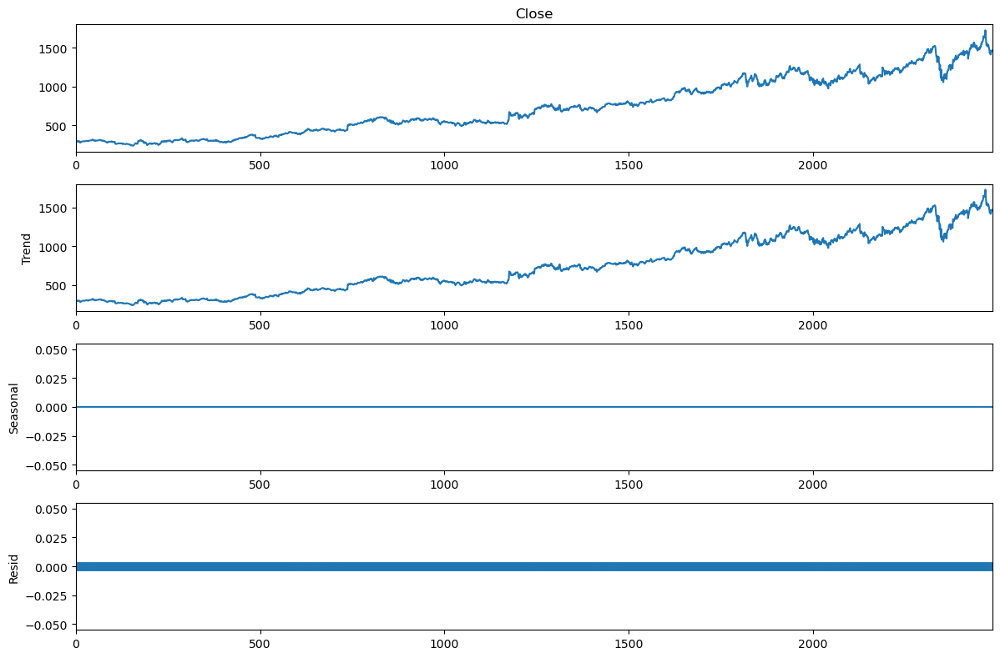

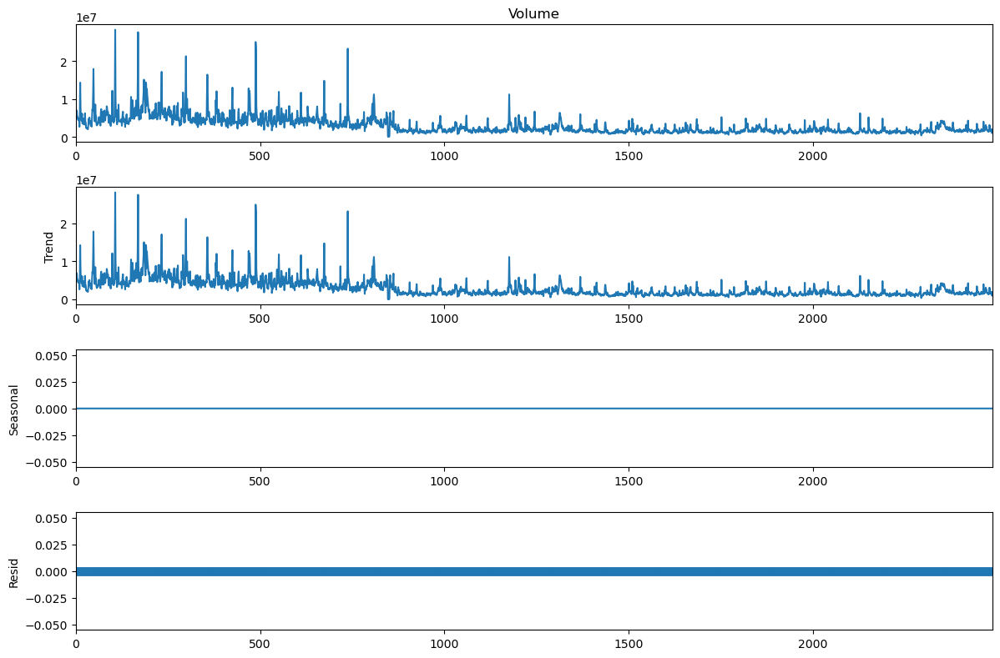

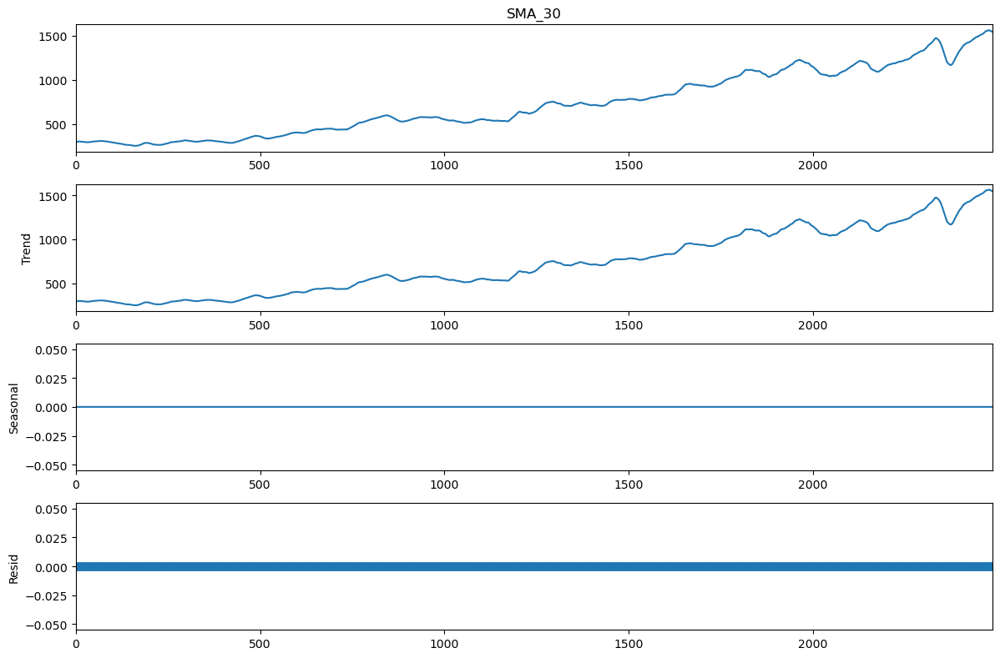

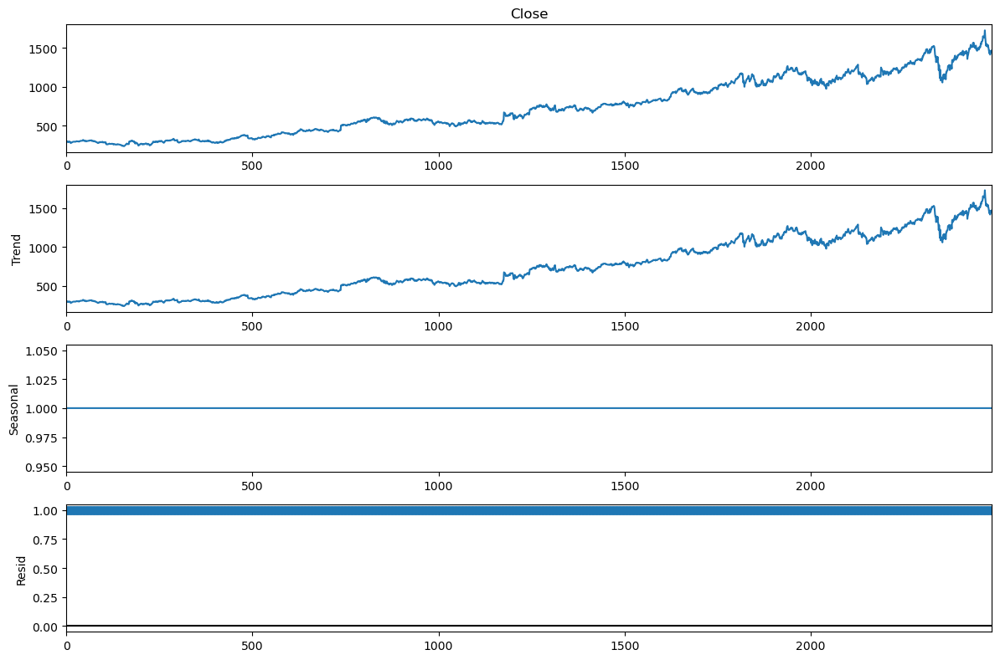

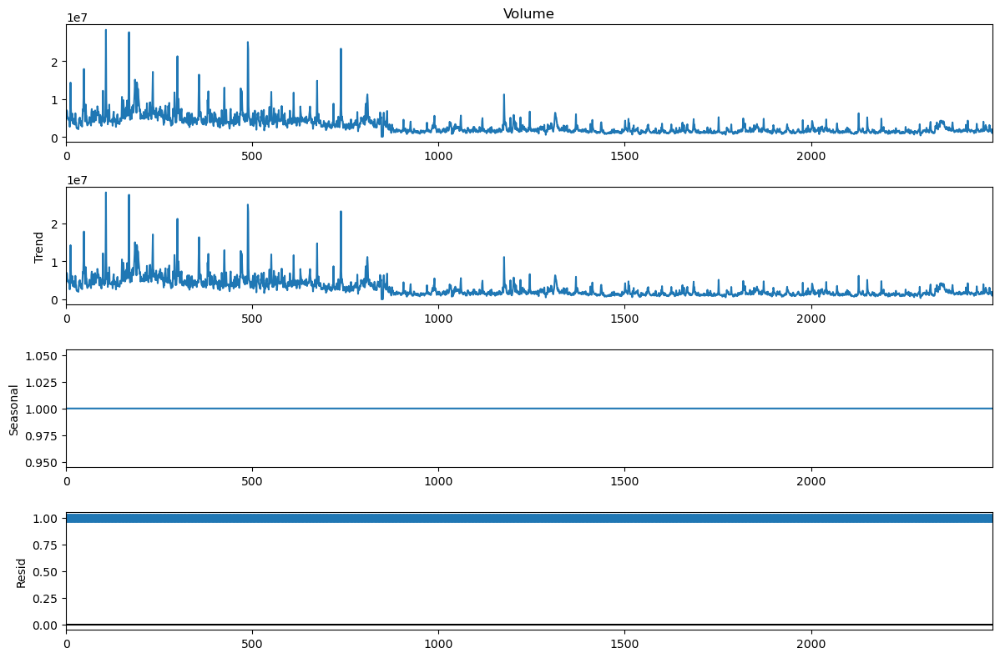

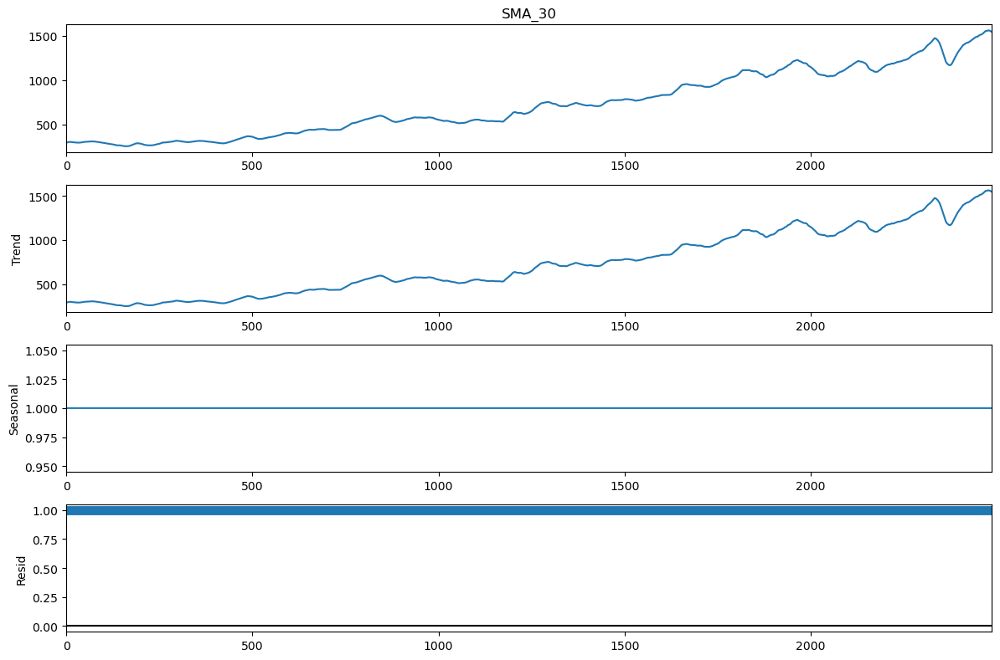

In [253]:
# checking whether series has trend, seasonality or any patterns
trend_check(GOOG)

In [254]:
# its evident, we have trend component in the data as expected, but no seasonailty.

In [255]:
# Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test to check for stationarity
stationarity_test(GOOG)

Close
KPSS Statistic: 7.806744
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Non-Stationary

--------------------------------------

Volume
KPSS Statistic: 6.167273
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Non-Stationary

--------------------------------------

SMA_30
KPSS Statistic: 7.838289
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Non-Stationary

--------------------------------------



C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(


In [256]:
# as expected, all the variables in stock data are Non-Stationary. We will be addressing these by transforming the data. 

## 1. Boxcox Transformation

## 2. diffrencing

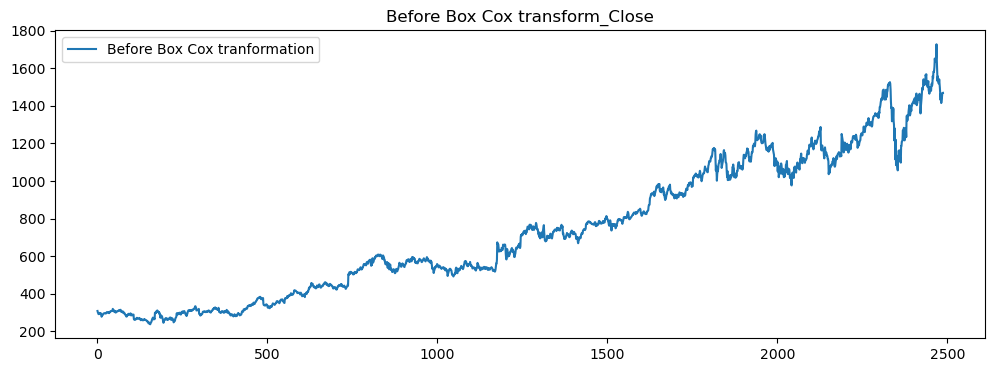

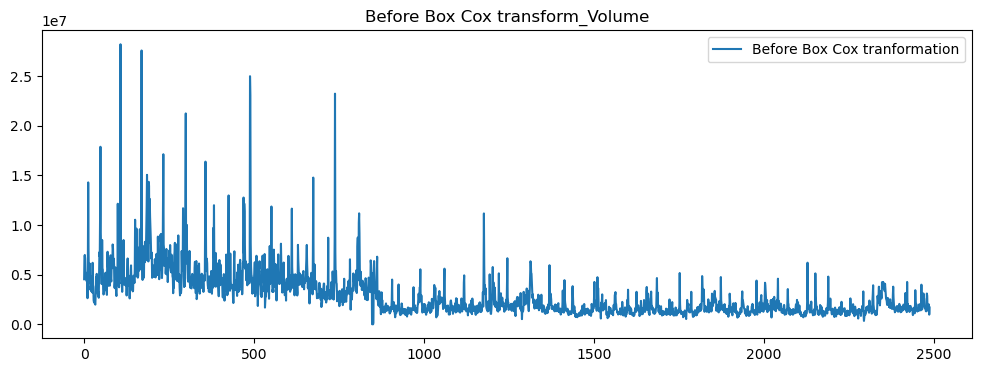

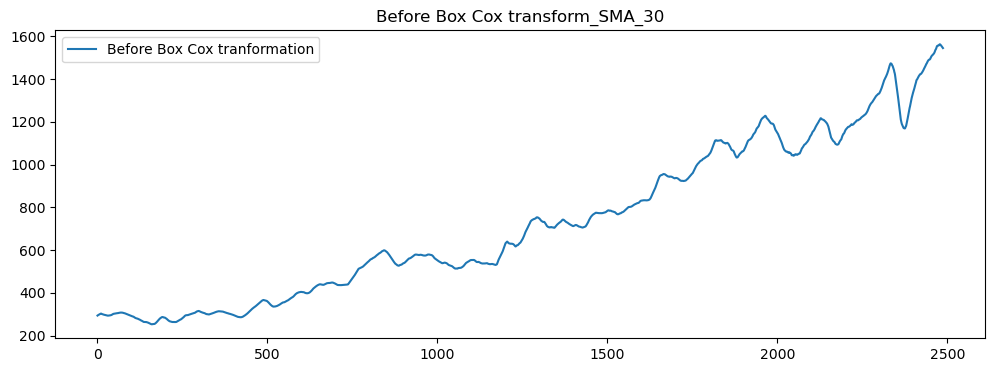

In [257]:
# series before boxcox transformation
plot_before_boxcox(GOOG)

In [258]:
#Using Boxcox method

from scipy.stats import boxcox

GOOG_boxcox = pd.DataFrame(columns=[GOOG.columns])  # Empty dataframe

for col in GOOG.columns:
    temp_data = pd.Series(boxcox(GOOG[col], lmbda=0), index = GOOG.index, name = col)
    GOOG_boxcox[col] = temp_data

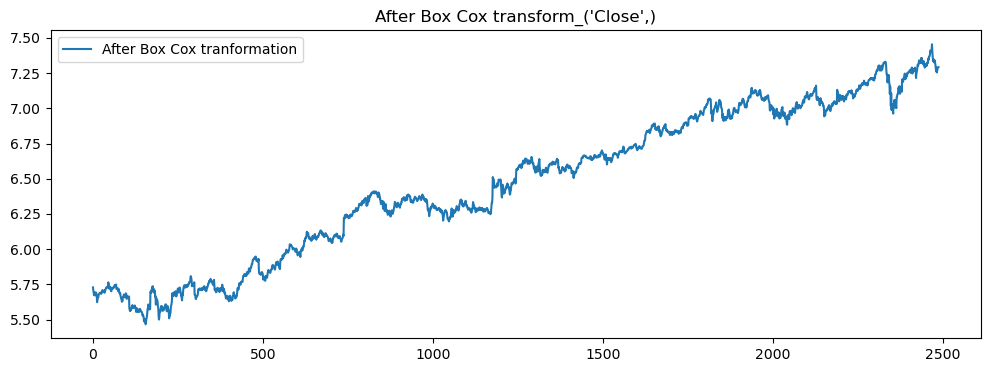

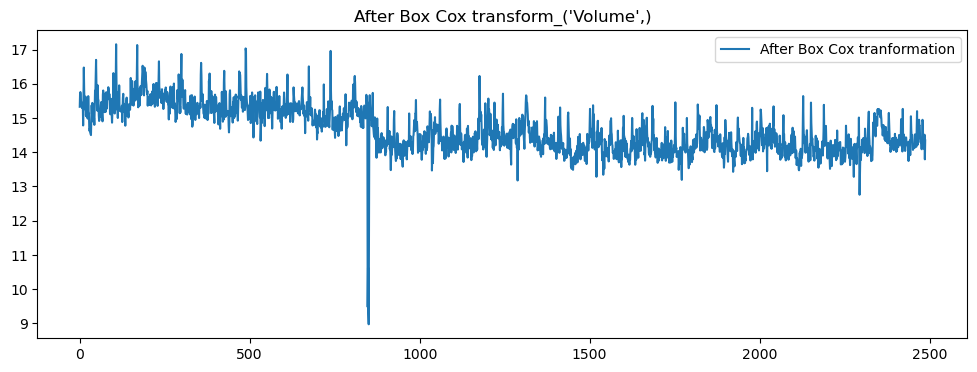

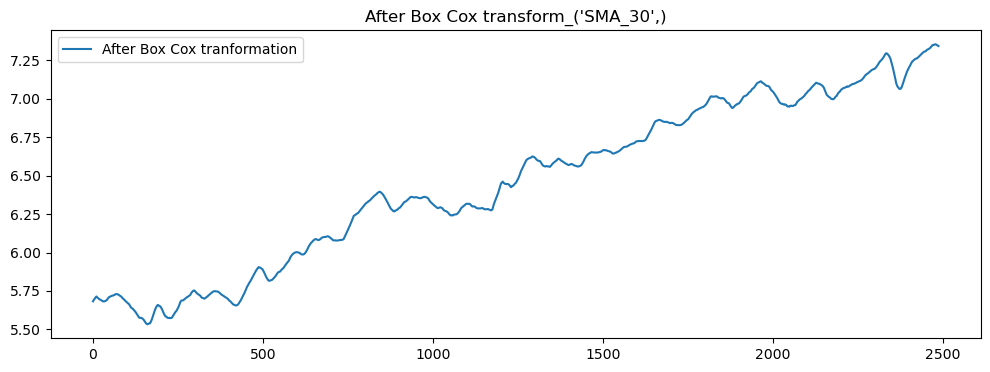

In [259]:
# Plotting all boxcox transformed columns
plot_after_boxcox(GOOG_boxcox)

In [260]:
# WE CAN SEE, THE SCALES HAVE CHANGED FOR THE DATA. lETS PERFORM DIFFERENCING TO REMOVE TREND NEXT.

In [261]:
# Differencing to remove trend
GOOG_boxcox_diff = GOOG_boxcox.diff().dropna() # Differencing all variables to get rid of Stationarity

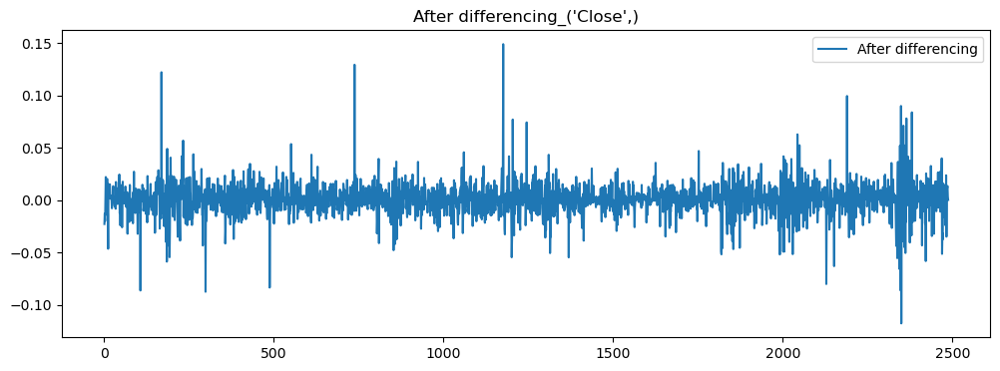

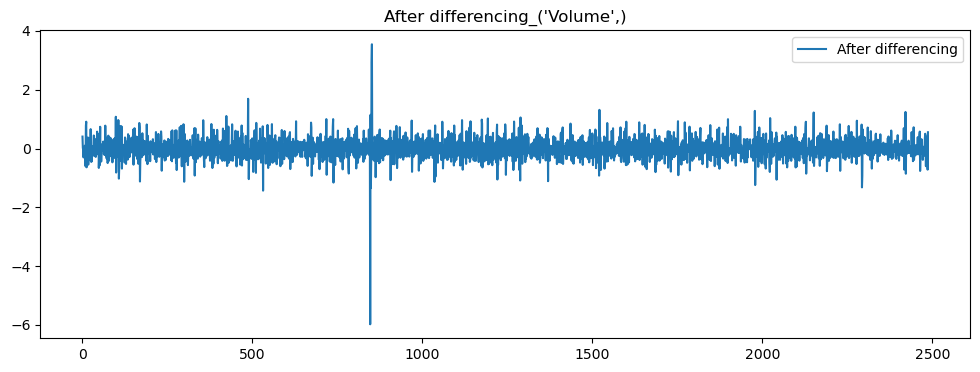

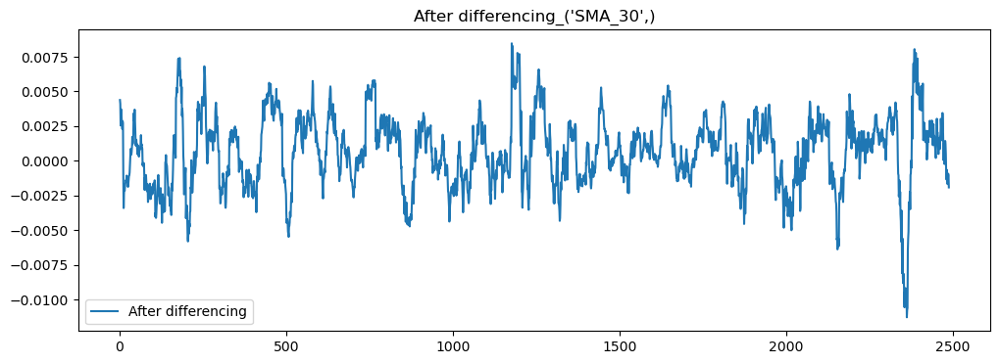

In [262]:
# Plotting all data_differenced columns
plot_after_differencing(GOOG_boxcox_diff)

In [263]:
#lets check for stationarity again

In [264]:
stationarity_test(GOOG_boxcox_diff)

('Close',)
KPSS Statistic: 0.025859
Critical Values @ 0.05: 0.46
p-value: 0.100000

Series is Stationary

--------------------------------------

('Volume',)
KPSS Statistic: 0.050519
Critical Values @ 0.05: 0.46
p-value: 0.100000

Series is Stationary

--------------------------------------

('SMA_30',)
KPSS Statistic: 0.041399
Critical Values @ 0.05: 0.46
p-value: 0.100000

Series is Stationary

--------------------------------------



C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(
C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(
C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(


In [265]:
# as expected, all the variables in stock data have become Stationary.

#### BUILDING VAR MODEL

In [266]:
# Test-Train Split of differentiated data

# Keeping 70% values as train
train_len = int(GOOG.shape[0]*0.7)
test_len = int(GOOG.shape[0]) - int(GOOG.shape[0]*0.7)

# Train data - differenced
train_data_boxcox = GOOG_boxcox[:train_len]
train_data_boxcox_diff = GOOG_boxcox_diff[:train_len-1]

# Test data - differenced
test_data_boxcox = GOOG_boxcox[train_len:]
test_data_boxcox_diff = GOOG_boxcox_diff[train_len-1:]

In [267]:
from statsmodels.tsa.api import VAR

model = VAR(train_data_boxcox_diff)

C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [268]:
# To select the lag order
x = model.select_order(maxlags=50)
x.summary()

,AIC,BIC,FPE,HQIC
0,-22.33,-22.32,2.011e-10,-22.32
1,-25.59,-25.55,7.711e-12,-25.57
2,-25.60,-25.54,7.599e-12,-25.58
3,-25.60,-25.50,7.620e-12,-25.56
4,-25.62,-25.49,7.470e-12,-25.57
5,-25.65,-25.49,7.277e-12,-25.59
6,-25.66,-25.47,7.208e-12,-25.59
7,-25.66,-25.45,7.174e-12,-25.58
8,-25.66,-25.42,7.155e-12,-25.57
9,-25.66,-25.39,7.190e-12,-25.56


In [269]:
# Providing maxlags as 30 (minimum AIC vaue)
results = model.fit(maxlags =30, ic = 'aic')

In [270]:
# Printing the results - Evaluation parameters, lag coefficients, etc.
results.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 24, Mar, 2024
Time:                     04:43:38
--------------------------------------------------------------------
No. of Equations:         3.00000    BIC:                   -29.8865
Nobs:                     1710.00    HQIC:                  -30.4340
Log likelihood:           19290.0    FPE:                4.39651e-14
AIC:                     -30.7557    Det(Omega_mle):     3.76319e-14
--------------------------------------------------------------------
Results for equation Close
                coefficient       std. error           t-stat            prob
-----------------------------------------------------------------------------
const              0.000946         0.000386            2.451           0.014
L1.Close          -0.120166         0.173592           -0.692           0.489
L1.Volume          0.000565         0.001005            0.562           

In [271]:
# Forecasting using the VAR model
# Selecting the lag value from the above results
lag_order = 30

In [272]:
# Obtaining the forecast values
predicted = results.forecast(y = train_data_boxcox_diff.values[-lag_order:] , steps = test_len)
forecasted = pd.DataFrame(predicted, index = GOOG.index[train_len:], columns = GOOG.columns)

In [273]:
forecasted.head()

,Close,Volume,SMA_30
1741,0.002217,-0.089660,0.002191
1742,0.000674,0.048051,0.001875
1743,-0.000060,-0.044045,0.001937
1744,-0.005903,-0.102916,0.002047
1745,0.003287,-0.045284,0.002173


In [274]:
# we need to reverse the data transformation to compare results
# Inverted values
forecast_values = invert_transformation(train_data_boxcox, forecasted)

In [275]:
forecast_values.head()

,Close,Volume,SMA_30
1741,991.446019,1.548086e+06,943.576519
1742,992.114547,1.624289e+06,945.347392
1743,992.055078,1.554301e+06,947.180130
1744,986.216720,1.402295e+06,949.120983
1745,989.463508,1.340210e+06,951.185826


#### Comparing results

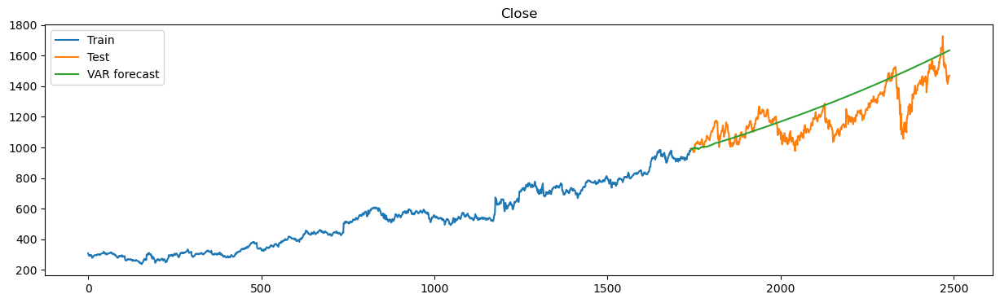

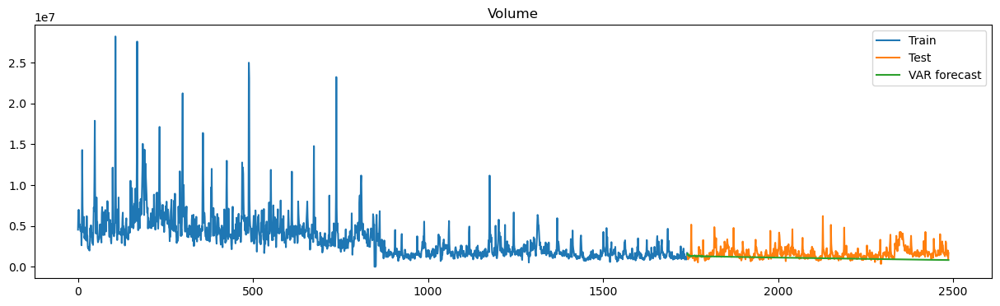

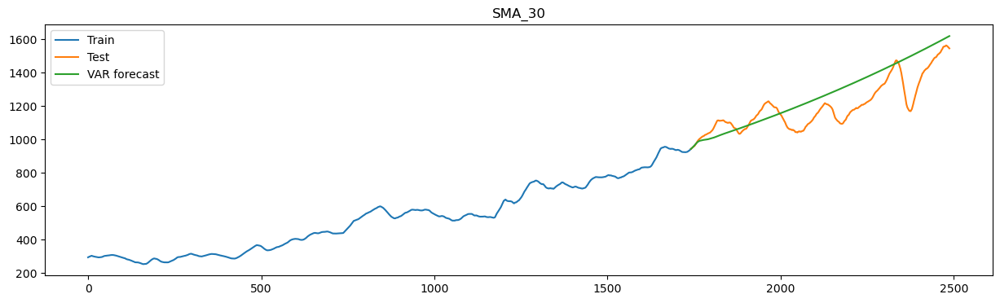

In [276]:
# Printing the train, test and forecasted values
plot_train_test_forecasted(GOOG,forecast_values)

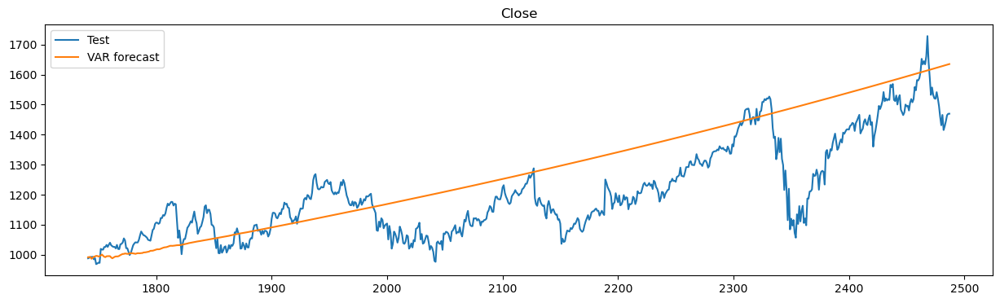

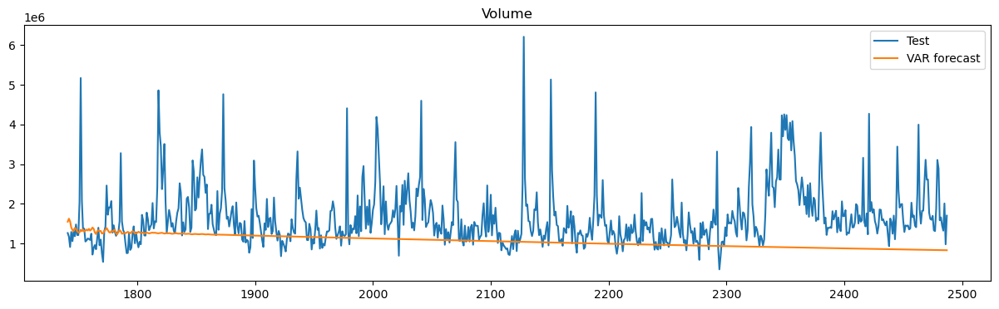

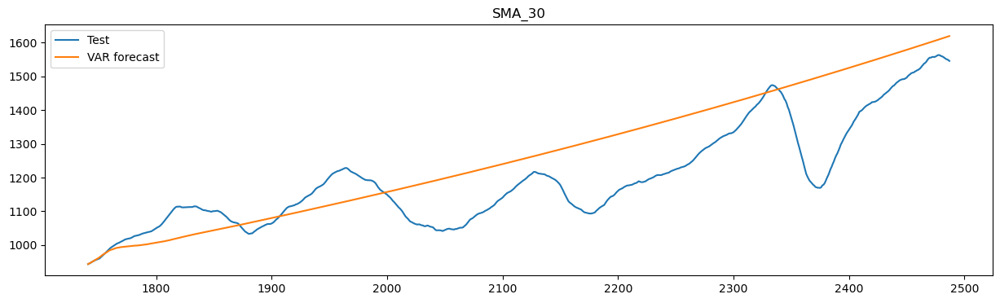

In [277]:
plot_test_forecasted(GOOG,forecast_values)

In [278]:
# we are able to see our model was able to capture the trend of the data, which will be used to forecast for future price.

In [279]:
model_evaluation(GOOG,forecast_values)

,Column,RMSE,MAPE
0,Close,128.15,8.71
0,Volume,974554.79,33.38
0,SMA_30,118.95,8.10


#### PREDICTION OF FUTURE PRICE (BASED ON CLIENT TIME HORIZON)

In [280]:
# as understood, our client wants to be invested during her college time.
# which can be approximated to arounf 5 years in US.
# 5 years of investment  = (trading days in a year) * 5 

In [281]:
# predicing for next 5 years:
predicted_fut = results.forecast(y = test_data_boxcox_diff.values[-lag_order:] , steps = 252*5)
forecasted_fut = pd.DataFrame(predicted_fut, index = range(252*5), columns = GOOG.columns)

In [282]:
# reversing data transformation
forecast_values_fut = invert_transformation(test_data_boxcox, forecasted_fut)

In [283]:
forecast_values_fut.tail()

,Close,Volume,SMA_30
1255,3577.726676,799539.530201,3551.369101
1256,3580.194846,799039.221196,3553.819357
1257,3582.664718,798539.225257,3556.271303
1258,3585.136294,798039.542189,3558.724941
1259,3587.609575,797540.171795,3561.180272


In [284]:
# average annual return
GOOG_average_annual_return = round((((forecast_values_fut.iloc[-1][0] - GOOG.iloc[-1][0])/GOOG.iloc[-1][0])*100)/5 ,2)
GOOG_average_annual_return

28.82

### MARKET INDEX  
### FORECASTING 'SP500' (S&P 500)  STOCK VALUE

In [285]:
# extracing the data with relevant columns
SP500 = selected_stock_data(SP500)

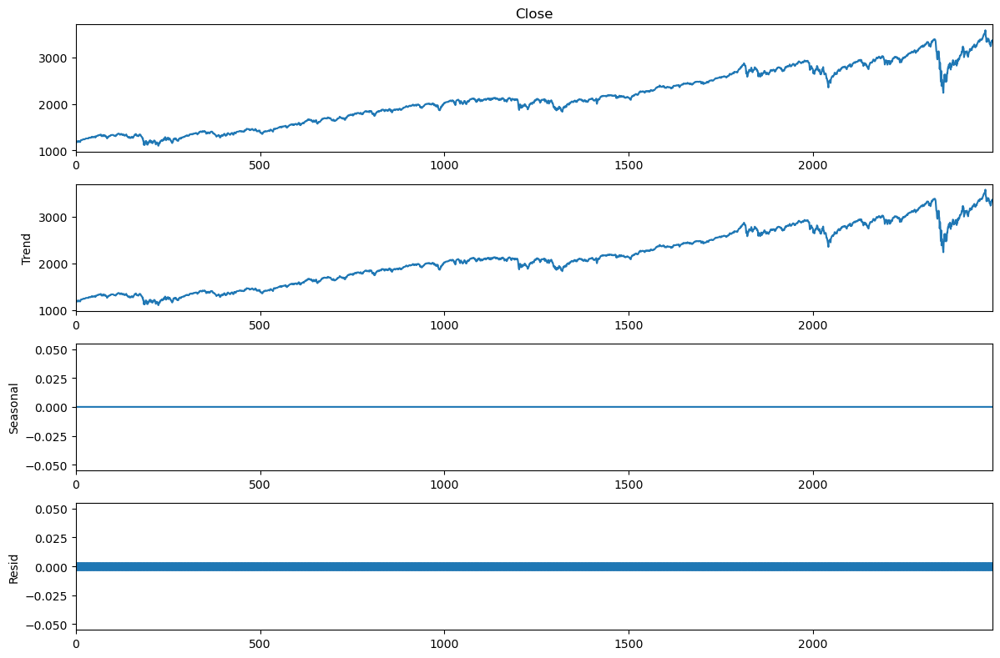

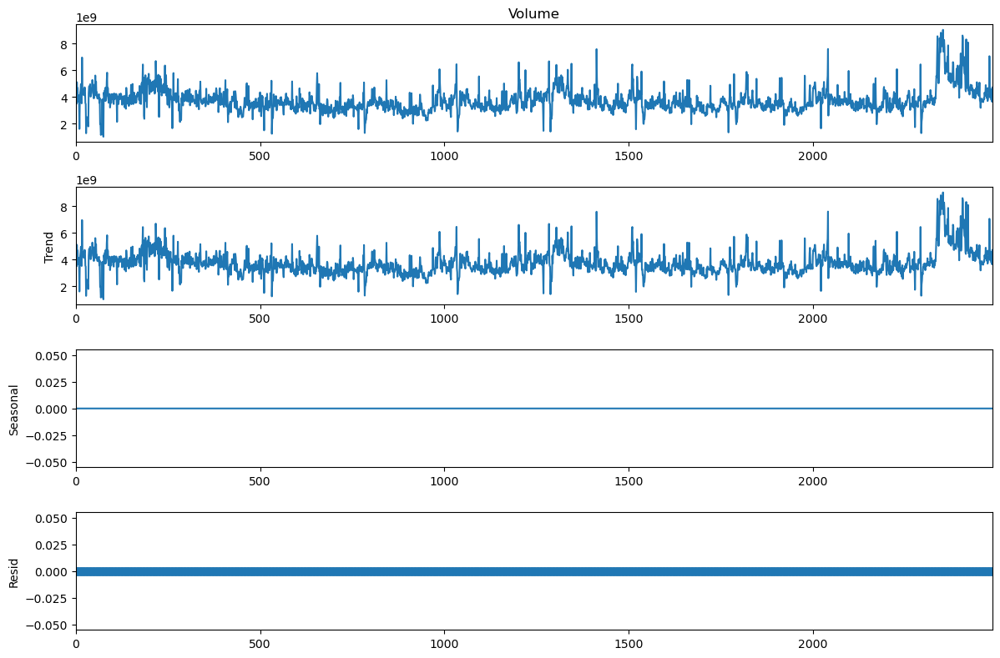

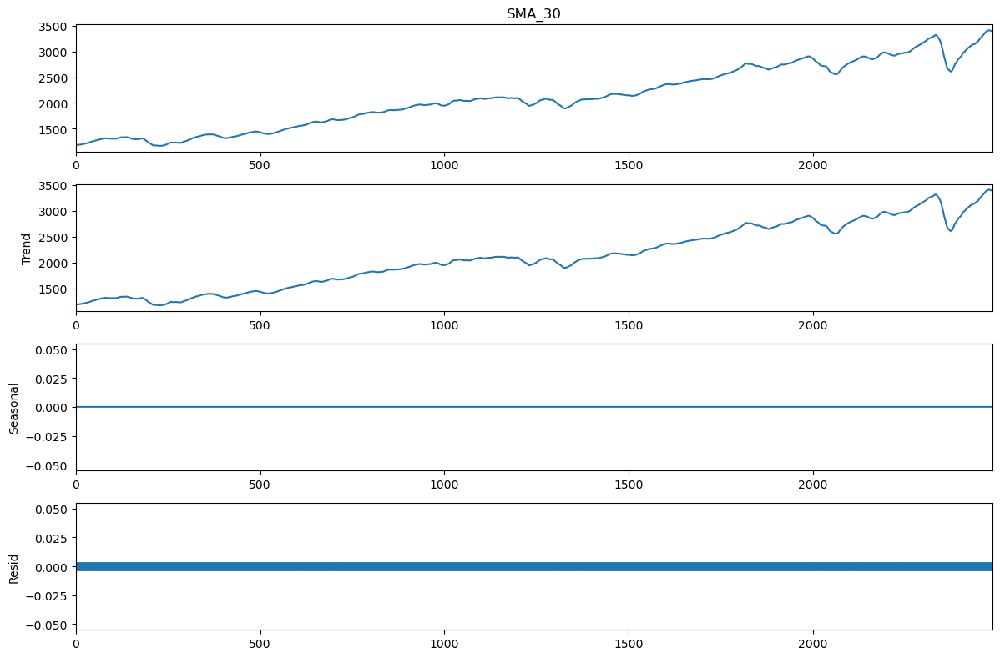

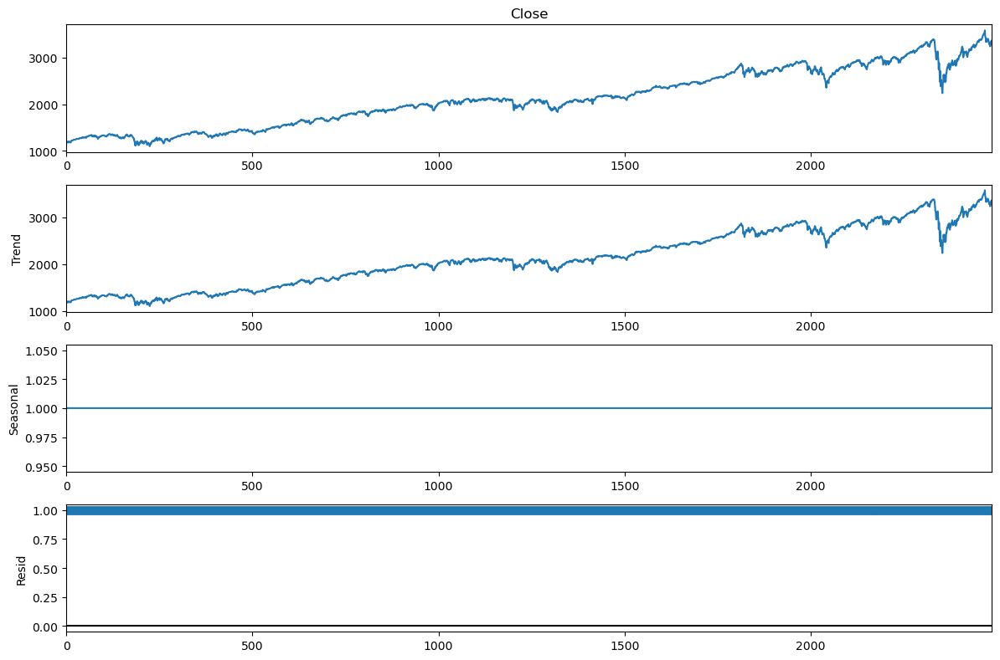

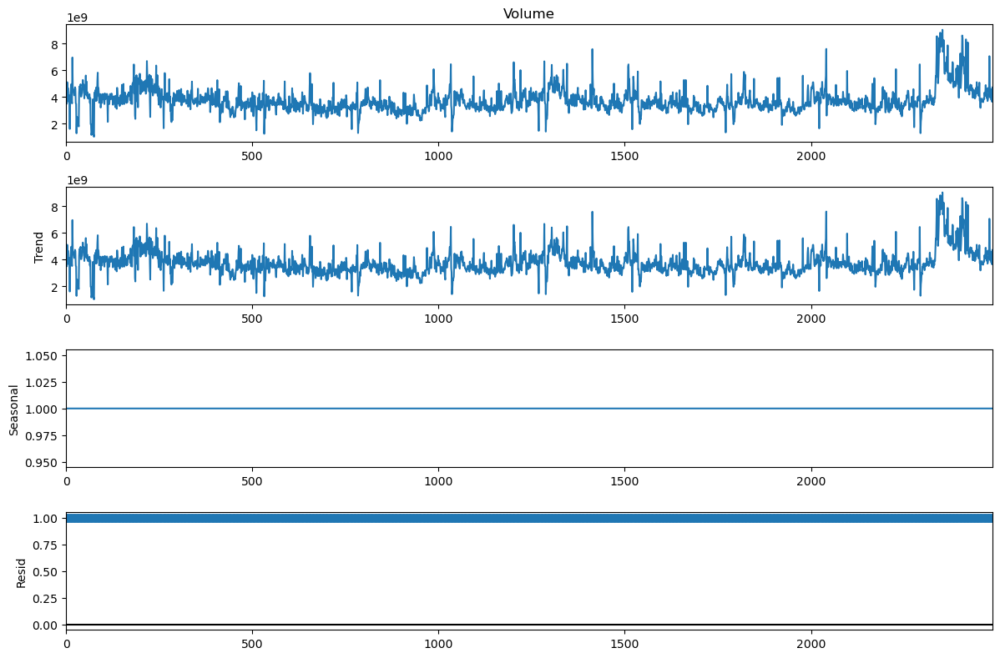

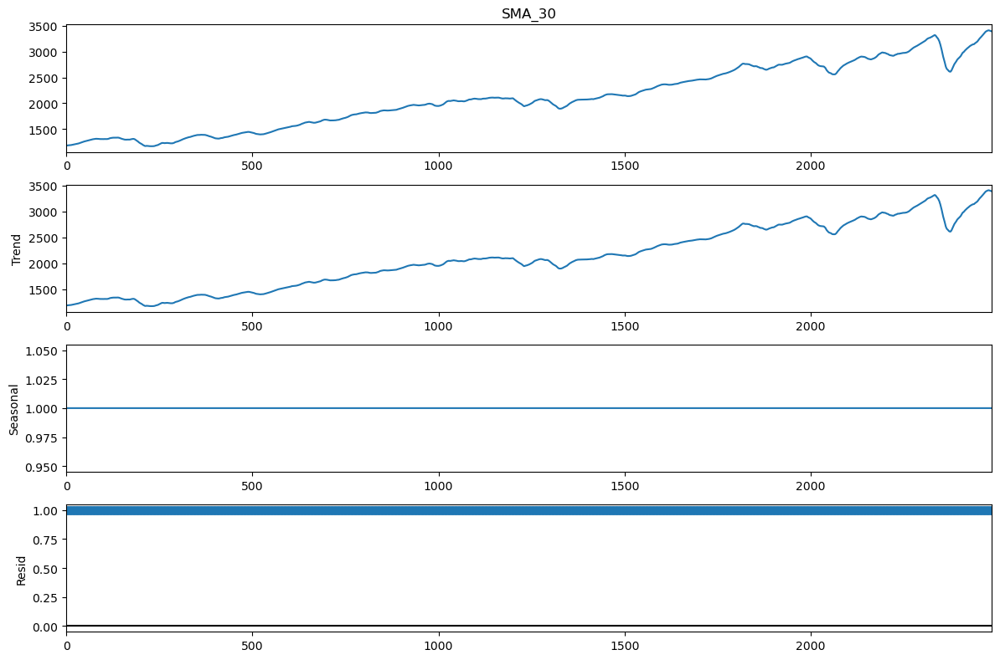

In [286]:
# checking whether series has trend, seasonality or any patterns
trend_check(SP500)

In [287]:
# its evident, we have trend component in the data as expected, but no seasonailty.

In [288]:
# Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test to check for stationarity
stationarity_test(SP500)

Close
KPSS Statistic: 7.840986
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Non-Stationary

--------------------------------------

Volume
KPSS Statistic: 0.679617
Critical Values @ 0.05: 0.46
p-value: 0.015398

Series is Non-Stationary

--------------------------------------

SMA_30
KPSS Statistic: 7.879098
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Non-Stationary

--------------------------------------



C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(


In [289]:
# as expected, all the variables in stock data are Non-Stationary. We will be addressing these by transforming the data. 

## 1. Boxcox Transformation

## 2. diffrencing

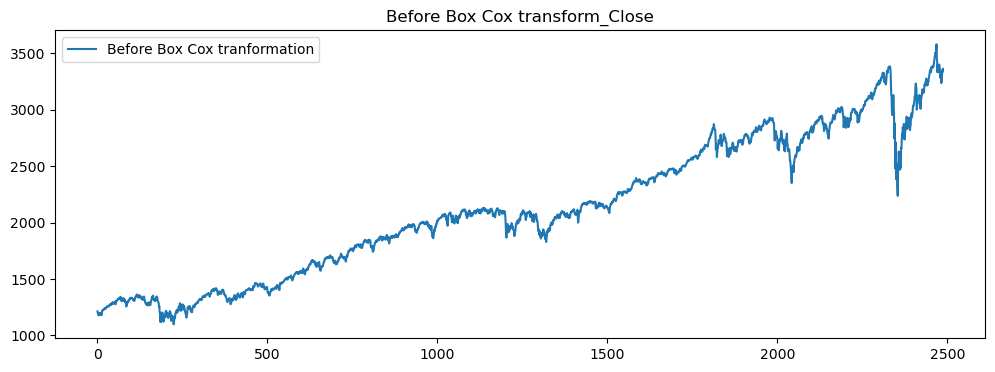

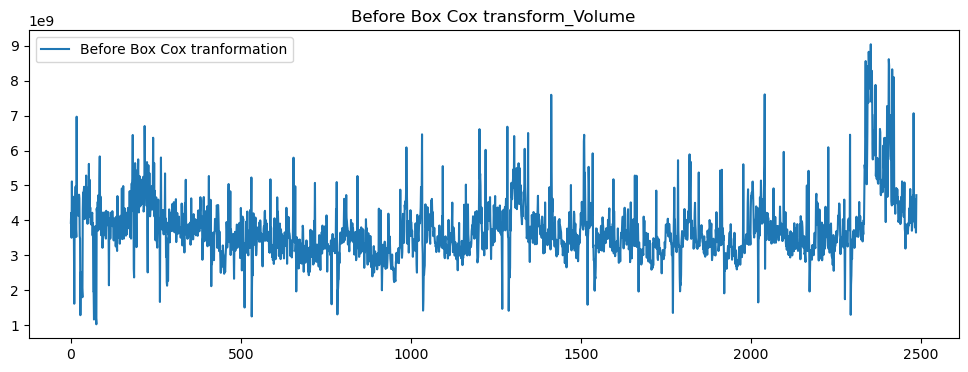

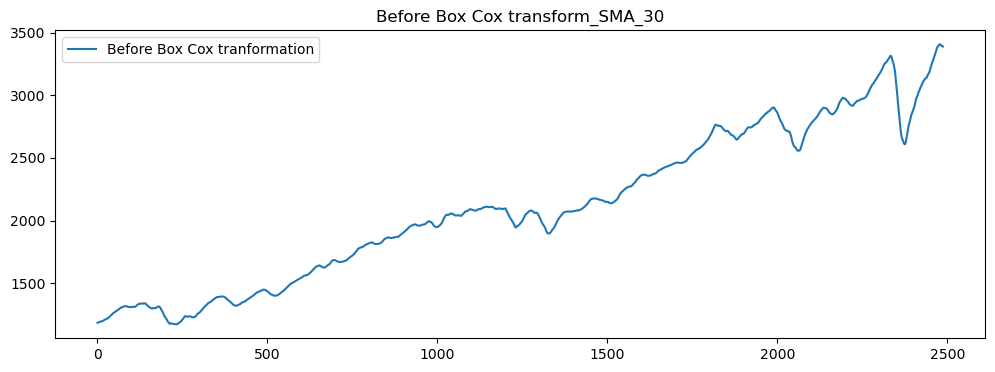

In [290]:
# series before boxcox transformation
plot_before_boxcox(SP500)

In [291]:
#Using Boxcox method

from scipy.stats import boxcox

SP500_boxcox = pd.DataFrame(columns=[SP500.columns])  # Empty dataframe

for col in SP500.columns:
    temp_data = pd.Series(boxcox(SP500[col], lmbda=0), index = SP500.index, name = col)
    SP500_boxcox[col] = temp_data

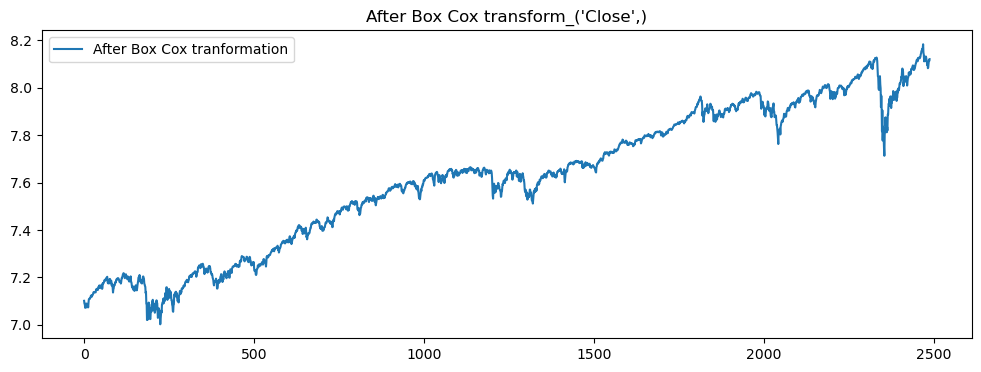

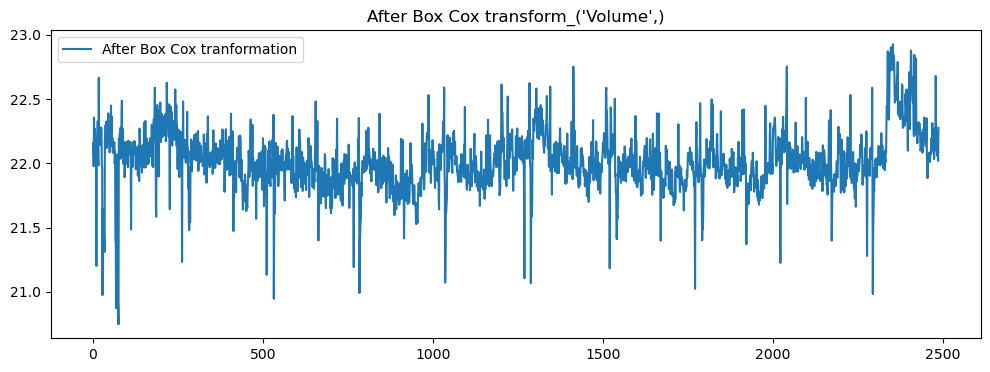

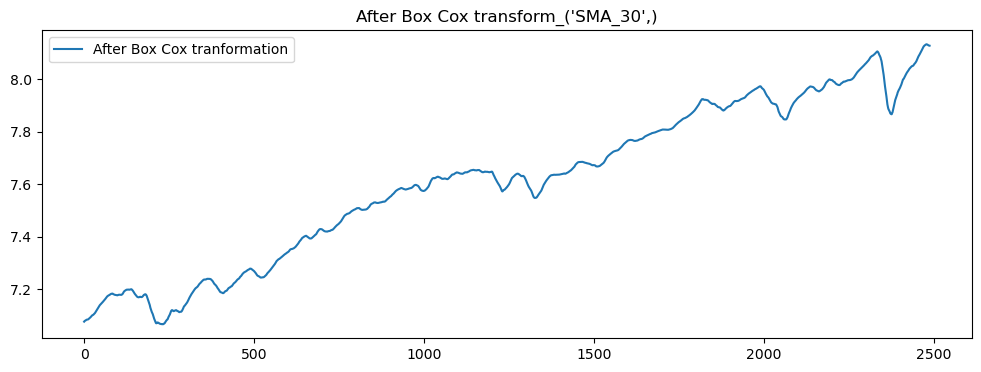

In [292]:
# Plotting all boxcox transformed columns
plot_after_boxcox(SP500_boxcox)

In [293]:
# WE CAN SEE, THE SCALES HAVE CHANGED FOR THE DATA. lETS PERFORM DIFFERENCING TO REMOVE TREND NEXT.

In [294]:
# Differencing to remove trend
SP500_boxcox_diff = SP500_boxcox.diff().dropna() # Differencing all variables to get rid of Stationarity

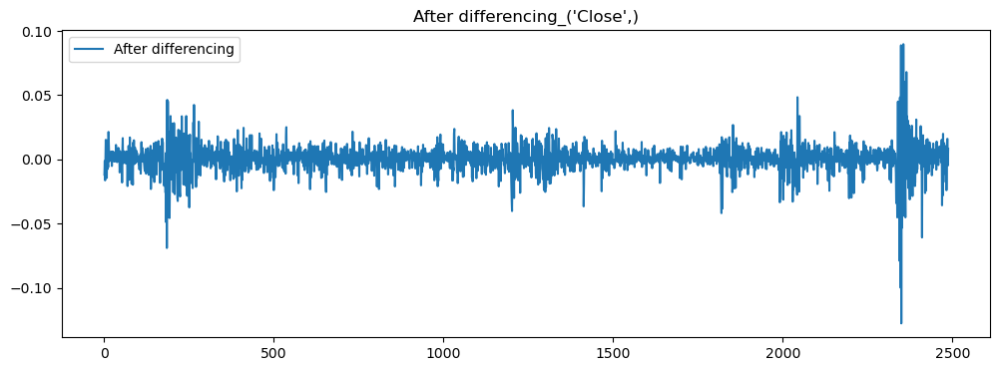

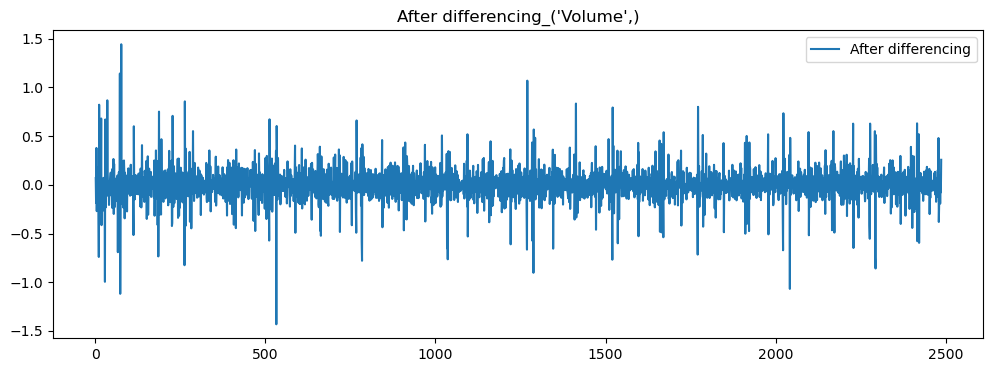

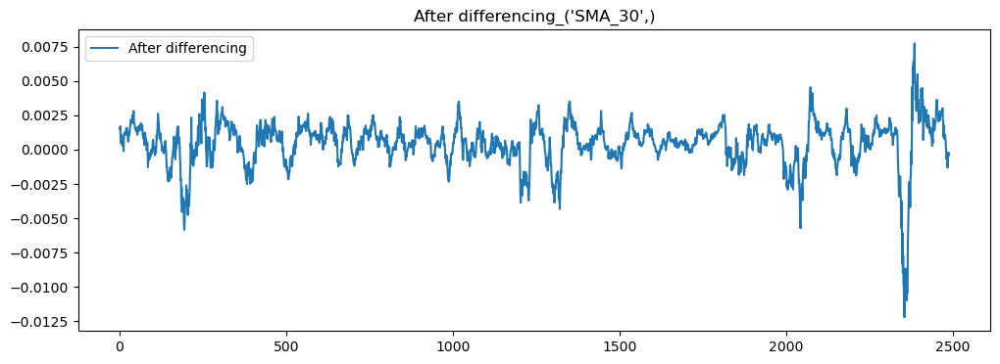

In [295]:
# Plotting all data_differenced columns
plot_after_differencing(SP500_boxcox_diff)

In [296]:
#lets check for stationarity again

In [297]:
stationarity_test(SP500_boxcox_diff)

('Close',)
KPSS Statistic: 0.016419
Critical Values @ 0.05: 0.46
p-value: 0.100000

Series is Stationary

--------------------------------------

('Volume',)
KPSS Statistic: 0.020061
Critical Values @ 0.05: 0.46
p-value: 0.100000

Series is Stationary

--------------------------------------

('SMA_30',)
KPSS Statistic: 0.029258
Critical Values @ 0.05: 0.46
p-value: 0.100000

Series is Stationary

--------------------------------------



C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(
C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(
C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(


In [298]:
# as expected, all the variables in stock data have become Stationary.

#### BUILDING VAR MODEL

In [299]:
# Test-Train Split of differentiated data

# Keeping 70% values as train
train_len = int(SP500.shape[0]*0.7)
test_len = int(SP500.shape[0]) - int(SP500.shape[0]*0.7)

# Train data - differenced
train_data_boxcox = SP500_boxcox[:train_len]
train_data_boxcox_diff = SP500_boxcox_diff[:train_len-1]

# Test data - differenced
test_data_boxcox = SP500_boxcox[train_len:]
test_data_boxcox_diff = SP500_boxcox_diff[train_len-1:]

In [300]:
from statsmodels.tsa.api import VAR

model = VAR(train_data_boxcox_diff)

C:\Users\91877\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [301]:
# To select the lag order
x = model.select_order(maxlags=50)
x.summary()

,AIC,BIC,FPE,HQIC
0,-26.12,-26.11,4.545e-12,-26.11
1,-29.16,-29.12,2.174e-13,-29.14
2,-29.19,-29.12,2.106e-13,-29.16
3,-29.22,-29.12,2.045e-13,-29.18
4,-29.25,-29.12,1.986e-13,-29.20
5,-29.26,-29.11,1.958e-13,-29.20
6,-29.26,-29.08,1.952e-13,-29.20
7,-29.26,-29.05,1.959e-13,-29.18
8,-29.27,-29.03,1.940e-13,-29.18
9,-29.28,-29.01,1.924e-13,-29.18


In [302]:
# Providing maxlags as 30 (minimum AIC vaue)
results = model.fit(maxlags =30, ic = 'aic')

In [303]:
# Printing the results - Evaluation parameters, lag coefficients, etc.
results.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 24, Mar, 2024
Time:                     04:43:48
--------------------------------------------------------------------
No. of Equations:         3.00000    BIC:                   -34.4206
Nobs:                     1710.00    HQIC:                  -34.9681
Log likelihood:           23166.6    FPE:                4.72053e-16
AIC:                     -35.2897    Det(Omega_mle):     4.04052e-16
--------------------------------------------------------------------
Results for equation Close
                coefficient       std. error           t-stat            prob
-----------------------------------------------------------------------------
const              0.000614         0.000242            2.541           0.011
L1.Close          -0.753009         0.295611           -2.547           0.011
L1.Volume         -0.002199         0.001367           -1.609           

In [304]:
# Forecasting using the VAR model
# Selecting the lag value from the above results
lag_order = 30

In [305]:
# Obtaining the forecast values
predicted = results.forecast(y = train_data_boxcox_diff.values[-lag_order:] , steps = test_len)
forecasted = pd.DataFrame(predicted, index = SP500.index[train_len:], columns = SP500.columns)

In [306]:
forecasted.head()

,Close,Volume,SMA_30
1741,0.000012,0.023697,0.001300
1742,0.000324,-0.013936,0.001123
1743,-0.000427,0.015852,0.001041
1744,0.000356,0.050811,0.001303
1745,0.000763,-0.028198,0.001226


In [307]:
# we need to reverse the data transformation to compare results
# Inverted values
forecast_values = invert_transformation(train_data_boxcox, forecasted)

In [308]:
forecast_values.head()

,Close,Volume,SMA_30
1741,2555.271520,3.047457e+09,2507.909096
1742,2556.100102,3.005282e+09,2510.728106
1743,2555.009880,3.053302e+09,2513.344335
1744,2555.918868,3.212452e+09,2516.622012
1745,2557.868865,3.123131e+09,2519.708662


#### Comparing results

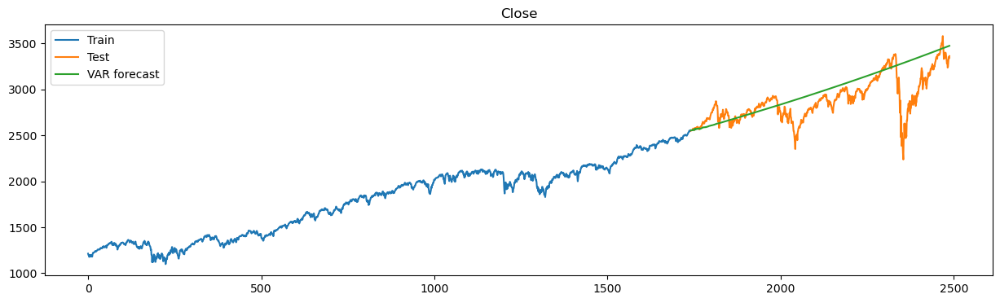

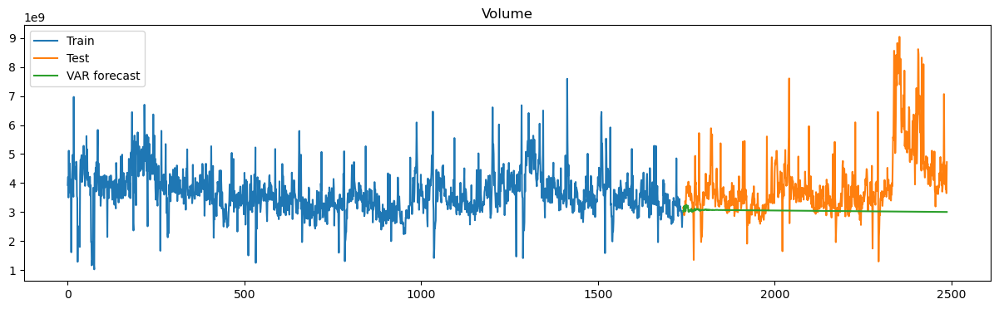

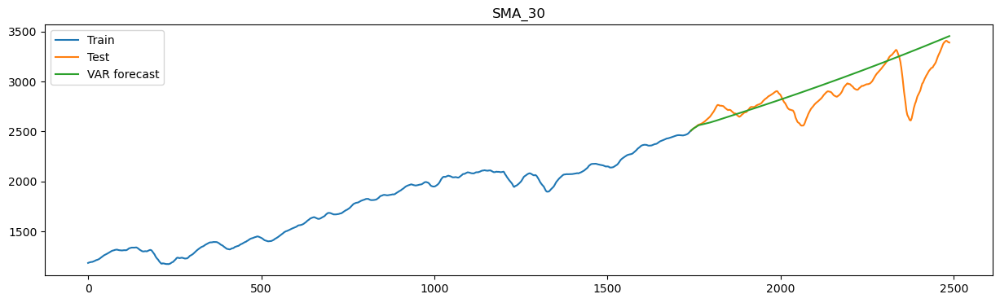

In [309]:
# Printing the train, test and forecasted values
plot_train_test_forecasted(SP500,forecast_values)

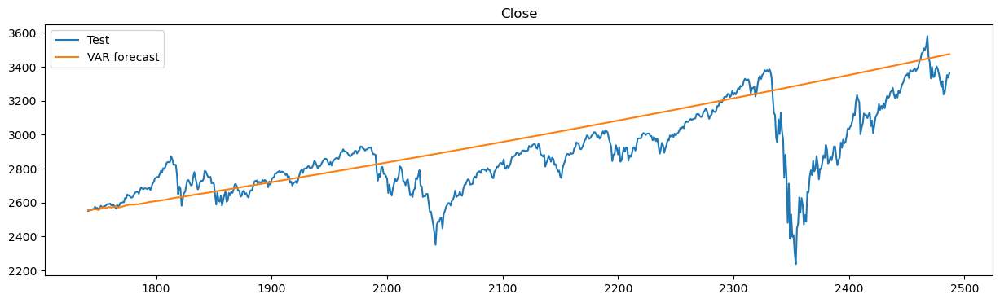

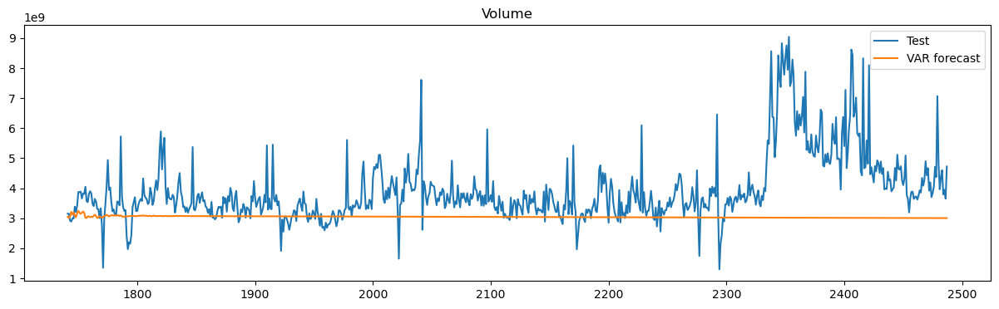

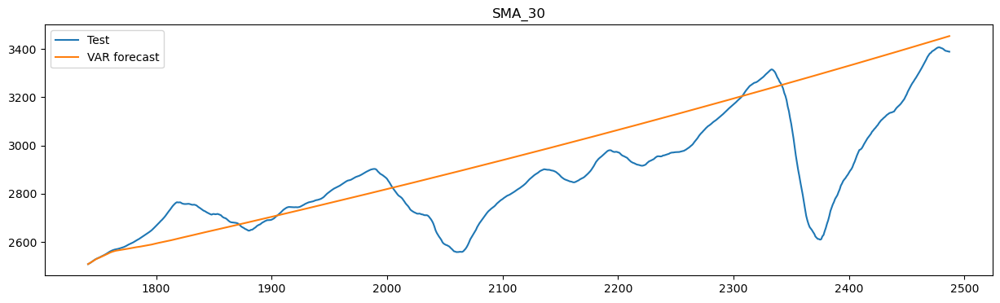

In [310]:
plot_test_forecasted(SP500,forecast_values)

In [311]:
# we are able to see our model was able to capture the trend of the data, which will be used to forecast for future price.

In [312]:
model_evaluation(SP500,forecast_values)

,Column,RMSE,MAPE
0,Close,2.144700e+02,5.31
0,Volume,1.438264e+09,20.93
0,SMA_30,1.973600e+02,4.90


#### PREDICTION OF FUTURE PRICE (BASED ON CLIENT TIME HORIZON)

In [313]:
# as understood, our client wants to be invested during her college time.
# which can be approximated to arounf 5 years in US.
# 5 years of investment  = (trading days in a year) * 5 

In [314]:
# predicing for next 5 years:
predicted_fut = results.forecast(y = test_data_boxcox_diff.values[-lag_order:] , steps = 252*5)
forecasted_fut = pd.DataFrame(predicted_fut, index = range(252*5), columns = SP500.columns)

In [315]:
# reversing data transformation
forecast_values_fut = invert_transformation(test_data_boxcox, forecasted_fut)

In [316]:
forecast_values_fut.tail()

,Close,Volume,SMA_30
1255,5680.279335,4.168311e+09,5646.634940
1256,5682.648954,4.168167e+09,5648.990022
1257,5685.019562,4.168023e+09,5651.346086
1258,5687.391159,4.167879e+09,5653.703132
1259,5689.763745,4.167735e+09,5656.061162


In [317]:
# average annual return
SP500_average_annual_return = round((((forecast_values_fut.iloc[-1][0] - SP500.iloc[-1][0])/SP500.iloc[-1][0])*100)/5 ,2)
SP500_average_annual_return

13.84

### EXPLORING DIFFERENT STOCK COMBINATIONS FOR PORTFOLIO

In [318]:
# as seen above we have average annual return for the next 05 years for 05 selected stocks and the market index.
# AAPL_average_annual_return = 27.67
# AMZN_average_annual_return = 49.46
# JNJ_average_annual_return = 15.67
# MRK_average_annual_return = 10.45
# GOOG_average_annual_return = 28.82
# SP500_average_annual_return = 13.84

### PORTFOLIO COMBINATION #1 (3 STOCKS WITH OPTIMUM RETURNS)

In [319]:
# we have 'AAPL' , 'AMZN' and 'JNJ' in this combination. 
# we will consider same weitage for all.

In [320]:
PORTFOLIO_COMBINATION_1_average_annual_return = round(np.mean([AAPL_average_annual_return ,AMZN_average_annual_return,JNJ_average_annual_return]),0)
PORTFOLIO_COMBINATION_1_average_annual_return

31.0

### PORTFOLIO COMBINATION #2 (4 STOCKS WITH OPTIMUM RETURNS)

In [321]:
PORTFOLIO_COMBINATION_2_average_annual_return = round(np.mean([AAPL_average_annual_return ,AMZN_average_annual_return,JNJ_average_annual_return,GOOG_average_annual_return]),0)
PORTFOLIO_COMBINATION_2_average_annual_return

30.0

### PORTFOLIO COMBINATION #3 (5 STOCKS WITH OPTIMUM RETURNS)

In [322]:
PORTFOLIO_COMBINATION_3_average_annual_return = round(np.mean([AAPL_average_annual_return ,AMZN_average_annual_return,JNJ_average_annual_return,GOOG_average_annual_return,MRK_average_annual_return]),0)
PORTFOLIO_COMBINATION_3_average_annual_return

26.0

In [323]:
# as can be seen, our predicted returns are consistent with what we have found in technical analysis with historic data.

## Observations & Recommendations :

In [324]:
# All of the combinations perform well beyond market.

# As the portfolio 3 has highest predicted return, it becomes a natural choice. 

# Based on our client preference : 
#1. we want to suggest a diverse portfolio which includes stocks from tech and health sector.
#2. with the client's intention of setting up an NGO, a stock from health sector can resonate well with client.
#3. tech stocks have good sharpe ratio and thus can provide stable growth and returns which is alligned with client's requirements.
#4. all the stocks (APPLE , AMAZON and JOHNSON & JOHNSON) are known to be leaders in their respective sectors 
# and all of them stand for quality and known for their consumer centric approach  , good management and competitive advange over their peers.
#5. all of these will ensure the companies will grow steadily and will continue to be a leader in foreseeable future.